In [ ]:
import pandas as pd
import numpy as np
import glob
import os
import matplotlib.pyplot as plt
import h5py
import json

from scipy.ndimage import gaussian_filter


!pip install lmfit

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 100.2/100.2 kB 6.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 60.1/60.1 kB 3.3 MB/s eta 0:00:00


In [ ]:


from google.colab import drive
drive.mount('/content/drive')


Mounted at /content/drive


In [ ]:
from google.colab import auth
auth.authenticate_user()

import gspread
from google.auth import default
creds, _ = default()

gc = gspread.authorize(creds)

In [ ]:
#df = pd.read_excel("drive/Shareddrives/SpinBot/master_new.xlsx")
#url = 'https://docs.google.com/spreadsheets/d/1yuJgKXeS2OeKU235OMXS8dfLSKPl9ZA3VEYHmU7L3tA/export?format=csv'
#df = pd.read_csv(url)
worksheet = gc.open_by_key('1yuJgKXeS2OeKU235OMXS8dfLSKPl9ZA3VEYHmU7L3tA').sheet1
# worksheet = gc.open_by_url('https://docs.google.com/spreadsheets/d/1arRLSuPajnJquG-iX2erXqwIUb7eujh6IArC9tDzEOc/edit?gid=552222426#gid=552222426').sheet1
rows = worksheet.get_all_values()
df = pd.DataFrame.from_records(rows[1:], columns=rows[0])
df["Batch No."] = df["Batch No."].apply(pd.to_numeric)
df

,Batch No.,Identifier UUID,Sample #,Batch Fab Date,Batch Start Time,Perovskite composition,Additive,Additive Conc. (%mol excess),Soln date,6,...,PL Peak AUC Std Dev,PL Peak AUC Mean = area under the curve as calculated explicitly; AUC (area under curve Manual calculation using Trapez),PL Peak Center Std Dev,PL Peak Center Mean,PL Peak FWHM Std Dev,PL Peak FWHM Mean,XRD Alpha Peak Intensity,XRD Alpha Peak Center,XRD Alpha Peak FWHM,XRD Phase Score
0,1,,1,2024-02-22,,FAPbI3,MACl,15,2024-02-16,FAPbI3,...,,,,,,,,,,
1,1,,2,2024-02-22,,FAPbI3,MACl,15,2024-02-16,FAPbI3,...,,,,,,,,,,
2,1,,3,2024-02-22,,FAPbI3,MACl,15,2024-02-16,FAPbI3,...,,,,,,,,,,
3,1,,4,2024-02-22,,FAPbI3,MACl,15,2024-02-16,FAPbI3,...,,,,,,,,,,
4,1,,5,2024-02-22,,FAPbI3,MACl,15,2024-02-16,FAPbI3,...,,,,,,,,,,
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
900,180,,5,,,,,,,,...,,,,,,,,,,
901,181,,6,,,,,,,,...,,,,,,,,,,
902,182,,7,,,,,,,,...,,,,,,,,,,
903,183,,8,,,,,,,,...,,,,,,,,,,


In [ ]:
'''

****START HERE*****



'''

'\n\n****START HERE*****\n\n\n\n'

In [ ]:
# # Copying the data the master sheet

# # Specify the batches you want to copy
# batches_to_copy = [74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 88, 89, 90, 91, 92, 93, 94, 95, 96]  # Add the batch numbers you want to copy

# # Filter the DataFrame for the specified batches and select the desired columns
# columns_to_copy = ['Batch No.', 'Sample #', 'Absorption Area Above UV Curve Ratio: Below Band Gap/Above Band Gap', 'PL Peak Intensity Mean']
# df_to_copy = df[df['Batch No.'].isin(batches_to_copy)][columns_to_copy]

# # Convert the DataFrame to a list of lists for appending to Google Sheets
# rows_to_append = df_to_copy.astype(str).values.tolist()

# # Append the rows to the Google Sheet
# worksheet2.append_rows(rows_to_append)

# print(f"Added {len(rows_to_append)} rows to the Google Sheet.")

# # Optionally, you can also update your local copy of the Google Sheet data
# rows = worksheet2.get_all_values()
# df2 = pd.DataFrame.from_records(rows[1:], columns=rows[0])

# print("\nUpdated Google Sheet data:")
# print(df2.tail())

# # If you want to ensure specific columns are float type in df2
# float_columns = ['Absorption Area Above UV Curve Ratio: Below Band Gap/Above Band Gap', 'PL Peak Intensity Mean']
# for col in float_columns:
#     if col in df2.columns:
#         df2[col] = pd.to_numeric(df2[col], errors='coerce')

# print("\nDataFrame with float columns:")
# print(df2.dtypes)

In [ ]:
def find_nearest(array, value):
    """Find the index of the nearest value in an array."""
    array = np.asarray(array)
    idx = (np.abs(array - value)).argmin()
    return idx
def index_of(arrval, value):
    """Return index of array *at or below* value."""
    if value < min(arrval):
        return 0
    return max(np.where(arrval <= value)[0])

def wavelength_to_energy(wavelength_nm):
    energy_eV = 1240 / wavelength_nm
    return energy_eV

def apply_jacobian(signal, wavelength_nm):
    energy_eV = wavelength_to_energy(wavelength_nm)
    jacobian = (1240) / (energy_eV ** 2)
    transformed_signal = signal * jacobian
    return transformed_signal

In [ ]:
# define a function that grabs spec_run h5 file for a given sample row
# !pip install ipdb
# import ipdb

data_dir = "/content/drive/Shareddrives/SpinBot/Binary Antisolvent Project/Data/In line"
# data_dir = "/content/drive/Shareddrives/SpinBot"
#data_dir_Abby = "/content/drive/Shareddrives/SpinBot/SolventMixing/Data/In line characterization"
def get_spec_run_filepath(sample_row):
    spec_run_fname_short = list(sample_row['spec_run'])[0]
    # print(spec_run_fname_short)
    if spec_run_fname_short == "":
        return None

    # ipdb.set_trace()
    main_path = glob.glob(data_dir+ f"/*/{spec_run_fname_short}")
    if main_path == []:
        main_path = glob.glob(data_dir+ f"/*/{spec_run_fname_short}")
    if main_path == []:
        main_path = glob.glob(data_dir+ f"/*/*/{spec_run_fname_short}")
    if main_path == []:
        return None
    # ipdb.set_trace()

    spec_run_fname = main_path[0]
    return spec_run_fname

# get_spec_run_filepath(sample)

In [ ]:
#### AFTER RUNING HELPER FUNCTIONS, START HERE FOR UV-Vis (WL)


from scipy.stats import linregress

# for b in {61, 62, 63, 64, 65, 66}:
for b in range(179, 180, 1):
  batch = df[df['Batch No.'] == b]
  # display(batch)
  num_samples = len(batch)
  for s in range(1, num_samples + 1):
  # for s in {2}:
    sample = batch[batch['Sample #'] == str(s)]
    # print(f"Batch {b}, Sample {s}:")
    file_path = get_spec_run_filepath(sample)
    if not file_path:
        continue
    with h5py.File(file_path, 'r') as hf:

        photo = hf['measurement/spec_run/photo'][:]
        wl_dark_int_time = hf['measurement/spec_run/wl_dark_int_time'][()]
        wl_dark_spectrum = hf['measurement/spec_run/wl_dark_spectrum'][:]
        wl_samp_int_times = hf['measurement/spec_run/wl_spectra_int_times'][:]
        wl_samp_spectrum = hf['measurement/spec_run/wl_spectra'][:]
        wl_ref_int_time = hf['measurement/spec_run/wl_ref_int_time'][()]
        wl_ref_spectrum = hf['measurement/spec_run/wl_ref_spectrum'][:]
        wl_wave_axis = hf['measurement/spec_run/wl_wls'][:]
        settings_gr = hf['app/settings']
        sample_id = settings_gr.attrs['sample']


        '''
        WL Analysis
        '''

        # print("File data has been read successfully.")
        sample_spectrum_corr = wl_samp_spectrum/wl_samp_int_times.reshape((8,1)) - wl_dark_spectrum/wl_dark_int_time
        sample_spectrum_corr_mean = np.mean(sample_spectrum_corr, axis=0) #Average individual spectra per sample
        sample_spectrum_final = sample_spectrum_corr_mean / (wl_ref_spectrum/wl_ref_int_time - wl_dark_spectrum/wl_dark_int_time) #Divide by the reference

        # plt.figure()
        # plt.plot(wl_wave_axis, sample_spectrum_final, label=f'Sample Transmission Spectrum, Batch {b}, Sample {s}')
        # plt.title(f'Sample Transmission Spectrum, Batch {b}, Sample {s}')
        # plt.xlabel('Wavelength (nm)')
        # plt.ylabel('Transmission')

        #
        wl0 = 550
        wl1 = 800
        int_slice = (wl_wave_axis>=wl0) & (wl_wave_axis<=wl1)

        integrated_transmittance = np.sum(sample_spectrum_final[int_slice])
        mean_transmittance = np.mean(sample_spectrum_final[int_slice])

        absorption_spectrum = -np.log(sample_spectrum_final)
        wl_energy_axis = wavelength_to_energy(wl_wave_axis)
        absorption_spectrum_jacobian = apply_jacobian(absorption_spectrum, wl_energy_axis)

        a_coefficient = absorption_spectrum * 2.303 / (0.00004)
        log_A = np.log(a_coefficient)



        # CHANGE THIS NUMBERS IF THE ABSORPTION EDGE IS OUT OF RANGE
        energy_boundaries = np.array([1.4, 1.7])
        energies_range = (wl_energy_axis >= energy_boundaries[0]) & (wl_energy_axis <= energy_boundaries[1])


        energies_cut = wl_energy_axis[energies_range]
        signal_cut = absorption_spectrum_jacobian[energies_range]
        log_signal_cut = log_A[energies_range]


            #Additonal functions

        def find_best_linear_region(x_data, y_data, window_min, window_max, r_squared_threshold):
            best_start = 0
            best_end = window_min
            best_r_squared = 0
            best_slope = 0
            best_intercept = 0

            for window_size in range(window_min, window_max + 1):
                for start in range(len(x_data) - window_size + 1):
                    end = start + window_size
                    x = x_data[start:end]
                    y = y_data[start:end]
                    r_squared, slope, intercept = linear_fit(x, y)

                    if r_squared > best_r_squared and r_squared >= r_squared_threshold and slope>0:
                        best_r_squared = r_squared
                        best_start = start
                        best_end = end
                        best_slope = slope
                        best_intercept = intercept

            return best_start, best_end, best_r_squared, best_slope, best_intercept

        def linear_fit(x_axis, y_axis):
            slope, intercept, r_value, _, _ = linregress(x_axis, y_axis)
            return r_value**2, slope, intercept

        #%%


        def perform_and_plot_linear_fit(x_data, y_data, window_min, window_max, r_squared_threshold, types):
            best_start, best_end, best_r_squared, best_slope, best_intercept = find_best_linear_region(x_data, y_data, window_min, window_max, r_squared_threshold)

            if best_r_squared < r_squared_threshold:
                return 0, 0, 0, 0


            x_cut = energies_cut[best_start:best_end]
            window_size = best_end - best_start
            x_intercept = -best_intercept/best_slope

            # plt.figure()
            # plt.plot(x_data, y_data, label="Original Data")
            # plt.plot(x_cut, best_intercept + best_slope * x_cut, 'r', label="Linear Fit")
            # plt.axvline(energies_cut[best_start], color='g', linestyle='--')
            # plt.axvline(energies_cut[best_end-1], color='g', linestyle='--')
            # plt.legend()
            # plt.xlabel("X")
            # plt.ylabel("Y")
            # plt.title(f"Linear Region Fit, {types}, Batch {b}, Sample {s}")
            # save_plot(plt, save_dir, f'Linear_Region_Fit_{type}.png')


            return window_size, best_slope, x_intercept, best_r_squared


        #%%

        # =============================================================================
        # PERFORM AUTOMATED LINEAR FIT
        # =============================================================================

        window_lin, slope_lin, intercept_lin, r_sq_lin = perform_and_plot_linear_fit(energies_cut, signal_cut, window_min=55, window_max=150, r_squared_threshold=0.95, types = "Lin")
        if window_lin != 0:
            a = 1
            # print(f"The final window size used for the best linear fit was: {window_lin} (linear scale)")
            # print(f"The final slope of the best linear fit is: {slope_lin} (linear scale)")
            # print(f"The final x-intercept of the best linear fit is: {intercept_lin} (linear scale)")
            # print(f"The final R squared of the best linear fit is: {r_sq_lin} (linear scale)")
            print(f"Batch {b}, Sample {s}, Window Size times Slope : {window_lin*slope_lin} (linear scale)")
        else:
            a = 1
            print("No suitable linear region found. (linear scale)")


        window_log, slope_log, intercept_log, r_sq_log = perform_and_plot_linear_fit(energies_cut, log_signal_cut, window_min=70, window_max=150, r_squared_threshold=0.95, types = "Log")
        if window_log != 0:
            # print(f"The final window size used for the best linear fit was: {window_log} (log scale)")
            # print(f"The final slope of the best linear fit is: {slope_log} (log scale)")
            # # print(f"The final x-intercept of the best linear fit is: {intercept_log} (log scale)")
            # # print(f"The final R squared of the best linear fit is: {r_sq_log} (log scale)")
            # print(f"Window Size times Slope : {window_log*slope_log} (log scale)")

            # print('Urbach Energy is', round(1/intercept_log, 4), 'eV')
            urbach_energy = round(1/slope_log, 4)
            # # print('Urbach Energy is', round(1/slope_log, 4), 'eV')
        else:
            print("No suitable linear region found. (log scale)")
            urbach_energy = None




        print(f"Batch {b}, Sample {s}: {mean_transmittance=}")
        print(f"Batch {b}, Sample {s}: {urbach_energy=}")


        uuid = list(sample['Identifier UUID'])[0]

        # Find the row in the DataFrame where the UUID matches
        # row_index = df[df['Identifier UUID'] == uuid].index[0]
        row_index = df[df['spec_run'].str.contains(file_path.split('/')[-1])].index[0]

        col_index_urbach_energy = df.columns.get_loc('Urbach Energy')


        # Update the cell in the Google Sheet for PL_peak_intensity_std
        cell = worksheet.cell(row_index + 2, col_index_urbach_energy + 1)  # Add 1 to row and column indices for Google Sheets
        cell.value = urbach_energy
        worksheet.update_cell(row_index + 2, col_index_urbach_energy + 1, urbach_energy)

        # Get the column index for the 'Mean Transmittance' column
        col_index = df.columns.get_loc('Mean Transmittance')

        # Update the cell in the Google Sheet
        cell = worksheet.cell(row_index + 2, col_index + 1)  # Add 1 to row and column indices for Google Sheets
        cell.value = mean_transmittance
        worksheet.update_cell(row_index + 2, col_index + 1, mean_transmittance)









IndexError: list index out of range

In [ ]:
# from scipy.stats import linregress
# import math

# sigma = 15  # Adjust sigma for different levels of smoothing

# # for b in {61, 62, 63, 64, 65, 66}:
# for b in range(10,97,1):
#   batch = df[df['Batch No.'] == b]
#   # display(batch)
#   num_samples = len(batch)
#   for s in range(1, num_samples + 1):
#   # for s in {1}:
#     sample = batch[batch['Sample #'] == str(s)]
#     # print(f"Batch {b}, Sample {s}:")
#     file_path = get_spec_run_filepath(sample)
#     if not file_path:
#         continue
#     with h5py.File(file_path, 'r') as hf:

#         photo = hf['measurement/spec_run/photo'][:]
#         wl_dark_int_time = hf['measurement/spec_run/wl_dark_int_time'][()]
#         wl_dark_spectrum = hf['measurement/spec_run/wl_dark_spectrum'][:]
#         wl_samp_int_times = hf['measurement/spec_run/wl_spectra_int_times'][:]
#         wl_samp_spectrum = hf['measurement/spec_run/wl_spectra'][:]
#         wl_ref_int_time = hf['measurement/spec_run/wl_ref_int_time'][()]
#         wl_ref_spectrum = hf['measurement/spec_run/wl_ref_spectrum'][:]
#         wl_wave_axis = hf['measurement/spec_run/wl_wls'][:]
#         settings_gr = hf['app/settings']
#         sample_id = settings_gr.attrs['sample']


#         '''
#         WL Analysis
#         '''

#         sample_spectrum_corr = wl_samp_spectrum/wl_samp_int_times.reshape((8,1)) - wl_dark_spectrum/wl_dark_int_time
#         sample_spectrum_corr_mean = np.mean(sample_spectrum_corr, axis=0) #Average individual spectra per sample
#         sample_spectrum_final = sample_spectrum_corr_mean / (wl_ref_spectrum/wl_ref_int_time - wl_dark_spectrum/wl_dark_int_time) #Divide by the reference

#         wl_energy_axis = wavelength_to_energy(wl_wave_axis)
#         sample_spectrum_final_jacobian = apply_jacobian(sample_spectrum_final, wl_energy_axis)


#         # Apply Gaussian smoothing
#         smoothed_spectrum1 = gaussian_filter(sample_spectrum_final_jacobian, sigma=sigma)
#         absorption = -np.log10(smoothed_spectrum1)
#         absorption_non_smooth = -np.log10(sample_spectrum_final_jacobian)

#         # Apply Gaussian smoothing
#         smoothed_spectrum = gaussian_filter(sample_spectrum_final, sigma=sigma)

#         # Calcauting Area for one sample!

#         # Define energy ranges
#         mask1 = (wl_energy_axis >= 1.43) & (wl_energy_axis <= 2.5)
#         x_selected1 = wl_energy_axis[mask1]
#         y_selected1 = absorption[mask1]

#         mask2 = (wl_energy_axis >= 1.25) & (wl_energy_axis <= 1.43)
#         x_selected2 = wl_energy_axis[mask2]
#         y_selected2 = absorption[mask2]

#         # Area under the curve for each energy range
#         area_under_curve1 = -np.trapz(y_selected1, x_selected1)
#         area_under_curve2 = -np.trapz(y_selected2, x_selected2)


#         # Limit data between 500 and 865 nm
#         mask = (wl_wave_axis >= 500) & (wl_wave_axis <= 855) # 855
#         x_selected = wl_wave_axis[mask]
#         y_selected = smoothed_spectrum[mask]

#         # Maximum transmission level (e.g., 1.0)
#         transmission_of_interest = y_selected[-1]

#         # Identifying the wavelength where the max_transmission occurs first, then taking the area from that wavelength
#         indices = np.where(y_selected >= transmission_of_interest)[0]

#         # Select the first occurrence
#         first_index = indices[0]

#         # Area under the curve
#         area_under_curve = np.trapz(y_selected[0:first_index], x_selected[0:first_index])

#         # Area above the curve
#         area_above_curve = np.trapz([transmission_of_interest] * len( x_selected[0:first_index]),  x_selected[0:first_index]) - area_under_curve


#         print(f"Batch {b}, Sample {s}: {area_under_curve=}")
#         print(f"Batch {b}, Sample {s}: {area_above_curve=}")

#         print(f"Batch {b}, Sample {s}: {area_under_curve1=}")
#         print(f"Batch {b}, Sample {s}: {area_under_curve2=}")

#         uuid = list(sample['Identifier UUID'])[0]

#         # Find the row in the DataFrame where the UUID matches
#         # row_index = df[df['Identifier UUID'] == uuid].index[0]
#         row_index = df[df['spec_run'].str.contains(file_path.split('/')[-1])].index[0]



#         col_index_area_above_uv_curve = df.columns.get_loc('Area Above UV Curve')

#         # Update the cell in the Google Sheet for Area_above_uv_curve
#         cell = worksheet.cell(row_index + 2, col_index_area_above_uv_curve + 1)  # Add 1 to row and column indices for Google Sheets
#         cell.value = area_above_curve
#         worksheet.update_cell(row_index + 2, col_index_area_above_uv_curve + 1, area_above_curve)

#         # Get the column index for the 'Mean Transmittance' column
#         col_index_area_below_uv_curve = df.columns.get_loc('Area Below UV Curve')

#         # Update the cell in the Google Sheet
#         cell = worksheet.cell(row_index + 2, col_index_area_below_uv_curve + 1)  # Add 1 to row and column indices for Google Sheets
#         cell.value = area_under_curve
#         worksheet.update_cell(row_index + 2, col_index_area_below_uv_curve + 1, area_under_curve)

#         if not math.isnan(area_under_curve1):
#           col_index_area_below_absorbance_curve_above_Eg = df.columns.get_loc('Above Band Gap Area Below Absorbance Curve')
#           # Update the cell in the Google Sheet for Area_above_uv_curve
#           cell = worksheet.cell(row_index + 2, col_index_area_below_absorbance_curve_above_Eg + 1)  # Add 1 to row and column indices for Google Sheets
#           cell.value = area_under_curve1
#           worksheet.update_cell(row_index + 2, col_index_area_below_absorbance_curve_above_Eg + 1, area_under_curve1)

#         if not math.isnan(area_under_curve2):
#           # Get the column index for the 'Mean Transmittance' column
#           col_index_area_below_absorbance_curve_below_Eg = df.columns.get_loc('Below Band Gap Area Below Absorbance Curve')

#           # Update the cell in the Google Sheet
#           cell = worksheet.cell(row_index + 2, col_index_area_below_absorbance_curve_below_Eg + 1)  # Add 1 to row and column indices for Google Sheets
#           cell.value = area_under_curve2
#           worksheet.update_cell(row_index + 2, col_index_area_below_absorbance_curve_below_Eg + 1, area_under_curve2)




<ipython-input-57-2817b24bb44b>:46: RuntimeWarning: invalid value encountered in log10
  absorption = -np.log10(smoothed_spectrum1)
<ipython-input-57-2817b24bb44b>:47: RuntimeWarning: invalid value encountered in log10
  absorption_non_smooth = -np.log10(sample_spectrum_final_jacobian)


Batch 13, Sample 1: area_under_curve=-1.507578448712954
Batch 13, Sample 1: area_above_curve=79.0747351935089
Batch 13, Sample 1: area_under_curve1=nan
Batch 13, Sample 1: area_under_curve2=0.12594831720582136
Batch 13, Sample 2: area_under_curve=-0.2800722952072193
Batch 13, Sample 2: area_above_curve=35.38495203330721
Batch 13, Sample 2: area_under_curve1=nan
Batch 13, Sample 2: area_under_curve2=nan
Batch 13, Sample 3: area_under_curve=0.0
Batch 13, Sample 3: area_above_curve=0.0
Batch 13, Sample 3: area_under_curve1=nan
Batch 13, Sample 3: area_under_curve2=nan
Batch 13, Sample 4: area_under_curve=0.0
Batch 13, Sample 4: area_above_curve=0.0
Batch 13, Sample 4: area_under_curve1=nan
Batch 13, Sample 4: area_under_curve2=nan
Batch 13, Sample 5: area_under_curve=0.0
Batch 13, Sample 5: area_above_curve=0.0
Batch 13, Sample 5: area_under_curve1=nan
Batch 13, Sample 5: area_under_curve2=nan
Batch 13, Sample 6: area_under_curve=-1.7064203123258304
Batch 13, Sample 6: area_above_curve=20

In [ ]:
from scipy.stats import linregress
import math

sigma = 15  # Adjust sigma for different levels of smoothing

for b in range(178,180,1):
  batch = df[df['Batch No.'] == b]
  # display(batch)
  num_samples = len(batch)
  for s in range(1, num_samples + 1):
  # for s in {1}:
    sample = batch[batch['Sample #'] == str(s)]
    # print(f"Batch {b}, Sample {s}:")
    file_path = get_spec_run_filepath(sample)
    if not file_path:
        continue
    with h5py.File(file_path, 'r') as hf:

        photo = hf['measurement/spec_run/photo'][:]
        wl_dark_int_time = hf['measurement/spec_run/wl_dark_int_time'][()]
        wl_dark_spectrum = hf['measurement/spec_run/wl_dark_spectrum'][:]
        wl_samp_int_times = hf['measurement/spec_run/wl_spectra_int_times'][:]
        wl_samp_spectrum = hf['measurement/spec_run/wl_spectra'][:]
        wl_ref_int_time = hf['measurement/spec_run/wl_ref_int_time'][()]
        wl_ref_spectrum = hf['measurement/spec_run/wl_ref_spectrum'][:]
        wl_wave_axis = hf['measurement/spec_run/wl_wls'][:]
        settings_gr = hf['app/settings']
        sample_id = settings_gr.attrs['sample']


        '''
        WL Analysis
        '''

        sample_spectrum_corr = wl_samp_spectrum/wl_samp_int_times.reshape((8,1)) - wl_dark_spectrum/wl_dark_int_time
        sample_spectrum_corr_mean = np.mean(sample_spectrum_corr, axis=0) #Average individual spectra per sample
        sample_spectrum_final = sample_spectrum_corr_mean / (wl_ref_spectrum/wl_ref_int_time - wl_dark_spectrum/wl_dark_int_time) #Divide by the reference

        wl_energy_axis = wavelength_to_energy(wl_wave_axis)
        sample_spectrum_final_jacobian = apply_jacobian(sample_spectrum_final, wl_energy_axis)

        print(f"Batch {b}, Sample {s}")

        #################################################################################
        #################################################################################
        #################################################################################

        # Area from Absorbance Curve

        # Apply Gaussian smoothing to calculate the absorbance
        smoothed_spectrum1 = gaussian_filter(sample_spectrum_final_jacobian, sigma=sigma)
        absorption = -np.log10(smoothed_spectrum1)

        # Define energy ranges
        mask1 = (wl_energy_axis >= 1.43) & (wl_energy_axis <= 2.5)
        x_selected1 = wl_energy_axis[mask1]
        y_selected1 = absorption[mask1]

        mask2 = (wl_energy_axis >= 1.25) & (wl_energy_axis <= 1.43)
        x_selected2 = wl_energy_axis[mask2]
        y_selected2 = absorption[mask2]

        # Area under the curve for each energy range
        Abs_area_under_curve1 = -np.trapz(y_selected1, x_selected1)
        Abs_area_under_curve2 = -np.trapz(y_selected2, x_selected2)

        # Ratio of Area: Above band gap/Below band gap
        Abs_area_ratio = Abs_area_under_curve1/Abs_area_under_curve2

        # print(f"Absorbance: Batch {b}, Sample {s}: {Abs_area_under_curve1=}")
        # print(f"Absorbance: Batch {b}, Sample {s}: {Abs_area_under_curve2=}")


        # uuid = list(sample['Identifier UUID'])[0]

        # Find the row in the DataFrame where the UUID matches
        # row_index = df[df['Identifier UUID'] == uuid].index[0]
        row_index = df[df['spec_run'].str.contains(file_path.split('/')[-1])].index[0]

        if not math.isnan(Abs_area_under_curve1):
          col_index_area_below_absorbance_curve_above_Eg = df.columns.get_loc('Above Band Gap Area Below Absorbance Curve')
          # Update the cell in the Google Sheet for Area_above_uv_curve
          cell = worksheet.cell(row_index + 2, col_index_area_below_absorbance_curve_above_Eg + 1)  # Add 1 to row and column indices for Google Sheets
          cell.value = Abs_area_under_curve1
          worksheet.update_cell(row_index + 2, col_index_area_below_absorbance_curve_above_Eg + 1, Abs_area_under_curve1)

        if not math.isnan(Abs_area_under_curve2):
          # Get the column index for the 'Mean Transmittance' column
          col_index_area_below_absorbance_curve_below_Eg = df.columns.get_loc('Below Band Gap Area Below Absorbance Curve')
          # Update the cell in the Google Sheet
          cell = worksheet.cell(row_index + 2, col_index_area_below_absorbance_curve_below_Eg + 1)  # Add 1 to row and column indices for Google Sheets
          cell.value = Abs_area_under_curve2
          worksheet.update_cell(row_index + 2, col_index_area_below_absorbance_curve_below_Eg + 1, Abs_area_under_curve2)

        if not math.isnan(Abs_area_ratio):
          # Get the column index for the 'Mean Transmittance' column
          col_index_area_below_absorbance_curve_below_Eg = df.columns.get_loc('Absorbance Curve Area Ratio: Above/Below')
          # Update the cell in the Google Sheet
          cell = worksheet.cell(row_index + 2, col_index_area_below_absorbance_curve_below_Eg + 1)  # Add 1 to row and column indices for Google Sheets
          cell.value = Abs_area_ratio
          worksheet.update_cell(row_index + 2, col_index_area_below_absorbance_curve_below_Eg + 1, Abs_area_ratio)


        ################################################################################
        # Adding the area under the absorbance curve but above the minimum in 1.25 - 1.5 eV area

        # Define energy ranges
        mask1 = (wl_energy_axis >= 1.52) & (wl_energy_axis <= 2.5)
        x_selected1 = wl_energy_axis[mask1]
        y_selected1 = absorption[mask1]

        y_of_interest = y_selected1[-1]

        # Calculate the area under the curve and above y_of_interest
        y_above_interest = np.maximum(y_selected1 - y_of_interest, 0)
        area_under_curve1 = -np.trapz(y_above_interest, x_selected1)

        if not math.isnan(area_under_curve1):
          # Get the column index for the 'Mean Transmittance' column
          col_index_area_below_absorbance_curve_below_Eg = df.columns.get_loc('Above Band Gap Area Below Absorbance Curve (lower bound is at Abs. value at band gap)')
          # Update the cell in the Google Sheet
          cell = worksheet.cell(row_index + 2, col_index_area_below_absorbance_curve_below_Eg + 1)  # Add 1 to row and column indices for Google Sheets
          cell.value = area_under_curve1
          worksheet.update_cell(row_index + 2, col_index_area_below_absorbance_curve_below_Eg + 1, area_under_curve1)

        #################################################################################
        #################################################################################
        #################################################################################
        # Area from Transmittance UV Curve

        # Apply Gaussian smoothing to calculate the transmittance
        smoothed_spectrum = gaussian_filter(sample_spectrum_final, sigma=sigma)

        # Limit data between 500 and 865 nm
        mask1 = (wl_wave_axis >= 500) & (wl_wave_axis <= 855)
        x_selected1 = wl_wave_axis[mask1]
        y_selected1 = smoothed_spectrum[mask1]

        # Limit data between 500 and 865 nm
        mask2 = (wl_wave_axis >= 855) & (wl_wave_axis <= 1000)
        x_selected2 = wl_wave_axis[mask2]
        y_selected2 = smoothed_spectrum[mask2]


        # Below Band Gap
        area4_under_curve1 = np.trapz(y_selected1, x_selected1)
        area1_above_curve1 = np.trapz([1] * len( x_selected1),  x_selected1) - area4_under_curve1

        if not math.isnan(area1_above_curve1):
          col_index_area_below_absorbance_curve_above_Eg = df.columns.get_loc('Below Band Gap Absorption Area Above UV Curve')
          # Update the cell in the Google Sheet for Area_above_uv_curve
          cell = worksheet.cell(row_index + 2, col_index_area_below_absorbance_curve_above_Eg + 1)  # Add 1 to row and column indices for Google Sheets
          cell.value = area1_above_curve1
          worksheet.update_cell(row_index + 2, col_index_area_below_absorbance_curve_above_Eg + 1, area1_above_curve1)

        if not math.isnan(area4_under_curve1):
          col_index_area_below_absorbance_curve_above_Eg = df.columns.get_loc('Below Band Gap Absorption Area Below UV Curve')
          # Update the cell in the Google Sheet for Area_above_uv_curve
          cell = worksheet.cell(row_index + 2, col_index_area_below_absorbance_curve_above_Eg + 1)  # Add 1 to row and column indices for Google Sheets
          cell.value = area4_under_curve1
          worksheet.update_cell(row_index + 2, col_index_area_below_absorbance_curve_above_Eg + 1, area4_under_curve1)

        # Above Band Gap
        area3_under_curve2 = np.trapz(y_selected2, x_selected2)
        area2_above_curve2 = np.trapz([1] * len( x_selected2),  x_selected2) - area3_under_curve2

        if not math.isnan(area2_above_curve2):
          # Get the column index for the 'Mean Transmittance' column
          col_index_area_below_absorbance_curve_below_Eg = df.columns.get_loc('Above Band Gap Absorption Area Above UV Curve')
          # Update the cell in the Google Sheet
          cell = worksheet.cell(row_index + 2, col_index_area_below_absorbance_curve_below_Eg + 1)  # Add 1 to row and column indices for Google Sheets
          cell.value = area2_above_curve2
          worksheet.update_cell(row_index + 2, col_index_area_below_absorbance_curve_below_Eg + 1, area2_above_curve2)

        if not math.isnan(area3_under_curve2):
          # Get the column index for the 'Mean Transmittance' column
          col_index_area_below_absorbance_curve_below_Eg = df.columns.get_loc('Above Band Gap Absorption Area Below UV Curve')
          # Update the cell in the Google Sheet
          cell = worksheet.cell(row_index + 2, col_index_area_below_absorbance_curve_below_Eg + 1)  # Add 1 to row and column indices for Google Sheets
          cell.value = area3_under_curve2
          worksheet.update_cell(row_index + 2, col_index_area_below_absorbance_curve_below_Eg + 1, area3_under_curve2)

        # Ratio of Area above the curve: Below band gap/Above Band Gap
        tran_area_ratio = area1_above_curve1/area2_above_curve2

        if not math.isnan(tran_area_ratio):
          # Get the column index for the 'Mean Transmittance' column
          col_index_area_below_absorbance_curve_below_Eg = df.columns.get_loc('Absorpion Area Above UV Curve Ratio: Below Band Gap/Above Band Gap')
          # Update the cell in the Google Sheet
          cell = worksheet.cell(row_index + 2, col_index_area_below_absorbance_curve_below_Eg + 1)  # Add 1 to row and column indices for Google Sheets
          cell.value = tran_area_ratio
          worksheet.update_cell(row_index + 2, col_index_area_below_absorbance_curve_below_Eg + 1, tran_area_ratio)

        # Difference of Area above the curve: Below band gap - Above Band Gap
        tran_area_diff = area1_above_curve1 - area2_above_curve2

        if not math.isnan(tran_area_diff):
          # Get the column index for the 'Mean Transmittance' column
          col_index_area_below_absorbance_curve_below_Eg = df.columns.get_loc('Absorption Areas from UV Curve Difference: Below Band Gap - Above Band Gap')
          # Update the cell in the Google Sheet
          cell = worksheet.cell(row_index + 2, col_index_area_below_absorbance_curve_below_Eg + 1)  # Add 1 to row and column indices for Google Sheets
          cell.value = tran_area_diff
          worksheet.update_cell(row_index + 2, col_index_area_below_absorbance_curve_below_Eg + 1, tran_area_diff)

        ################################################################################
        # Adding the bounded area bove the transmittance curve bounded above by the transmittance value at band gap

        # Limit data between 500 and 865 nm
        mask = (wl_wave_axis >= 500) & (wl_wave_axis <= 855) # 855
        x_selected = wl_wave_axis[mask]
        y_selected = smoothed_spectrum[mask]

        # Maximum transmission level (e.g., 1.0)
        transmission_of_interest = y_selected[-1]

        # Identifying the wavelength where the max_transmission occurs first, then taking the area from that wavelength
        indices = np.where(y_selected >= transmission_of_interest)[0]

        # Select the first occurrence
        first_index = indices[0]

        # Area under the curve
        area_under_curve = np.trapz(y_selected[0:first_index], x_selected[0:first_index])

        # Area above the curve
        area_above_curve = np.trapz([transmission_of_interest] * len( x_selected[0:first_index]),  x_selected[0:first_index]) - area_under_curve

        if not math.isnan(area_above_curve):
          # Get the column index for the 'Mean Transmittance' column
          col_index_area_below_absorbance_curve_below_Eg = df.columns.get_loc('Below Band Gap Absorption Area Above UV Curve (upper bound is at transm. value at band gap)')
          # Update the cell in the Google Sheet
          cell = worksheet.cell(row_index + 2, col_index_area_below_absorbance_curve_below_Eg + 1)  # Add 1 to row and column indices for Google Sheets
          cell.value = area_above_curve
          worksheet.update_cell(row_index + 2, col_index_area_below_absorbance_curve_below_Eg + 1, area_above_curve)





IndexError: list index out of range

In [ ]:
#### AFTER RUNING HELPER FUNCTIONS, START HERE FOR PL



from lmfit.models import LinearModel, PseudoVoigtModel, GaussianModel


# for b in {61, 62, 63, 64, 65, 66}:
for b in range(74,80,1):
# for b in range(1,53,1):
  batch = df[df['Batch No.'] == b]
  # display(batch)
  num_samples = len(batch)
  for s in range(1, num_samples + 1):
    sample = batch[batch['Sample #'] == str(s)]
    # print(f"Batch {b}, Sample {s}:")
    file_path = get_spec_run_filepath(sample)
    if not file_path:
        continue
    with h5py.File(file_path, 'r') as hf:

        photo = hf['measurement/spec_run/photo'][:]
        dark_int_time = hf['measurement/spec_run/pl_dark_int_time'][()]
        dark_spectrum = hf['measurement/spec_run/pl_dark_spectrum'][:]
        spec_int_times = hf['measurement/spec_run/pl_spectra_int_times'][:]
        spectra = hf['measurement/spec_run/pl_spectra'][:]
        ref_int_time = hf['measurement/spec_run/pl_ref_int_time'][()]
        ref_spectrum = hf['measurement/spec_run/pl_ref_spectrum'][:]
        wls = hf['measurement/spec_run/pl_wls'][:]
        settings_gr = hf['app/settings']
        sample_id = settings_gr.attrs['sample']


        '''
        PL Analysis
        '''

        p1_intensity_array = []
        p1_center_array = []
        # p1_amplitude_array = []
        p1_fwhm_array = []

        # print("File data has been read successfully.")
        # plt.figure(figsize=(10, 6))
        for i in range(spectra.shape[0]):
          # time_normalized = np.divide((spectra[i] - dark_spectrum), spec_int_times[i])
          time_normalized = np.divide(spectra[i] , spec_int_times[i]) - np.divide(dark_spectrum, dark_int_time)

          lowQ_idx = find_nearest(wls, 650)
          highQ_idx = find_nearest(wls, 950)

          x = wls[lowQ_idx:highQ_idx]
          y = time_normalized[lowQ_idx:highQ_idx]


          energies = wavelength_to_energy(x)
          transformed_signal = apply_jacobian(y, x)

          bkg = LinearModel()

          pars = bkg.guess(transformed_signal, x=energies)

          peak1 = PseudoVoigtModel(prefix='p1_')
          pars.update(peak1.make_params(center=1.55,
                                    sigma=.1,
                                    amplitude=max(spectra[i])/5))
          pars['p1_center'].min = 1.4
          pars['p1_center'].max = 1.7

          mod = bkg + peak1

          out = mod.fit(transformed_signal, pars, x=energies)

          # out = mod.fit(time_normalized, pars, x=wls)


          def get_color(i, colors):
                  # Use modulo to ensure the index is within the range of the list
            return colors[i % len(colors)]
          colors = ['red', 'orange', 'olive', 'green', 'teal', 'black', 'darkviolet', 'dodgerblue']

          # c = get_color(i, colors)
          # plt.plot(energies, transformed_signal, ':', color=c)
          # plt.plot(energies, out.best_fit, '-', color=c, label=f'Batch {b}, Sample {s}, Position {str(i+1)}')


          p1_intensity_array.append(out.params['p1_height'].value)
          p1_center_array.append(out.params['p1_center'].value)
          # p1_amplitude_array.append(out.params['p1_amplitude'].value)
          p1_fwhm_array.append(out.params['p1_fwhm'].value)

        # plt.show()
        PL_peak_intensity_std = np.std(p1_intensity_array)
        PL_peak_intensity_mean = np.mean(p1_intensity_array)
        PL_peak_center_std = np.std(p1_center_array)
        PL_peak_center_mean = np.mean(p1_center_array)
        # PL_peak_amplitude_std = np.std(p1_amplitude_array)
        # PL_peak_amplitude_mean = np.mean(p1_amplitude_array)
        PL_peak_fwhm_std = np.std(p1_fwhm_array)
        PL_peak_fwhm_mean = np.mean(p1_fwhm_array)


        # print(f"Batch {b}, Sample {s}: {PL_peak_intensity_std=}")
        # print(f"Batch {b}, Sample {s}: {PL_peak_intensity_mean=}")
        # print(f"Batch {b}, Sample {s}: {PL_peak_center_std=}")
        # print(f"Batch {b}, Sample {s}: {PL_peak_center_mean=}")
        # print(f"Batch {b}, Sample {s}: {PL_peak_amplitude_std=}")
        # print(f"Batch {b}, Sample {s}: {PL_peak_amplitude_mean=}")
        # print(f"Batch {b}, Sample {s}: {PL_peak_fwhm_std=}")
        # print(f"Batch {b}, Sample {s}: {PL_peak_fwhm_mean=}")
        print(f"Batch {b}, Sample {s}: DONE")


        uuid = list(sample['Identifier UUID'])[0]

        # Find the row in the DataFrame where the UUID matches
        # row_index = df[df['Identifier UUID'] == uuid].index[0]
        row_index = df[df['spec_run'].str.contains(file_path.split('/')[-1])].index[0]


        # Get the column index for the 'Mean Transmittance' column
        col_index_intensity_std_dev = df.columns.get_loc('PL Peak Intensity Std Dev')
        col_index_intensity_mean = df.columns.get_loc('PL Peak Intensity Mean')
        col_index_center_std_dev = df.columns.get_loc('PL Peak Center Std Dev')
        col_index_center_mean = df.columns.get_loc('PL Peak Center Mean')
        # col_index_amplitude_std_dev = df.columns.get_loc('PL Peak Amplitude Std Dev')
        # col_index_amplitude_mean = df.columns.get_loc('PL Peak Amplitude Mean')
        col_index_fwhm_std_dev = df.columns.get_loc('PL Peak FWHM Std Dev')
        col_index_fwhm_mean = df.columns.get_loc('PL Peak FWHM Mean')


        # Update the cell in the Google Sheet for PL_peak_intensity_std

        cell = worksheet.cell(row_index + 2, col_index_intensity_std_dev + 1)  # Add 1 to row and column indices for Google Sheets
        cell.value = PL_peak_intensity_std
        worksheet.update_cell(row_index + 2, col_index_intensity_std_dev + 1, PL_peak_intensity_std)

        # Update the cell in the Google Sheet for PL_peak_intensity_mean

        cell = worksheet.cell(row_index + 2, col_index_intensity_mean + 1)
        cell.value = PL_peak_intensity_mean
        worksheet.update_cell(row_index + 2, col_index_intensity_mean + 1, PL_peak_intensity_mean)

        # Update the cell in the Google Sheet for PL_peak_center_std

        cell = worksheet.cell(row_index + 2, col_index_center_std_dev + 1)
        cell.value = PL_peak_center_std
        worksheet.update_cell(row_index + 2, col_index_center_std_dev + 1, PL_peak_center_std)

        # Update the cell in the Google Sheet for PL_peak_center_mean

        cell = worksheet.cell(row_index + 2, col_index_center_mean + 1)
        cell.value = PL_peak_center_mean
        worksheet.update_cell(row_index + 2, col_index_center_mean + 1, PL_peak_center_mean)

        # Update the cell in the Google Sheet for PL_peak_fwhm_std

        cell = worksheet.cell(row_index + 2, col_index_fwhm_std_dev + 1)
        cell.value = PL_peak_fwhm_std
        worksheet.update_cell(row_index + 2, col_index_fwhm_std_dev + 1, PL_peak_fwhm_std)

        # Update the cell in the Google Sheet for PL_peak_fwhm_mean

        cell = worksheet.cell(row_index + 2, col_index_fwhm_mean + 1)
        cell.value = PL_peak_fwhm_mean
        worksheet.update_cell(row_index + 2, col_index_fwhm_mean + 1, PL_peak_fwhm_mean)









Batch 74, Sample 1: DONE
Batch 74, Sample 2: DONE
Batch 74, Sample 3: DONE
Batch 74, Sample 4: DONE
Batch 75, Sample 1: DONE
Batch 75, Sample 2: DONE
Batch 75, Sample 3: DONE
Batch 75, Sample 4: DONE
Batch 76, Sample 1: DONE
Batch 76, Sample 2: DONE
Batch 76, Sample 3: DONE
Batch 76, Sample 4: DONE
Batch 77, Sample 1: DONE
Batch 77, Sample 2: DONE
Batch 77, Sample 3: DONE
Batch 77, Sample 4: DONE
Batch 78, Sample 1: DONE
Batch 78, Sample 2: DONE
Batch 78, Sample 3: DONE
Batch 78, Sample 4: DONE
Batch 79, Sample 1: DONE
Batch 79, Sample 2: DONE
Batch 79, Sample 3: DONE
Batch 79, Sample 4: DONE


<ipython-input-10-71e5083d2b00>:94: DeprecationWarning: 'scipy.integrate.trapz' is deprecated in favour of 'scipy.integrate.trapezoid' and will be removed in SciPy 1.14.0
  auc = trapz(peak_component, energies)


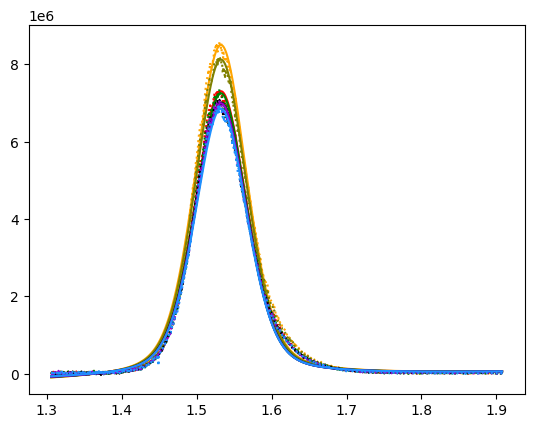

Batch 74, Sample 1: DONE


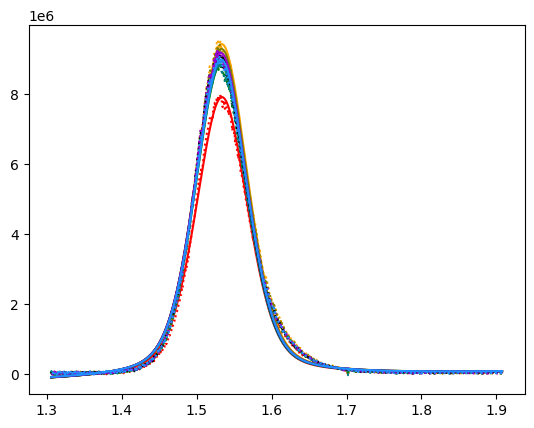

Batch 74, Sample 2: DONE


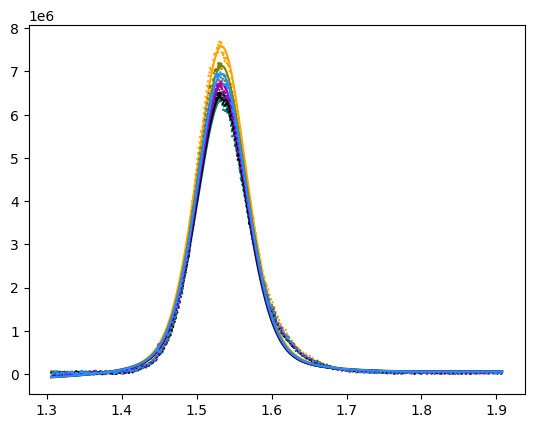

Batch 74, Sample 3: DONE


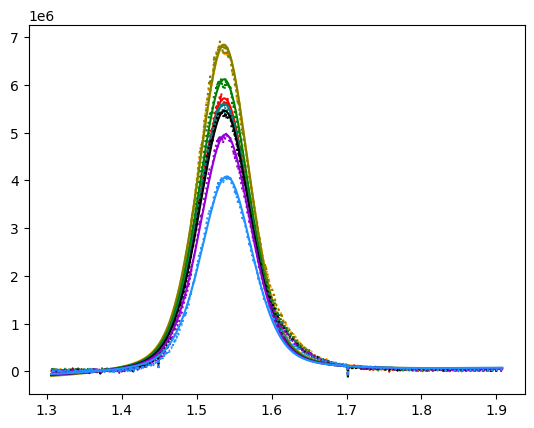

Batch 74, Sample 4: DONE


In [ ]:
#### REDOING PL



from lmfit.models import LinearModel, PseudoVoigtModel, GaussianModel
from scipy.integrate import trapz


# for b in {61, 62, 63, 64, 65, 66}:
for b in range(74,75,1):
# for b in range(1,53,1):
  batch = df[df['Batch No.'] == b]
  # display(batch)
  num_samples = len(batch)
  for s in range(1, num_samples + 1):
    sample = batch[batch['Sample #'] == str(s)]
    # print(f"Batch {b}, Sample {s}:")
    file_path = get_spec_run_filepath(sample)
    if not file_path:
        continue
    with h5py.File(file_path, 'r') as hf:

        photo = hf['measurement/spec_run/photo'][:]
        dark_int_time = hf['measurement/spec_run/pl_dark_int_time'][()]
        dark_spectrum = hf['measurement/spec_run/pl_dark_spectrum'][:]
        spec_int_times = hf['measurement/spec_run/pl_spectra_int_times'][:]
        spectra = hf['measurement/spec_run/pl_spectra'][:]
        ref_int_time = hf['measurement/spec_run/pl_ref_int_time'][()]
        ref_spectrum = hf['measurement/spec_run/pl_ref_spectrum'][:]
        wls = hf['measurement/spec_run/pl_wls'][:]
        settings_gr = hf['app/settings']
        sample_id = settings_gr.attrs['sample']


        '''
        PL Analysis
        '''

        p1_intensity_array = []
        p1_center_array = []
        p1_amplitude_array = []
        p1_fwhm_array = []
        p1_auc_array = []  # To store AUC for each fit


        # print("File data has been read successfully.")
        # plt.figure(figsize=(10, 6))
        for i in range(spectra.shape[0]):
          # time_normalized = np.divide((spectra[i] - dark_spectrum), spec_int_times[i])
          time_normalized = np.divide(spectra[i] , spec_int_times[i]) - np.divide(dark_spectrum, dark_int_time)

          lowQ_idx = find_nearest(wls, 650)
          highQ_idx = find_nearest(wls, 950)

          x = wls[lowQ_idx:highQ_idx]
          y = time_normalized[lowQ_idx:highQ_idx]


          energies = wavelength_to_energy(x)
          transformed_signal = apply_jacobian(y, x)

          bkg = LinearModel()

          pars = bkg.guess(transformed_signal, x=energies)

          peak1 = PseudoVoigtModel(prefix='p1_')
          pars.update(peak1.make_params(center=1.55,
                                    sigma=.1,
                                    amplitude=max(spectra[i])/5))
          pars['p1_center'].min = 1.4
          pars['p1_center'].max = 1.7

          mod = bkg + peak1

          out = mod.fit(transformed_signal, pars, x=energies)

          # out = mod.fit(time_normalized, pars, x=wls)


          def get_color(i, colors):
                  # Use modulo to ensure the index is within the range of the list
            return colors[i % len(colors)]
          colors = ['red', 'orange', 'olive', 'green', 'teal', 'black', 'darkviolet', 'dodgerblue']

          c = get_color(i, colors)
          plt.plot(energies, transformed_signal, ':', color=c)
          plt.plot(energies, out.best_fit, '-', color=c, label=f'Batch {b}, Sample {s}, Position {str(i+1)}')

          # Extract components
          components = out.eval_components(x=energies)
          peak_component = components['p1_']

          # Calculate AUC using trapezoidal rule
          auc = trapz(peak_component, energies)
          p1_auc_array.append(auc)


          p1_intensity_array.append(out.params['p1_height'].value)
          p1_center_array.append(out.params['p1_center'].value)
          p1_amplitude_array.append(out.params['p1_amplitude'].value)
          p1_fwhm_array.append(out.params['p1_fwhm'].value)

        plt.show()
        PL_peak_intensity_std = np.std(p1_intensity_array)
        PL_peak_intensity_mean = np.mean(p1_intensity_array)
        PL_peak_center_std = np.std(p1_center_array)
        PL_peak_center_mean = np.mean(p1_center_array)
        PL_peak_amplitude_std = np.std(p1_amplitude_array)
        PL_peak_amplitude_mean = np.mean(p1_amplitude_array)
        PL_peak_fwhm_std = np.std(p1_fwhm_array)
        PL_peak_fwhm_mean = np.mean(p1_fwhm_array)
        PL_peak_auc_std = np.std(p1_auc_array)
        PL_peak_auc_mean = np.mean(p1_auc_array)


        # print(f"Batch {b}, Sample {s}: {PL_peak_intensity_std=}")
        # print(f"Batch {b}, Sample {s}: {PL_peak_intensity_mean=}")
        # print(f"Batch {b}, Sample {s}: {PL_peak_center_std=}")
        # print(f"Batch {b}, Sample {s}: {PL_peak_center_mean=}")
        # print(f"Batch {b}, Sample {s}: {PL_peak_amplitude_std=}")
        # print(f"Batch {b}, Sample {s}: {PL_peak_amplitude_mean=}")
        # print(f"Batch {b}, Sample {s}: {PL_peak_fwhm_std=}")
        # print(f"Batch {b}, Sample {s}: {PL_peak_fwhm_mean=}")
        print(f"Batch {b}, Sample {s}: DONE")


        uuid = list(sample['Identifier UUID'])[0]

        # Find the row in the DataFrame where the UUID matches
        # row_index = df[df['Identifier UUID'] == uuid].index[0]
        row_index = df[df['spec_run'].str.contains(file_path.split('/')[-1])].index[0]


        # Get the column index for the 'Mean Transmittance' column
        col_index_intensity_std_dev = df.columns.get_loc('PL Peak Intensity Std Dev')
        col_index_intensity_mean = df.columns.get_loc('PL Peak Intensity Mean')
        col_index_center_std_dev = df.columns.get_loc('PL Peak Center Std Dev')
        col_index_center_mean = df.columns.get_loc('PL Peak Center Mean')
        col_index_fwhm_std_dev = df.columns.get_loc('PL Peak FWHM Std Dev')
        col_index_fwhm_mean = df.columns.get_loc('PL Peak FWHM Mean')
        col_index_amplitude_std_dev = df.columns.get_loc('PL Peak Amplitude Std Dev')
        col_index_amplitude_mean = df.columns.get_loc('PL Peak Amplitude Mean')
        col_index_auc_std_dev = df.columns.get_loc('PL Peak AUC Std Dev')
        col_index_auc_mean = df.columns.get_loc('PL Peak AUC Mean')


        # Update the cell in the Google Sheet for PL_peak_intensity_std

        cell = worksheet.cell(row_index + 2, col_index_intensity_std_dev + 1)  # Add 1 to row and column indices for Google Sheets
        cell.value = PL_peak_intensity_std
        worksheet.update_cell(row_index + 2, col_index_intensity_std_dev + 1, PL_peak_intensity_std)

        # Update the cell in the Google Sheet for PL_peak_intensity_mean

        cell = worksheet.cell(row_index + 2, col_index_intensity_mean + 1)
        cell.value = PL_peak_intensity_mean
        worksheet.update_cell(row_index + 2, col_index_intensity_mean + 1, PL_peak_intensity_mean)

        # Update the cell in the Google Sheet for PL_peak_center_std

        cell = worksheet.cell(row_index + 2, col_index_center_std_dev + 1)
        cell.value = PL_peak_center_std
        worksheet.update_cell(row_index + 2, col_index_center_std_dev + 1, PL_peak_center_std)

        # Update the cell in the Google Sheet for PL_peak_center_mean

        cell = worksheet.cell(row_index + 2, col_index_center_mean + 1)
        cell.value = PL_peak_center_mean
        worksheet.update_cell(row_index + 2, col_index_center_mean + 1, PL_peak_center_mean)

        # Update the cell in the Google Sheet for PL_peak_fwhm_std

        cell = worksheet.cell(row_index + 2, col_index_fwhm_std_dev + 1)
        cell.value = PL_peak_fwhm_std
        worksheet.update_cell(row_index + 2, col_index_fwhm_std_dev + 1, PL_peak_fwhm_std)

        # Update the cell in the Google Sheet for PL_peak_fwhm_mean

        cell = worksheet.cell(row_index + 2, col_index_fwhm_mean + 1)
        cell.value = PL_peak_fwhm_mean
        worksheet.update_cell(row_index + 2, col_index_fwhm_mean + 1, PL_peak_fwhm_mean)

        # Update the cell in the Google Sheet for PL_peak_amplitude_std

        cell = worksheet.cell(row_index + 2, col_index_amplitude_std_dev + 1)
        cell.value = PL_peak_amplitude_std
        worksheet.update_cell(row_index + 2, col_index_amplitude_std_dev + 1, PL_peak_amplitude_std)

        # Update the cell in the Google Sheet for PL_peak_fwhm_mean

        cell = worksheet.cell(row_index + 2, col_index_amplitude_mean + 1)
        cell.value = PL_peak_amplitude_mean
        worksheet.update_cell(row_index + 2, col_index_amplitude_mean + 1, PL_peak_amplitude_mean)

        # Update the cell in the Google Sheet for PL_peak_AUC_std

        cell = worksheet.cell(row_index + 2, col_index_auc_std_dev + 1)
        cell.value = PL_peak_auc_std
        worksheet.update_cell(row_index + 2, col_index_auc_std_dev + 1, PL_peak_auc_std)

        # Update the cell in the Google Sheet for PL_peak_AUC_mean

        cell = worksheet.cell(row_index + 2, col_index_auc_mean + 1)
        cell.value = PL_peak_auc_mean
        worksheet.update_cell(row_index + 2, col_index_auc_mean + 1, PL_peak_auc_mean)

<ipython-input-22-8b714c1f05f5>:76: DeprecationWarning: 'scipy.integrate.trapz' is deprecated in favour of 'scipy.integrate.trapezoid' and will be removed in SciPy 1.14.0
  auc_value = trapz(peak_component, energies)


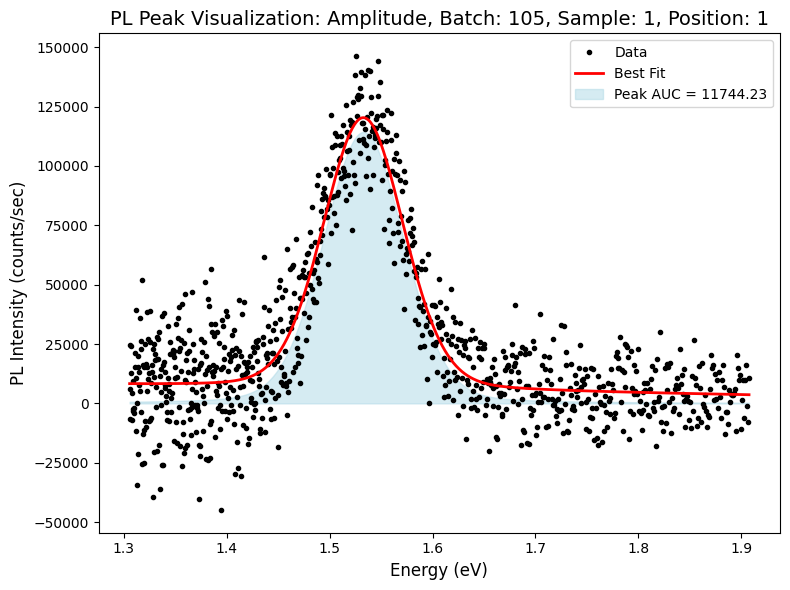

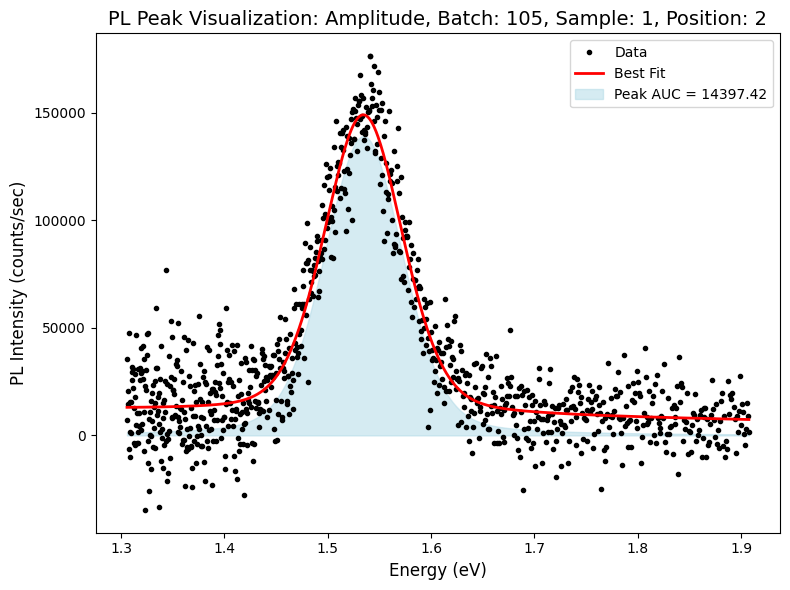

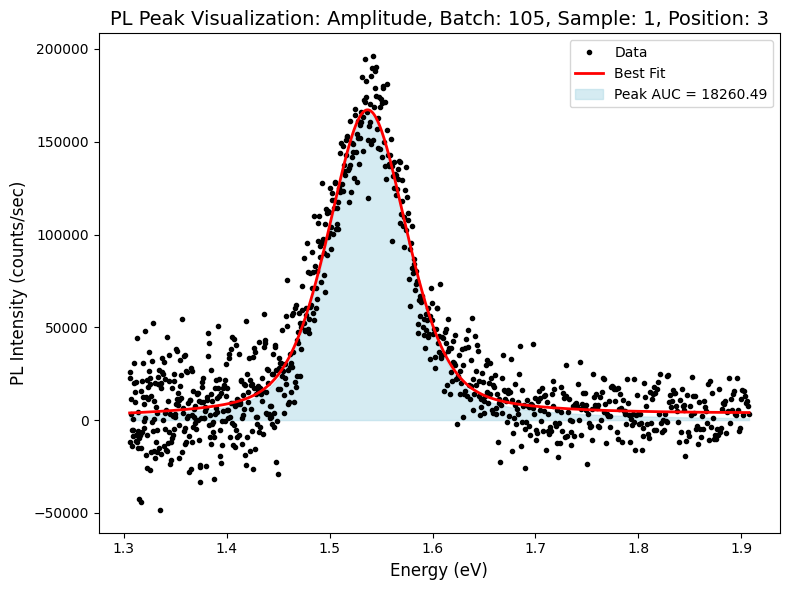

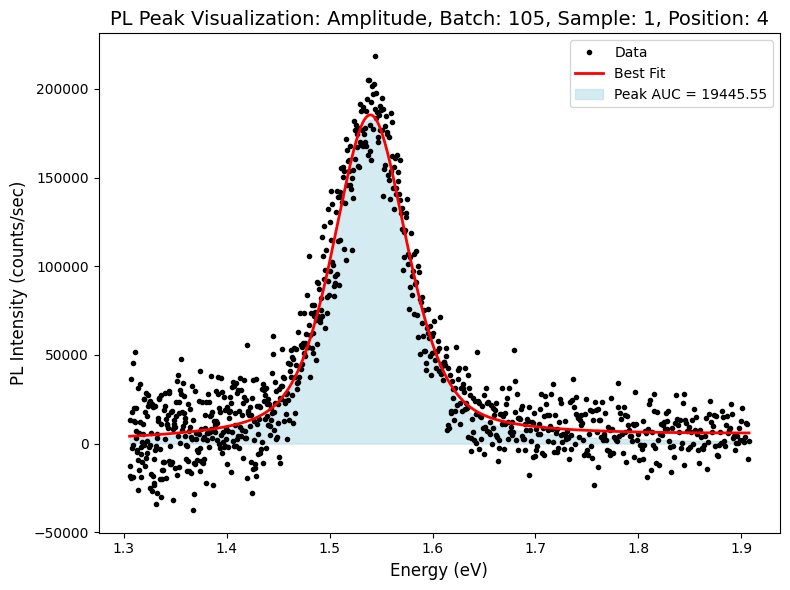

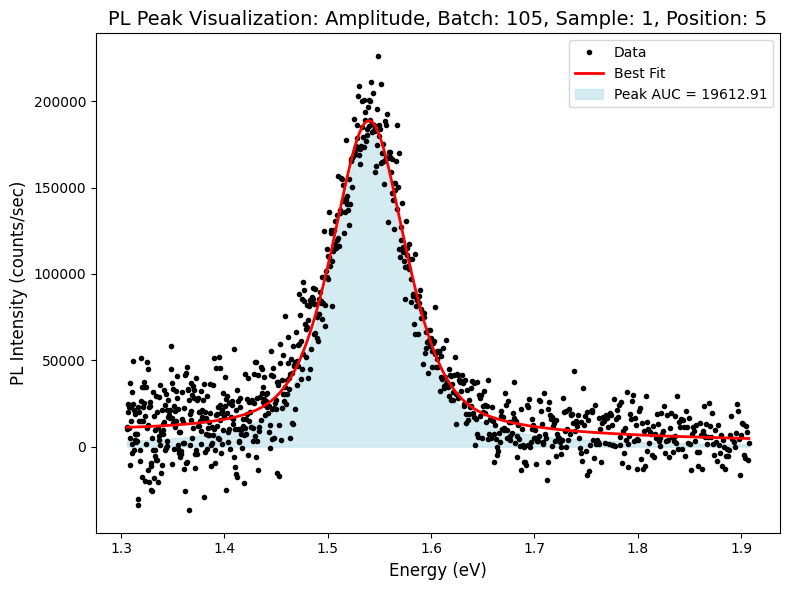

...

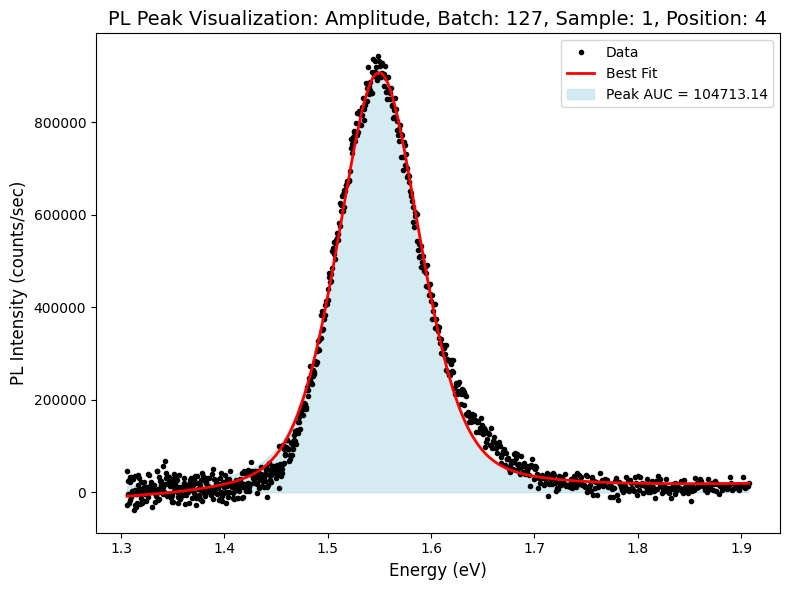

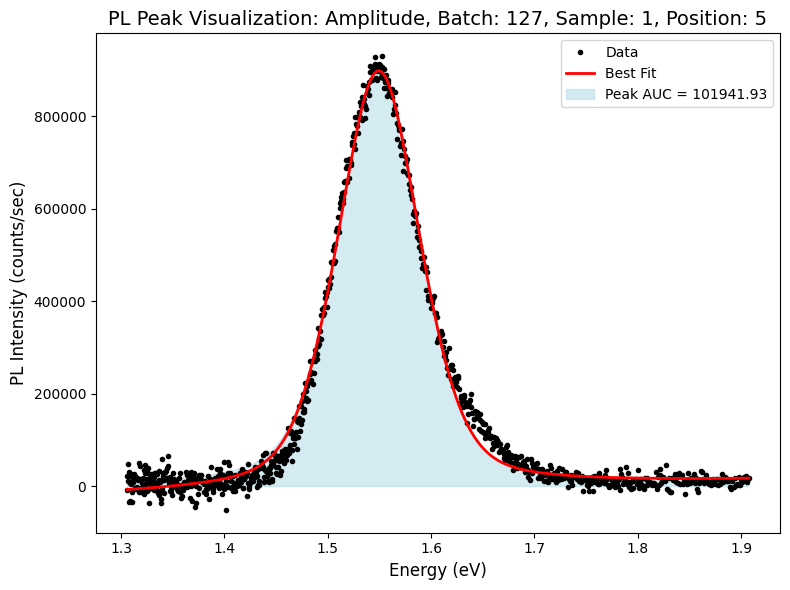

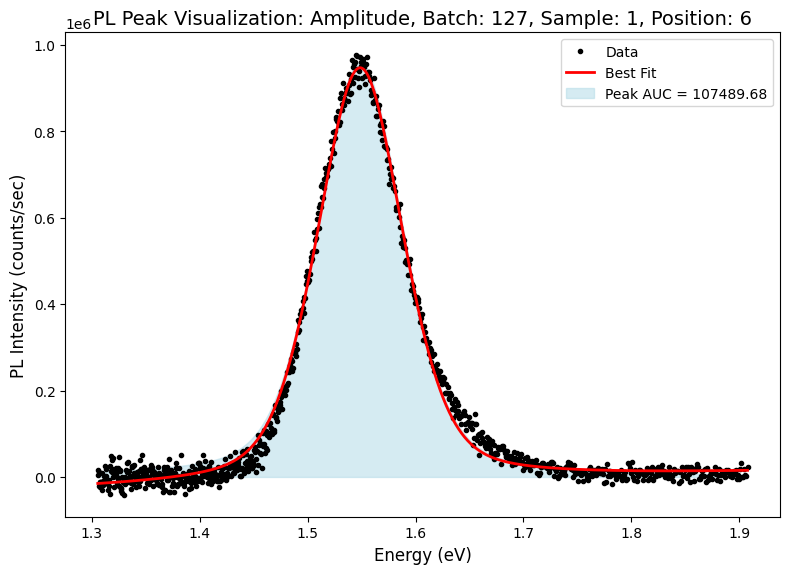

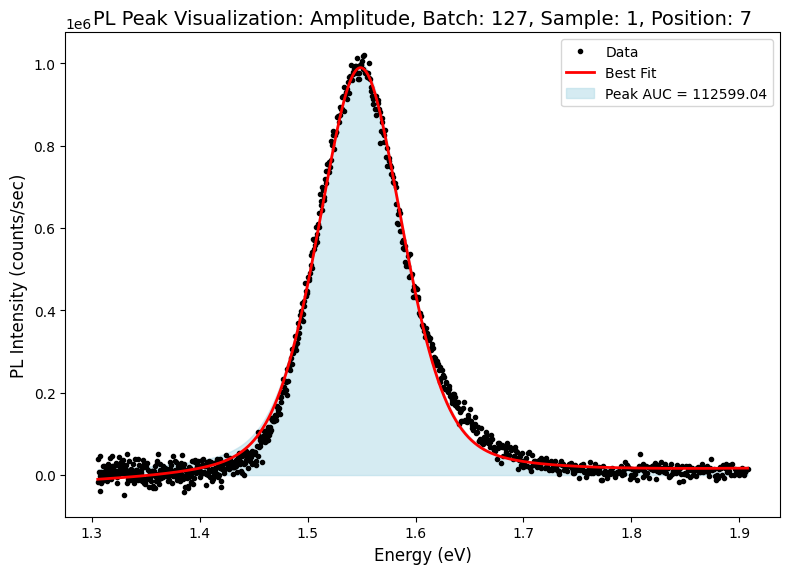

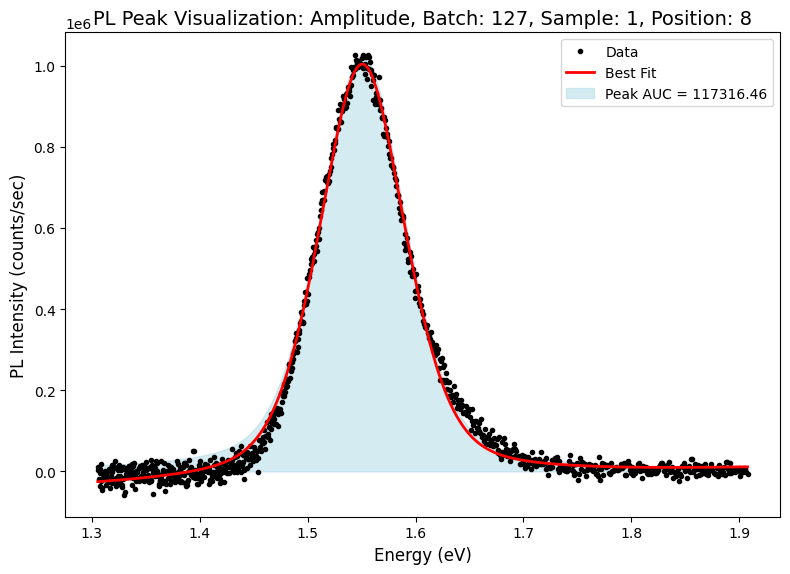

In [ ]:
import matplotlib.pyplot as plt
import numpy as np
import h5py
from lmfit.models import LinearModel, PseudoVoigtModel
from scipy.integrate import trapz

# Create empty lists to store results for plotting
sample_numbers = []
amplitude_means = []
auc_means = []

for b in {74, 105, 127}:
# for b in range(126, 127, 1):
    batch = df[df['Batch No.'] == b]
    num_samples = len(batch)

    # for s in range(1, num_samples + 1):
    for s in range(1, 2):

        sample = batch[batch['Sample #'] == str(s)]
        file_path = get_spec_run_filepath(sample)
        if not file_path:
            continue

        with h5py.File(file_path, 'r') as hf:
            photo = hf['measurement/spec_run/photo'][:]
            dark_int_time = hf['measurement/spec_run/pl_dark_int_time'][()]
            dark_spectrum = hf['measurement/spec_run/pl_dark_spectrum'][:]
            spec_int_times = hf['measurement/spec_run/pl_spectra_int_times'][:]
            spectra = hf['measurement/spec_run/pl_spectra'][:]
            ref_int_time = hf['measurement/spec_run/pl_ref_int_time'][()]
            ref_spectrum = hf['measurement/spec_run/pl_ref_spectrum'][:]
            wls = hf['measurement/spec_run/pl_wls'][:]
            settings_gr = hf['app/settings']
            sample_id = settings_gr.attrs['sample']

            p1_amplitude_array = []
            p1_auc_array = []

            # Loop over the measured spectra
            for i in range(spectra.shape[0]):
                # Time-normalization
                time_normalized = (
                    np.divide(spectra[i], spec_int_times[i])
                    - np.divide(dark_spectrum, dark_int_time)
                )

                lowQ_idx = find_nearest(wls, 650)
                highQ_idx = find_nearest(wls, 950)

                x = wls[lowQ_idx:highQ_idx]
                y = time_normalized[lowQ_idx:highQ_idx]

                # Convert x to energies
                energies = wavelength_to_energy(x)
                transformed_signal = apply_jacobian(y, x)

                # Fit background and a single pseudo-voigt peak
                bkg = LinearModel()
                pars = bkg.guess(transformed_signal, x=energies)

                peak1 = PseudoVoigtModel(prefix='p1_')
                pars.update(
                    peak1.make_params(center=1.55, sigma=0.1, amplitude=max(spectra[i]) / 5)
                )
                pars['p1_center'].min = 1.4
                pars['p1_center'].max = 1.7

                mod = bkg + peak1
                out = mod.fit(transformed_signal, pars, x=energies)

                components = out.eval_components(x=energies)
                peak_component = components['p1_']  # the fitted peak from your PseudoVoigtModel

                # Compute the AUC (using trapz over the fitted peak component)
                auc_value = trapz(peak_component, energies)

                # For amplitude, you might use the "p1_amplitude" parameter from your fit:
                peak_amplitude = out.params['p1_amplitude'].value

                # The "height" of the peak is often p1_height:
                peak_height = out.params['p1_height'].value

                # The "center" of the peak in eV
                peak_center = out.params['p1_center'].value

                # --- Plotting ---
                plt.figure(figsize=(8,6))

                # 1) Plot the raw (or processed) data
                plt.plot(energies, transformed_signal, 'ko', label='Data', markersize=3)

                # 2) Plot the best fit
                plt.plot(energies, out.best_fit, 'r-', linewidth=2, label='Best Fit')

                # 3) Fill the area under the peak to visualize the AUC
                plt.fill_between(energies, peak_component, 0,
                                color='lightblue', alpha=0.5,
                                label=f'Peak AUC = {-auc_value:.2f}')

                # # 4) Highlight the peak amplitude visually
                # #
                # #    Option A: draw a double arrow from y=0 to the peak maximum:
                # plt.annotate(
                #     '',
                #     xy=(peak_center, peak_height),      # arrow tip at peak
                #     xytext=(peak_center, 0),           # arrow start at baseline
                #     arrowprops=dict(arrowstyle='<->', color='blue', lw=2)
                # )
                # # Label the arrow at its midpoint:
                # plt.text(
                #     peak_center + 0.01, peak_height/2,
                #     f'Amplitude ~ {peak_amplitude:.2f}',
                #     color='blue', va='center', fontsize=9
                # )

                # Axes labels and legend
                plt.xlabel('Energy (eV)', fontsize=12)
                plt.ylabel('PL Intensity (counts/sec)', fontsize=12)
                plt.title(f'PL Peak Visualization: Amplitude, Batch: {b}, Sample: {s}, Position: {i+1}', fontsize=14)
                plt.legend()
                plt.tight_layout()
                plt.show()



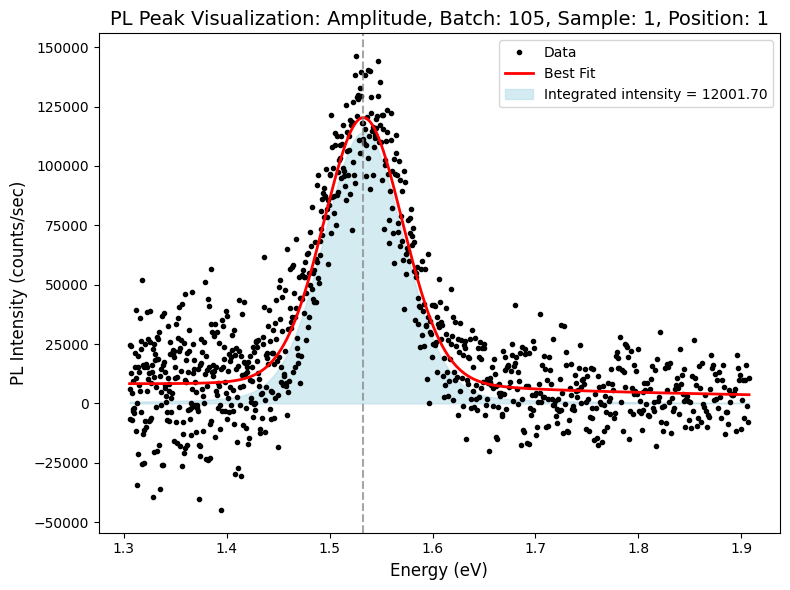

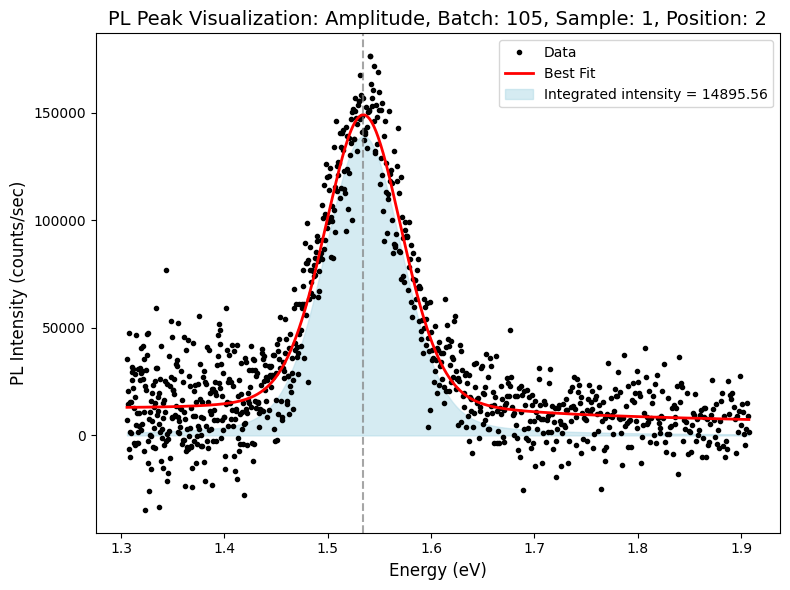

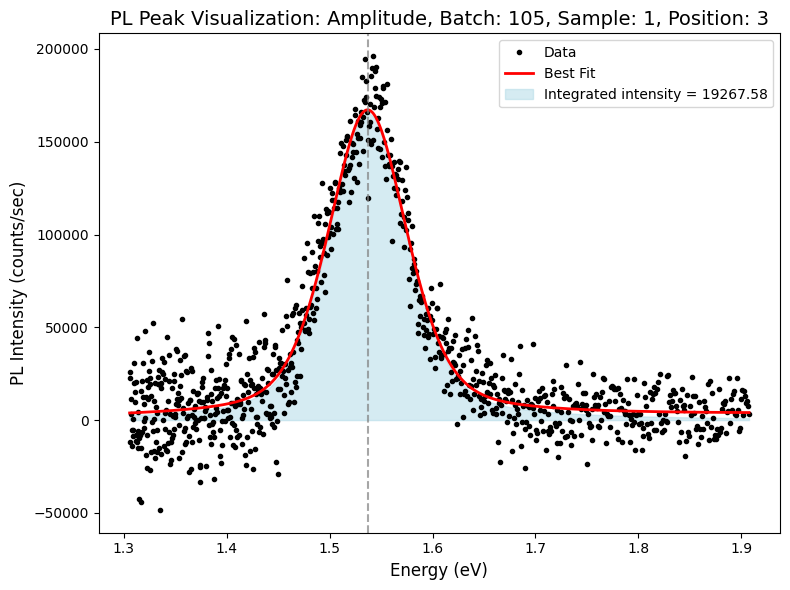

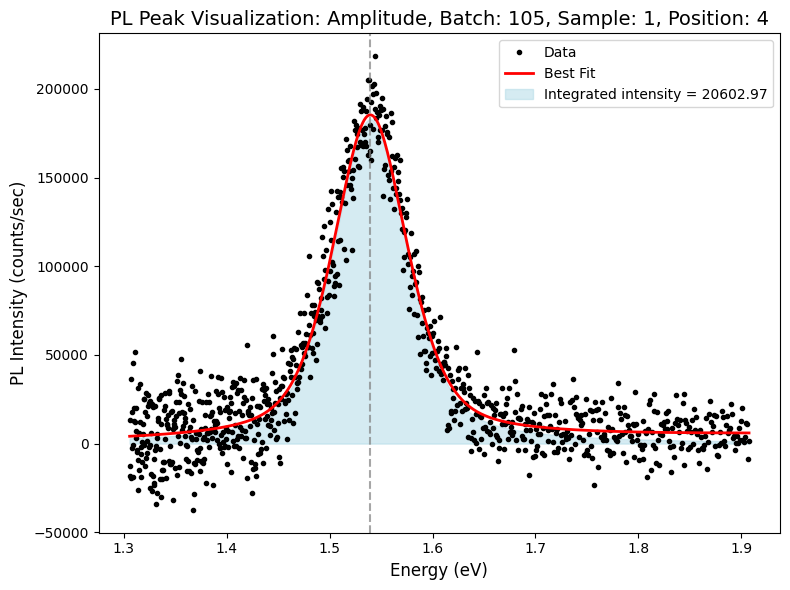

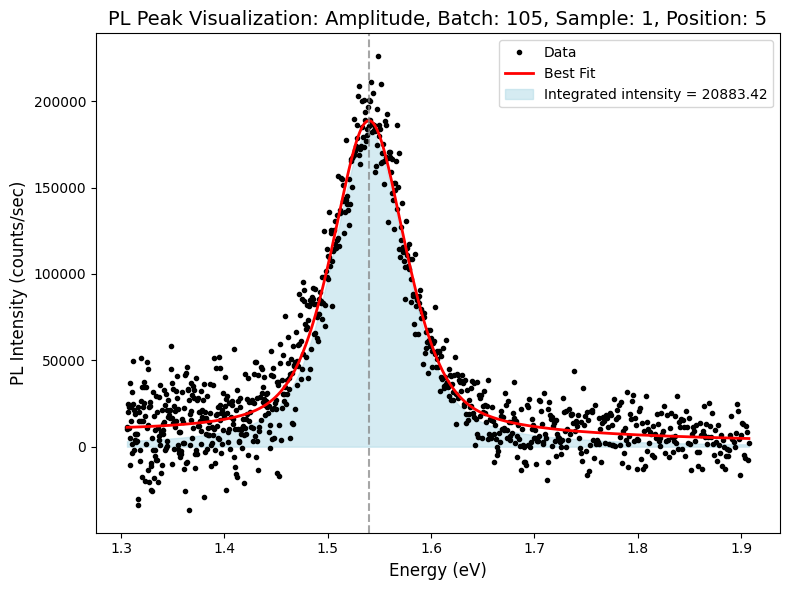

...

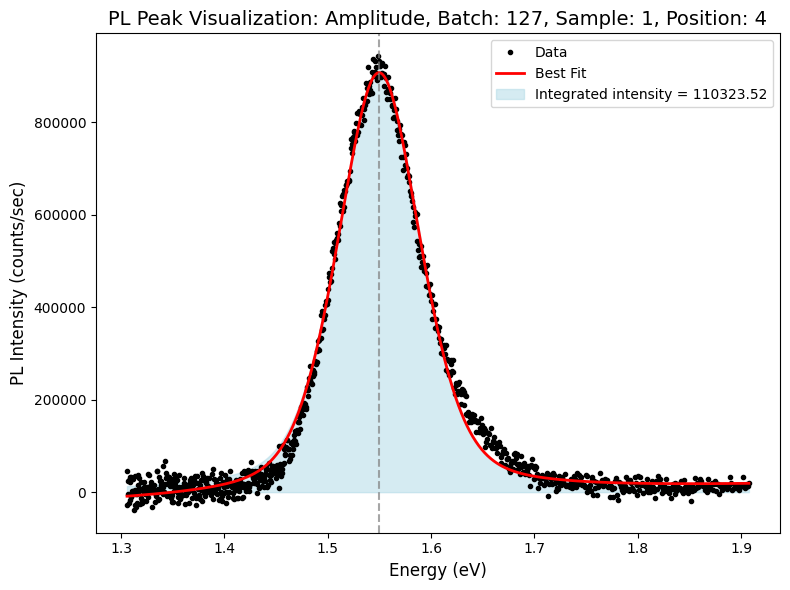

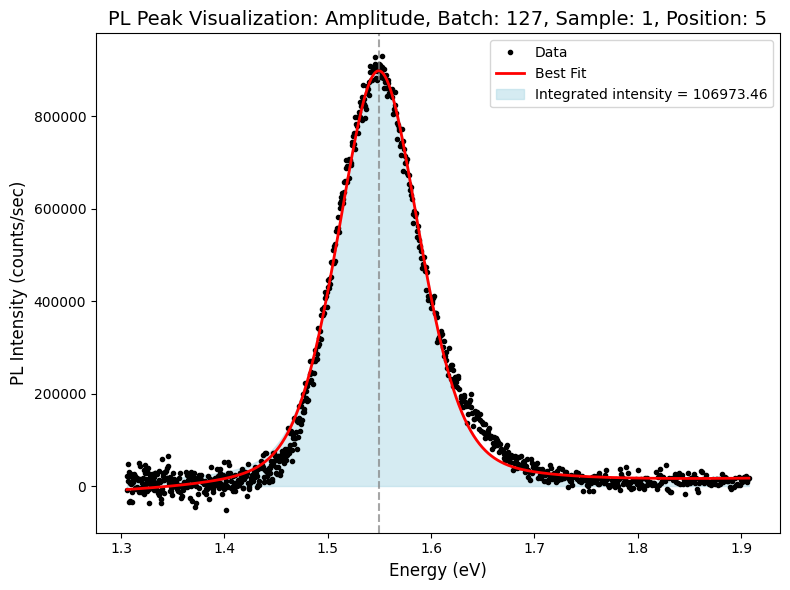

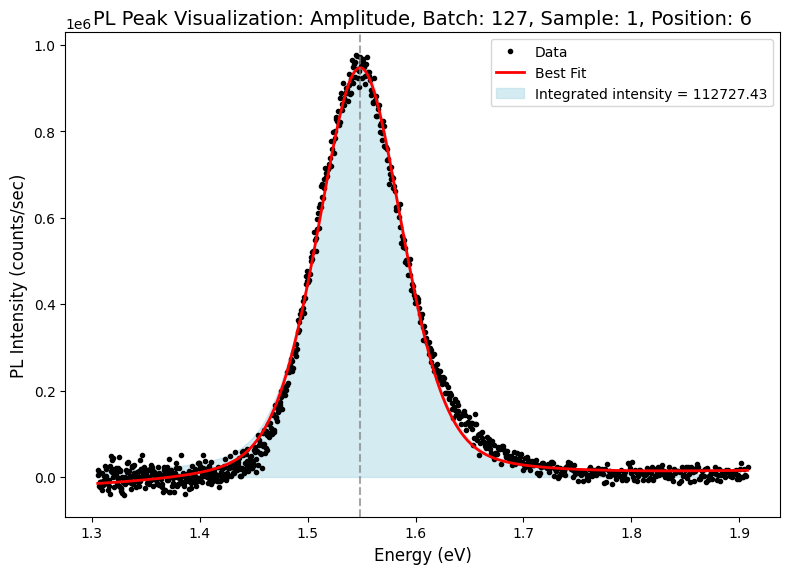

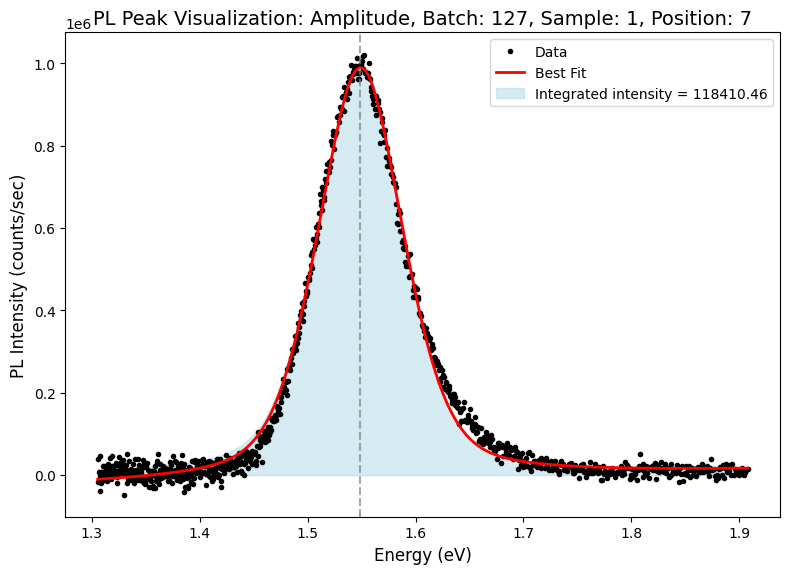

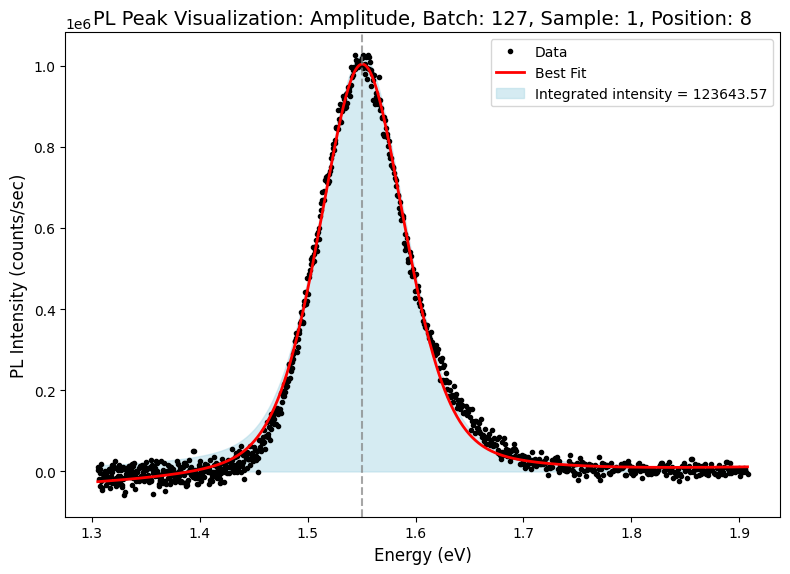

In [ ]:
import matplotlib.pyplot as plt
import numpy as np
import h5py
from lmfit.models import LinearModel, PseudoVoigtModel
from scipy.integrate import trapz

# Create empty lists to store results for plotting
sample_numbers = []
amplitude_means = []
auc_means = []

for b in {74, 105, 127}:
# for b in range(126, 127, 1):
    batch = df[df['Batch No.'] == b]
    num_samples = len(batch)

    # for s in range(1, num_samples + 1):
    for s in range(1, 2):
        sample = batch[batch['Sample #'] == str(s)]
        file_path = get_spec_run_filepath(sample)
        if not file_path:
            continue

        with h5py.File(file_path, 'r') as hf:
            photo = hf['measurement/spec_run/photo'][:]
            dark_int_time = hf['measurement/spec_run/pl_dark_int_time'][()]
            dark_spectrum = hf['measurement/spec_run/pl_dark_spectrum'][:]
            spec_int_times = hf['measurement/spec_run/pl_spectra_int_times'][:]
            spectra = hf['measurement/spec_run/pl_spectra'][:]
            ref_int_time = hf['measurement/spec_run/pl_ref_int_time'][()]
            ref_spectrum = hf['measurement/spec_run/pl_ref_spectrum'][:]
            wls = hf['measurement/spec_run/pl_wls'][:]
            settings_gr = hf['app/settings']
            sample_id = settings_gr.attrs['sample']

            p1_amplitude_array = []
            p1_auc_array = []

            # Loop over the measured spectra
            for i in range(spectra.shape[0]):
                # Time-normalization
                time_normalized = (
                    np.divide(spectra[i], spec_int_times[i])
                    - np.divide(dark_spectrum, dark_int_time)
                )

                lowQ_idx = find_nearest(wls, 650)
                highQ_idx = find_nearest(wls, 950)

                x = wls[lowQ_idx:highQ_idx]
                y = time_normalized[lowQ_idx:highQ_idx]

                # Convert x to energies
                energies = wavelength_to_energy(x)
                transformed_signal = apply_jacobian(y, x)

                # Fit background and a single pseudo-voigt peak
                bkg = LinearModel()
                pars = bkg.guess(transformed_signal, x=energies)

                peak1 = PseudoVoigtModel(prefix='p1_')
                pars.update(
                    peak1.make_params(center=1.55, sigma=0.1, amplitude=max(spectra[i]) / 5)
                )
                pars['p1_center'].min = 1.4
                pars['p1_center'].max = 1.7

                mod = bkg + peak1
                out = mod.fit(transformed_signal, pars, x=energies)

                # Extract fitted components
                components = out.eval_components(x=energies)
                peak_component = components['p1_']  # the fitted peak from PseudoVoigtModel

                # p1_amplitude is the integrated intensity (area under the peak) from lmfit:
                peak_area = out.params['p1_amplitude'].value

                # p1_height is the maximum (peak value) of the curve:
                peak_height = out.params['p1_height'].value

                # p1_center is the center of the peak in eV
                peak_center = out.params['p1_center'].value

                plt.figure(figsize=(8, 6))

                # 1) Plot the raw data (transformed_signal vs. energy)
                plt.plot(energies, transformed_signal, 'ko', markersize=3, label='Data')

                # 2) Plot the overall best-fit curve
                plt.plot(energies, out.best_fit, 'r-', linewidth=2, label='Best Fit')

                # 3) Fill under the fitted peak to visualize the integrated intensity
                plt.fill_between(
                    energies,
                    peak_component,  # y-values: the peak component
                    0,
                    color='lightblue',
                    alpha=0.5,
                    label=f"Integrated intensity = {peak_area:.2f}"
                )

                # # 4) Optional: Mark the peak height with a double arrow
                # #    from y=0 to y=peak_height at the peak_center
                # plt.annotate(
                #     '',
                #     xy=(peak_center, peak_height),
                #     xytext=(peak_center, 0),
                #     arrowprops=dict(arrowstyle='<->', color='blue', lw=2)
                # )
                # # Place a text label near the middle of that arrow
                # plt.text(
                #     peak_center + 0.01,
                #     peak_height/2,
                #     f"Peak height = {peak_height:.2f}",
                #     color='blue',
                #     va='center',
                #     fontsize=9
                # )

                # # 5) (Optional) draw a dashed vertical line at the peak center
                plt.axvline(x=peak_center, color='gray', linestyle='--', alpha=0.7)
                # plt.text(
                #     peak_center + 0.01,
                #     peak_height,
                #     f"Center = {peak_center:.2f} eV",
                #     fontsize=9,
                #     va='bottom'
                # )

                # Configure axes and legend
                plt.xlabel('Energy (eV)', fontsize=12)
                plt.ylabel('PL Intensity (counts/sec)', fontsize=12)
                plt.title(f'PL Peak Visualization: Amplitude, Batch: {b}, Sample: {s}, Position: {i+1}', fontsize=14)
                plt.legend()
                plt.tight_layout()
                plt.show()


In [ ]:
import pandas as pd

# Example data from the provided columns
amplitude = [
    768.7E+3, 928.4E+3, 702.7E+3, 602.6E+3, 850.1E+3, 822.7E+3, 772.6E+3, 870.1E+3,
    460.0E+3, 465.8E+3, 511.6E+3, 474.2E+3, 2.5E+6, 2.6E+6, 2.5E+6, 2.7E+6
]
auc = [
    -736.3E+3, -889.0E+3, -672.7E+3, -575.7E+3, -814.1E+3, -788.3E+3, -741.9E+3, -832.3E+3,
    -441.1E+3, -446.9E+3, -489.7E+3, -454.1E+3, -2.4E+6, -2.5E+6, -2.4E+6, -2.6E+6
]

# Create a DataFrame
data = pd.DataFrame({'Amplitude Mean': amplitude, 'AUC Mean': auc})

# Compute differences and ratios
data['Difference'] = data['Amplitude Mean'] - abs(data['AUC Mean'])
data['Percentage Difference'] = (data['Difference'] / data['Amplitude Mean']) * 100
data['Ratio'] = data['Amplitude Mean'] / abs(data['AUC Mean'])

# Display the results
print(data)


    Amplitude Mean   AUC Mean  Difference  Percentage Difference     Ratio
0         768700.0  -736300.0     32400.0               4.214908  1.044004
1         928400.0  -889000.0     39400.0               4.243860  1.044319
2         702700.0  -672700.0     30000.0               4.269247  1.044596
3         602600.0  -575700.0     26900.0               4.463989  1.046726
4         850100.0  -814100.0     36000.0               4.234796  1.044221
5         822700.0  -788300.0     34400.0               4.181354  1.043638
6         772600.0  -741900.0     30700.0               3.973596  1.041380
7         870100.0  -832300.0     37800.0               4.344328  1.045416
8         460000.0  -441100.0     18900.0               4.108696  1.042847
9         465800.0  -446900.0     18900.0               4.057535  1.042291
10        511600.0  -489700.0     21900.0               4.280688  1.044721
11        474200.0  -454100.0     20100.0               4.238718  1.044263
12       2500000.0 -24000

In [ ]:
from scipy.stats import linregress

# for b in {61, 62, 63, 64, 65, 66}:
for b in range(74,102,1):
  batch = df[df['Batch No.'] == b]
  num_samples = len(batch)
  for s in range(1, num_samples + 1):
  # for s in {2}:
    sample = batch[batch['Sample #'] == str(s)]
    print(f"Batch {b}, Sample {s}: DONE")
    file_path = get_spec_run_filepath(sample)
    if not file_path:
        continue
    with h5py.File(file_path, 'r') as hf:

        photo_exposure = hf['measurement/spec_run/adj_photo_exposure'][()]

    # print(type(photo_exposure))
    # print(type(int(photo_exposure)))

    # print(photo_exposure)


    uuid = list(sample['Identifier UUID'])[0]

    # Find the row in the DataFrame where the UUID matches
    # row_index = df[df['Identifier UUID'] == uuid].index[0]
    row_index = df[df['spec_run'].str.contains(file_path.split('/')[-1])].index[0]

    # Get the column index for the 'Mean Transmittance' column
    col_index_pl_photo_exposure = df.columns.get_loc('PL Photo Exposure (ms)')

    # Update the cell in the Google Sheet for photo_exposure
    cell = worksheet.cell(row_index + 2, col_index_pl_photo_exposure + 1)  # Add 1 to row and column indices for Google Sheets
    cell.value = int(photo_exposure)
    worksheet.update_cell(row_index + 2, col_index_pl_photo_exposure + 1, int(photo_exposure))



Batch 74, Sample 1: DONE
Batch 74, Sample 2: DONE
Batch 74, Sample 3: DONE
Batch 74, Sample 4: DONE
Batch 75, Sample 1: DONE
Batch 75, Sample 2: DONE
Batch 75, Sample 3: DONE
Batch 75, Sample 4: DONE
Batch 76, Sample 1: DONE
Batch 76, Sample 2: DONE
Batch 76, Sample 3: DONE
Batch 76, Sample 4: DONE
Batch 77, Sample 1: DONE
Batch 77, Sample 2: DONE
Batch 77, Sample 3: DONE
Batch 77, Sample 4: DONE
Batch 78, Sample 1: DONE
Batch 78, Sample 2: DONE
Batch 78, Sample 3: DONE
Batch 78, Sample 4: DONE
Batch 79, Sample 1: DONE
Batch 79, Sample 2: DONE
Batch 79, Sample 3: DONE
Batch 79, Sample 4: DONE
Batch 80, Sample 1: DONE
Batch 80, Sample 2: DONE
Batch 80, Sample 3: DONE
Batch 80, Sample 4: DONE
Batch 81, Sample 1: DONE
Batch 81, Sample 2: DONE
Batch 81, Sample 3: DONE
Batch 81, Sample 4: DONE
Batch 82, Sample 1: DONE
Batch 82, Sample 2: DONE
Batch 82, Sample 3: DONE
Batch 82, Sample 4: DONE
Batch 83, Sample 1: DONE
Batch 83, Sample 2: DONE
Batch 83, Sample 3: DONE
Batch 83, Sample 4: DONE


Batch 96, Sample 1:


<ipython-input-9-3023d8a97c76>:49: RuntimeWarning: invalid value encountered in log10
  absorption_non_smooth = -np.log10(sample_spectrum_final_jacobian)


Area 1 under the curve from 1.43 eV to 2.5 eV: 4.40930078758165
Area 2 under the curve from 1.25 eV to 1.43 eV: 0.6201906962972084


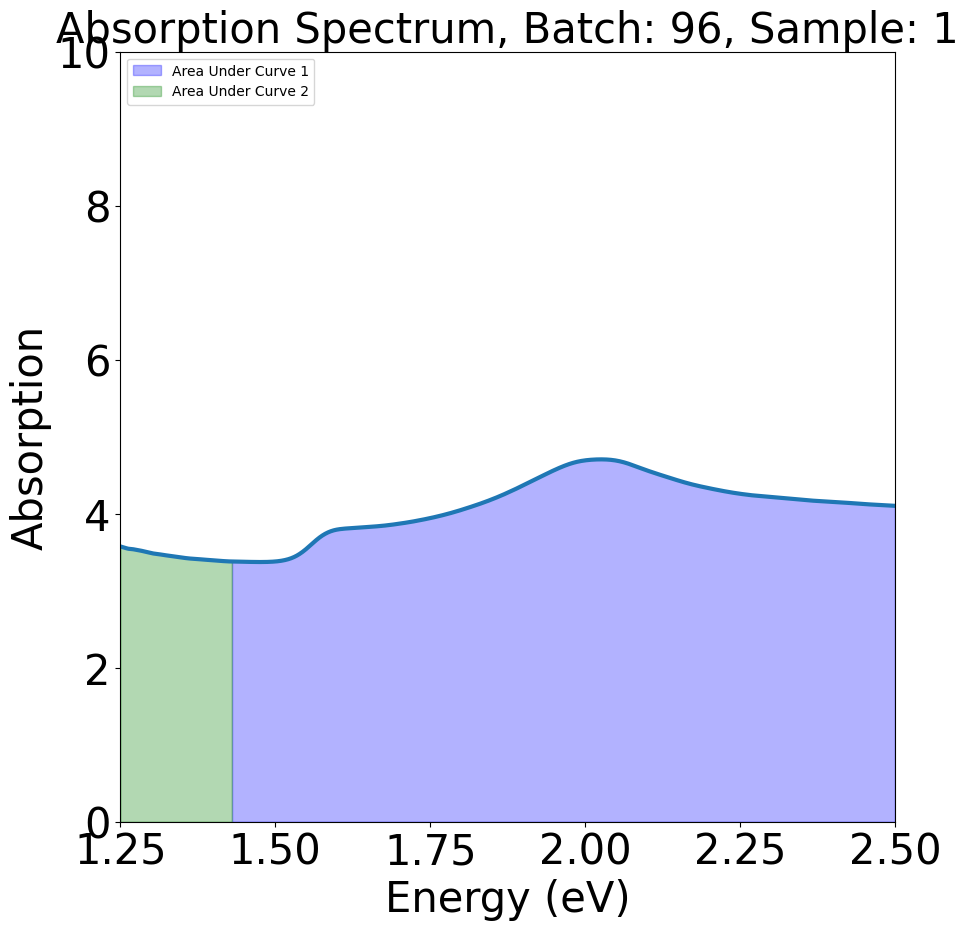

Batch 89, Sample 1:


<ipython-input-9-3023d8a97c76>:48: RuntimeWarning: invalid value encountered in log10
  absorption = -np.log10(smoothed_spectrum)


Area 1 under the curve from 1.43 eV to 2.5 eV: 5.2517539283278225
Area 2 under the curve from 1.25 eV to 1.43 eV: 0.6217725771484477


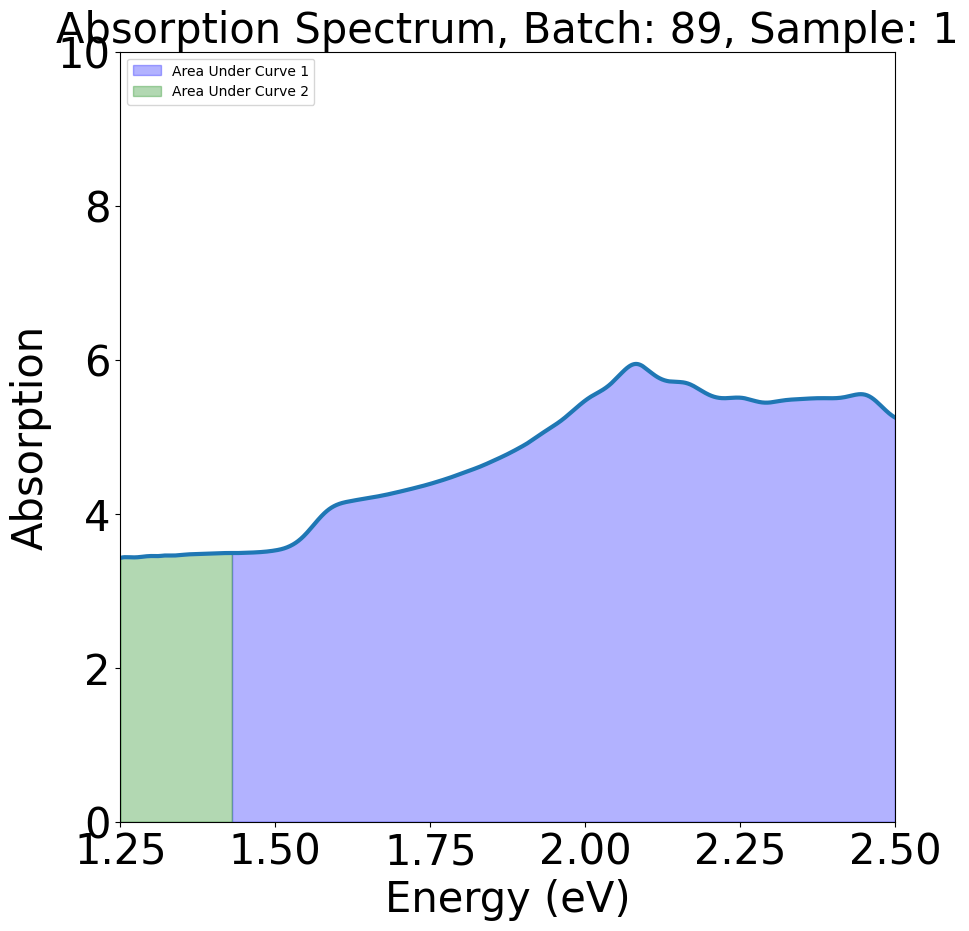

Batch 90, Sample 1:
Area 1 under the curve from 1.43 eV to 2.5 eV: 4.387818734428052
Area 2 under the curve from 1.25 eV to 1.43 eV: 0.5523452648414762


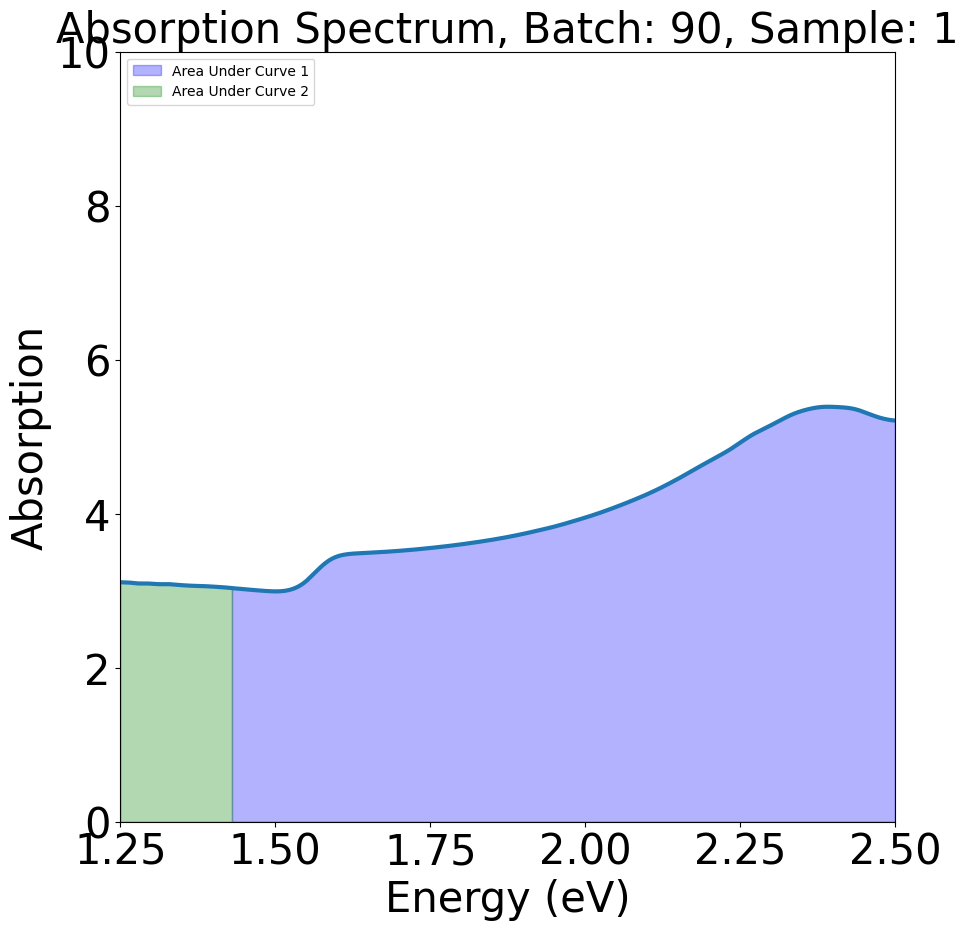

Batch 91, Sample 1:
Area 1 under the curve from 1.43 eV to 2.5 eV: 4.159259212092017
Area 2 under the curve from 1.25 eV to 1.43 eV: 0.5443033017744823


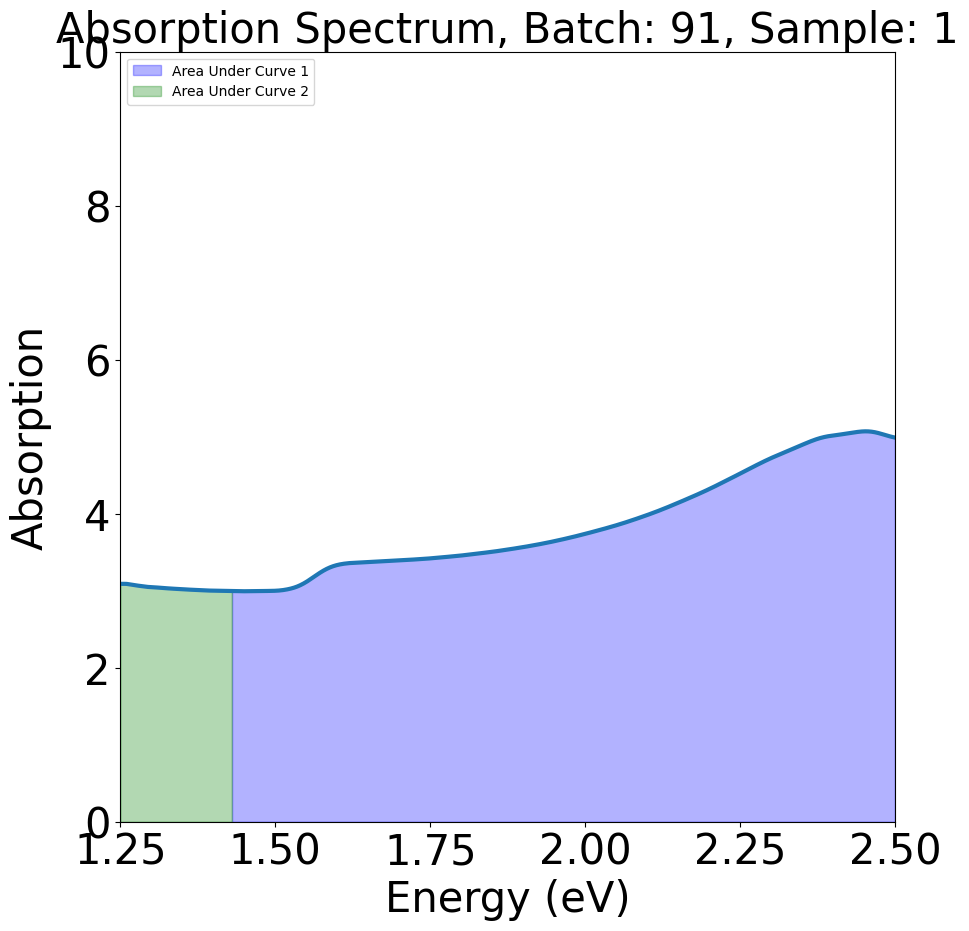

Batch 92, Sample 1:
Area 1 under the curve from 1.43 eV to 2.5 eV: 4.046151374841491
Area 2 under the curve from 1.25 eV to 1.43 eV: 0.5536752244725254


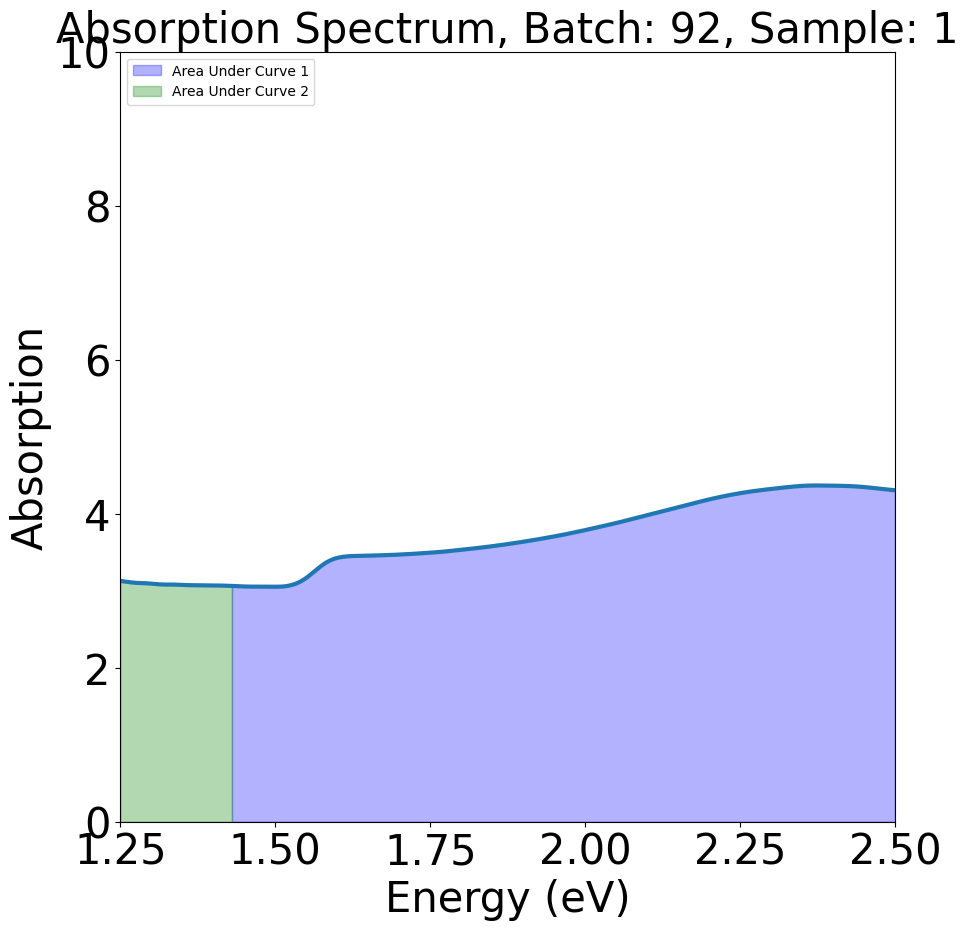

Batch 95, Sample 1:
Area 1 under the curve from 1.43 eV to 2.5 eV: 4.2989722183747485
Area 2 under the curve from 1.25 eV to 1.43 eV: 0.5518853033138289


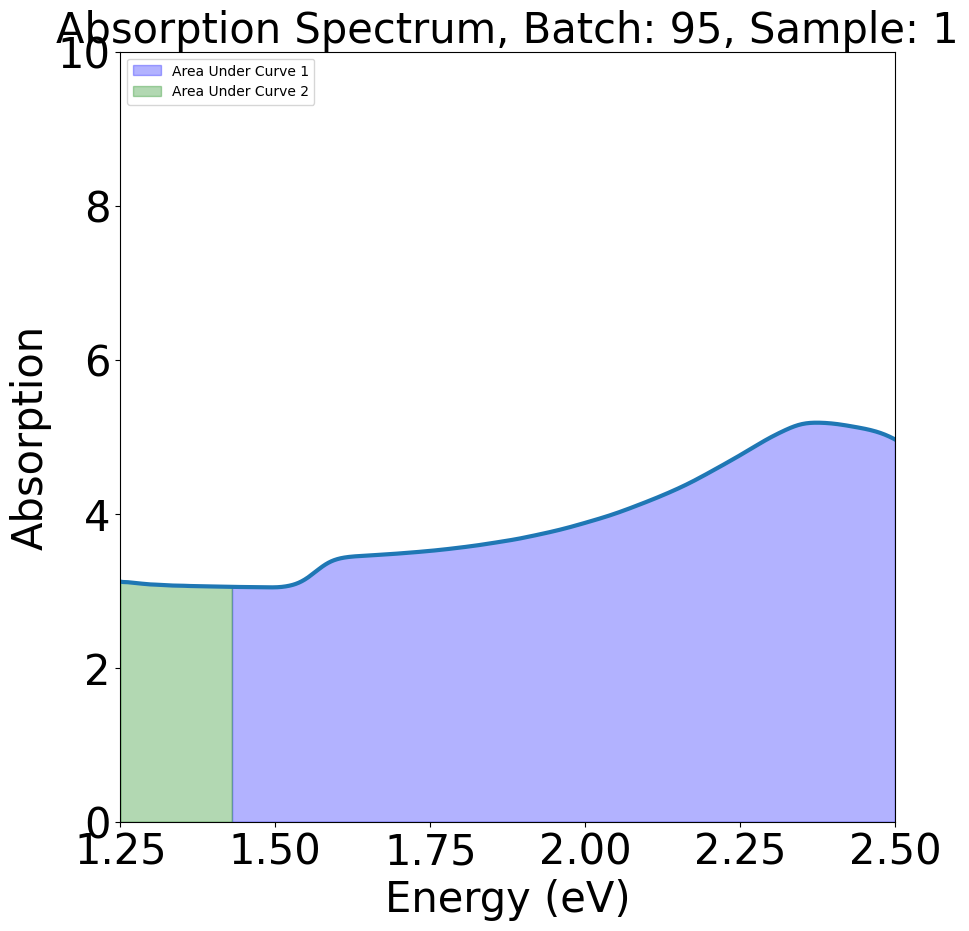

In [ ]:
sigma = 15  # Adjust sigma for different levels of smoothing

# Batch Number
# b = 94
for b in {89, 90, 91, 92, 95, 96}:


  batch = df[df['Batch No.'] == b]


  # Sample Number
  s = 1

  sample = batch[batch['Sample #'] == str(s)]

  print(f"Batch {b}, Sample {s}:")

  file_path = get_spec_run_filepath(sample)


  with h5py.File(file_path, 'r') as hf:

    photo = hf['measurement/spec_run/photo'][:]
    wl_dark_int_time = hf['measurement/spec_run/wl_dark_int_time'][()]
    wl_dark_spectrum = hf['measurement/spec_run/wl_dark_spectrum'][:]
    wl_samp_int_times = hf['measurement/spec_run/wl_spectra_int_times'][:]
    wl_samp_spectrum = hf['measurement/spec_run/wl_spectra'][:]
    wl_ref_int_time = hf['measurement/spec_run/wl_ref_int_time'][()]
    wl_ref_spectrum = hf['measurement/spec_run/wl_ref_spectrum'][:]
    wl_wave_axis = hf['measurement/spec_run/wl_wls'][:]
    settings_gr = hf['app/settings']
    sample_id = settings_gr.attrs['sample']


  # print("File data has been read successfully.")
  sample_spectrum_corr = wl_samp_spectrum/wl_samp_int_times.reshape((8,1)) - wl_dark_spectrum/wl_dark_int_time
  sample_spectrum_corr_mean = np.mean(sample_spectrum_corr, axis=0) #Average individual spectra per sample
  sample_spectrum_final = sample_spectrum_corr_mean / (wl_ref_spectrum/wl_ref_int_time - wl_dark_spectrum/wl_dark_int_time) #Divide by the reference



  wl_energy_axis = wavelength_to_energy(wl_wave_axis)
  sample_spectrum_final_jacobian = apply_jacobian(sample_spectrum_final, wl_energy_axis)


  # Apply Gaussian smoothing
  smoothed_spectrum = gaussian_filter(sample_spectrum_final_jacobian, sigma=sigma)
  absorption = -np.log10(smoothed_spectrum)
  absorption_non_smooth = -np.log10(sample_spectrum_final_jacobian)

  label_size = 30


  ################################################################################################

  # Calcauting Area for one sample!

  # Define energy ranges
  mask1 = (wl_energy_axis >= 1.43) & (wl_energy_axis <= 2.5)
  x_selected1 = wl_energy_axis[mask1]
  y_selected1 = absorption[mask1]

  mask2 = (wl_energy_axis >= 1.25) & (wl_energy_axis <= 1.43)
  x_selected2 = wl_energy_axis[mask2]
  y_selected2 = absorption[mask2]

  # Area under the curve for each energy range
  area_under_curve1 = -np.trapz(y_selected1, x_selected1)
  area_under_curve2 = -np.trapz(y_selected2, x_selected2)

  print(f"Area 1 under the curve from 1.43 eV to 2.5 eV: {area_under_curve1}")

  print(f"Area 2 under the curve from 1.25 eV to 1.43 eV: {area_under_curve2}")

  # Plot the curve with the selected regions
  plt.figure(figsize=(10, 10))
  plt.plot(wl_energy_axis, absorption, linewidth=3)

  # Plot areas for energy range 1
  plt.fill_between(x_selected1, 0, y_selected1, color='blue', alpha=0.3, label='Area Under Curve 1')

  # Plot areas for energy range 2
  plt.fill_between(x_selected2, 0, y_selected2, color='green', alpha=0.3, label='Area Under Curve 2')

  plt.xlabel('Energy (eV)', fontsize=label_size)
  plt.ylabel('Absorption', fontsize=label_size)
  plt.tick_params(axis='both', which='major', labelsize=label_size)
  plt.legend(loc='upper left')
  plt.title(f'Absorption Spectrum, Batch: {b}, Sample: {s}', fontsize=label_size)
  plt.xlim(1.25, 2.5)
  plt.ylim(0,10)
  plt.show()



In [ ]:
import matplotlib.pyplot as plt
plt.imshow(photo.sum(axis=2), cmap='gray')
plt.colorbar()

<ipython-input-137-268be53af00a>:17: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_filtered['Mean Transmittance'] = pd.to_numeric(df_filtered['Mean Transmittance'])
<ipython-input-137-268be53af00a>:23: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  colors = plt.cm.get_cmap(None, len(batch_numbers))


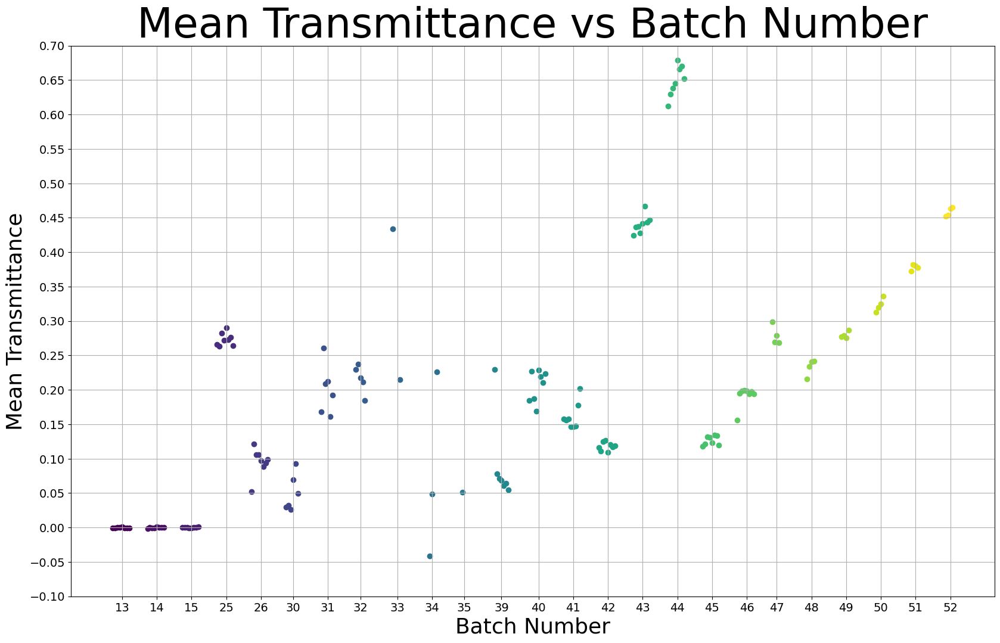

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

# Assuming 'df' is your DataFrame and it has columns 'Batch No.', 'Sample #' and 'Mean Transmittance'
# Example DataFrame creation for demonstration
# df = pd.DataFrame({
#     'Batch No.': [1, 1, 2, 2, 3, 3, 4, 4],
#     'Sample #': [1, 2, 1, 2, 1, 2, 1, 2],
#     'Mean Transmittance': [0.1, 0.2, 0.3, 0.4, np.nan, 0.6, 0.7, 0.8]
# })

# Filter out rows where 'Mean Transmittance' is empty
df_filtered = df.dropna(subset=['Mean Transmittance'])

# Ensure 'Mean Transmittance' is numeric
df_filtered['Mean Transmittance'] = pd.to_numeric(df_filtered['Mean Transmittance'])

# Get unique batch numbers
batch_numbers = df_filtered['Batch No.'].unique()

# Create a color map
colors = plt.cm.get_cmap(None, len(batch_numbers))

# Plot each batch with its specific color
plt.figure(figsize=(20, 12))
x_ticks = []
x_labels = []
spacing = 15  # Define a spacing factor for even distribution

for i, batch in enumerate(batch_numbers):
    batch_data = df_filtered[df_filtered['Batch No.'] == batch].sort_values(by='Sample #')
    x_positions = np.arange(len(batch_data)) + i * spacing
    plt.scatter(x_positions, batch_data['Mean Transmittance'], color=colors(i), label=f'Batch {batch}')
    x_ticks.append(x_positions[len(x_positions) // 2])
    x_labels.append(f'{batch}')

# Set y-axis increments to a larger fixed amount
y_max = df_filtered['Mean Transmittance'].max()
y_min = df_filtered['Mean Transmittance'].min()
# plt.yticks(np.arange(y_min, y_max + 0.1, 0.05))
plt.yticks(np.arange(-0.1, .8, 0.05), fontsize=14)
# Set y-axis max and min
plt.ylim(-0.1, .7)
# plt.ylim(y_min, y_max)
# Set x-axis labels
plt.xticks(x_ticks, x_labels, rotation=0, fontsize=14)

plt.xlabel('Batch Number', fontsize=26)
plt.ylabel('Mean Transmittance', fontsize=26)
plt.title('Mean Transmittance vs Batch Number', fontsize=50)
plt.grid(True)
plt.show()

<ipython-input-12-b7127a3ced3a>:25: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  colors = plt.cm.get_cmap(None, len(batch_numbers))


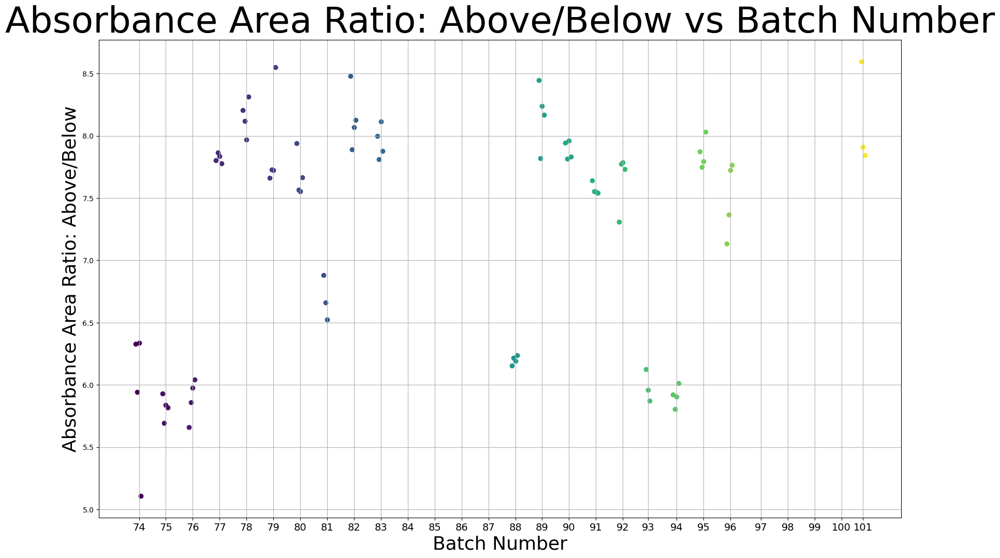

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

# Assuming 'df' is your DataFrame and it has columns 'Batch No.', 'Sample #' and 'Absorbance Area Ratio: Above/Below'
# Example DataFrame creation for demonstration
# df = pd.DataFrame({
#     'Batch No.': [1, 1, 2, 2, 3, 3, 4, 4],
#     'Sample #': [1, 2, 1, 2, 1, 2, 1, 2],
#     'Absorbance Area Ratio: Above/Below': [0.1, 0.2, 0.3, 0.4, np.nan, 0.6, 0.7, 0.8]
# })

# Filter out rows where 'Absorbance Area Ratio: Above/Below' is empty
df_filtered = df.dropna(subset=['Absorbance Area Ratio: Above/Below'])

# Ensure 'Mean Transmittance' is numeric
df_filtered['Absorbance Area Ratio: Above/Below'] = pd.to_numeric(df_filtered['Absorbance Area Ratio: Above/Below'])

# Get unique batch numbers
df_filtered = df_filtered[df_filtered['Batch No.'] > 73]
batch_numbers = df_filtered['Batch No.'].unique()


# Create a color map
colors = plt.cm.get_cmap(None, len(batch_numbers))

# Plot each batch with its specific color
plt.figure(figsize=(20, 12))
x_ticks = []
x_labels = []
spacing = 15  # Define a spacing factor for even distribution

for i, batch in enumerate(batch_numbers):
    batch_data = df_filtered[df_filtered['Batch No.'] == batch].sort_values(by='Sample #')
    x_positions = np.arange(len(batch_data)) + i * spacing
    plt.scatter(x_positions, batch_data['Absorbance Area Ratio: Above/Below'], color=colors(i), label=f'Batch {batch}')
    x_ticks.append(x_positions[len(x_positions) // 2])
    x_labels.append(f'{batch}')

# Set y-axis increments to a larger fixed amount
y_max = df_filtered['Absorbance Area Ratio: Above/Below'].max()
y_min = df_filtered['Absorbance Area Ratio: Above/Below'].min()
# plt.yticks(np.arange(y_min, y_max + 0.1, 0.05))
# plt.yticks(np.arange(-0.1, .8, 0.05), fontsize=14)
# Set y-axis max and min
# plt.ylim(-0.1, .7)
# plt.ylim(y_min, y_max)
# Set x-axis labels
plt.xticks(x_ticks, x_labels, rotation=0, fontsize=14)

plt.xlabel('Batch Number', fontsize=26)
plt.ylabel('Absorbance Area Ratio: Above/Below', fontsize=26)
plt.title('Absorbance Area Ratio: Above/Below vs Batch Number', fontsize=50)
plt.grid(True)
plt.show()

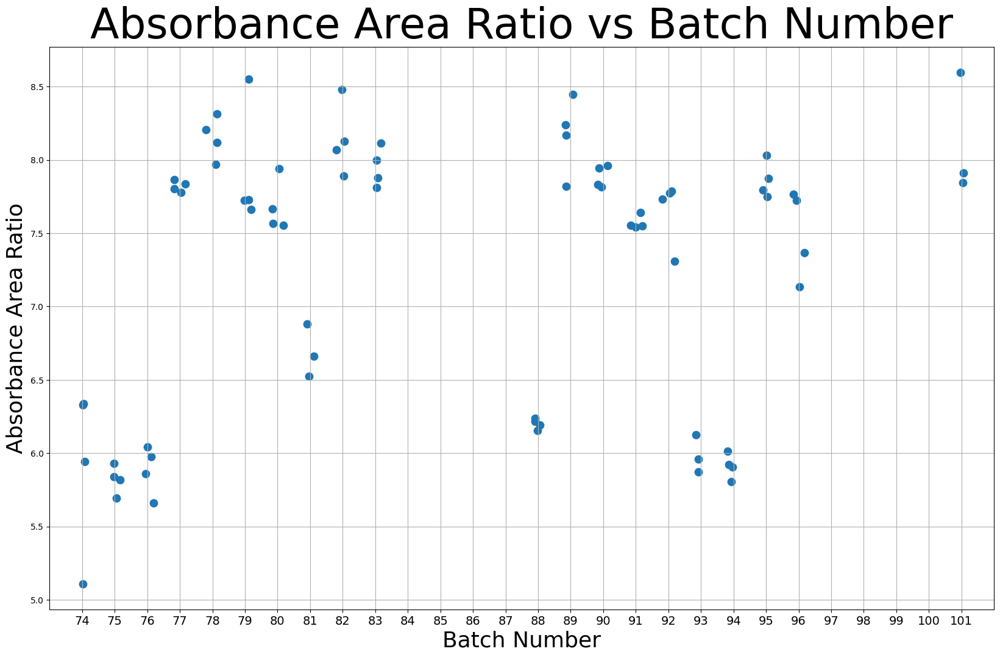

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

# Assuming 'df' is your DataFrame and it has columns 'Batch No.', 'Sample #', and 'Absorbance Area Ratio'
# Example DataFrame creation for demonstration (uncomment and modify according to your data)
# df = pd.DataFrame({
#     'Batch No.': [74, 74, 75, 75, 77, 77, 84, 85, 86, 87, 87],
#     'Sample #': [1, 2, 1, 2, 1, 2, 1, 1, 1, 1, 2],
#     'Absorbance Area Ratio': [0.1, 0.2, 0.3, 0.4, np.nan, 0.6, np.nan, np.nan, np.nan, 0.7, 0.8]
# })

# Filter out rows where 'Absorbance Area Ratio' is NaN
df_filtered = df.dropna(subset=['Absorbance Area Ratio: Above/Below'])

# Ensure 'Absorbance Area Ratio' is numeric
df_filtered['Absorbance Area Ratio: Above/Below'] = pd.to_numeric(df_filtered['Absorbance Area Ratio: Above/Below'])

# Filter based on 'Batch No.' > 73
df_filtered = df_filtered[df_filtered['Batch No.'] > 73]

# Sort the DataFrame by 'Batch No.' for consistent plotting
df_filtered.sort_values('Batch No.', inplace=True)

# Get unique batch numbers that have data points
batch_numbers = df_filtered['Batch No.'].unique()

# Use the actual batch numbers as x positions
df_filtered['x_positions'] = df_filtered['Batch No.']

# Add jitter to x-axis positions to prevent overlapping points
np.random.seed(0)  # For reproducibility of the jitter
jitter = np.random.uniform(-0.2, 0.2, size=len(df_filtered))
df_filtered['x_positions'] += jitter

# Plot
plt.figure(figsize=(20, 12))
plt.scatter(df_filtered['x_positions'], df_filtered['Absorbance Area Ratio: Above/Below'], s=80)

# Set x-ticks to the batch numbers that have data
plt.xticks(batch_numbers, batch_numbers, rotation=0, fontsize=14)

# Label axes and set title
plt.xlabel('Batch Number', fontsize=26)
plt.ylabel('Absorbance Area Ratio', fontsize=26)
plt.title('Absorbance Area Ratio vs Batch Number', fontsize=50)

# Optionally, set x-axis limits for better spacing
plt.xlim(min(batch_numbers) - 1, max(batch_numbers) + 1)

# Add grid for better readability
plt.grid(True)

# Show the plot
plt.show()

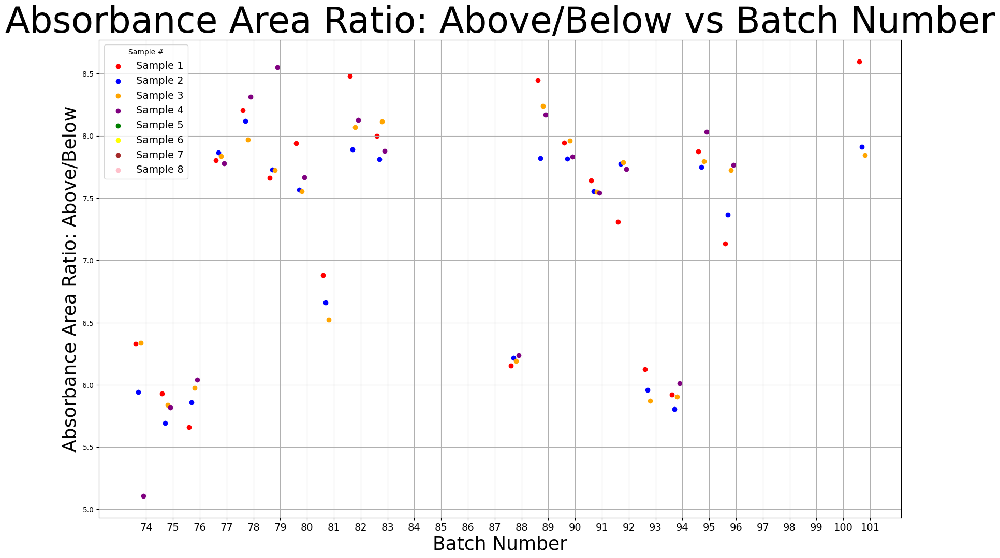

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

# Assuming 'df' is your DataFrame and it has columns 'Batch No.', 'Sample #', and 'Absorbance Area Ratio: Above/Below'
# Example DataFrame creation for demonstration
# df = pd.DataFrame({
#     'Batch No.': [74, 74, 75, 75, 76, 76, 77, 77],
#     'Sample #': [1, 2, 1, 2, 1, 2, 1, 2],
#     'Absorbance Area Ratio: Above/Below': [0.1, 0.2, 0.3, 0.4, np.nan, 0.6, 0.7, 0.8]
# })

# Filter out rows where 'Absorbance Area Ratio: Above/Below' is empty, None, or zero
df_filtered = df.dropna(subset=['Absorbance Area Ratio: Above/Below'])
df_filtered = df_filtered[df_filtered['Absorbance Area Ratio: Above/Below'] != 0]

# Ensure 'Absorbance Area Ratio: Above/Below' is numeric
df_filtered['Absorbance Area Ratio: Above/Below'] = pd.to_numeric(df_filtered['Absorbance Area Ratio: Above/Below'])

# Filter batches greater than 73 (if required)
df_filtered = df_filtered[df_filtered['Batch No.'] > 73]

# Get unique batch numbers and sample numbers
batch_numbers = sorted(df_filtered['Batch No.'].unique())
sample_numbers = sorted(df_filtered['Sample #'].unique())

# Map batches to indices for x-axis positions
batch_indices = range(len(batch_numbers))
batch_index_map = {batch: index for index, batch in zip(batch_indices, batch_numbers)}

# Create a color map for samples
colors = ['red', 'blue', 'orange', 'purple', 'green', 'yellow', 'brown', 'pink']
sample_color_map = {sample: colors[i % len(colors)] for i, sample in enumerate(sample_numbers)}

# Plotting
plt.figure(figsize=(20, 12))

for sample in sample_numbers:
    sample_data = df_filtered[df_filtered['Sample #'] == sample]
    x_positions = sample_data['Batch No.'].map(batch_index_map)
    # Adjust x_positions slightly for each sample to prevent overlap
    offset = (sample_numbers.index(sample) - len(sample_numbers)/2) * 0.1  # Adjust as needed
    x_positions = x_positions + offset
    plt.scatter(x_positions, sample_data['Absorbance Area Ratio: Above/Below'],
                color=sample_color_map[sample], label=f'Sample {sample}')

# Set x-axis labels
plt.xticks(range(len(batch_numbers)), batch_numbers, rotation=0, fontsize=14)

plt.xlabel('Batch Number', fontsize=26)
plt.ylabel('Absorbance Area Ratio: Above/Below', fontsize=26)
plt.title('Absorbance Area Ratio: Above/Below vs Batch Number', fontsize=50)
plt.legend(title='Sample #', fontsize=14)
plt.grid(True)
plt.show()


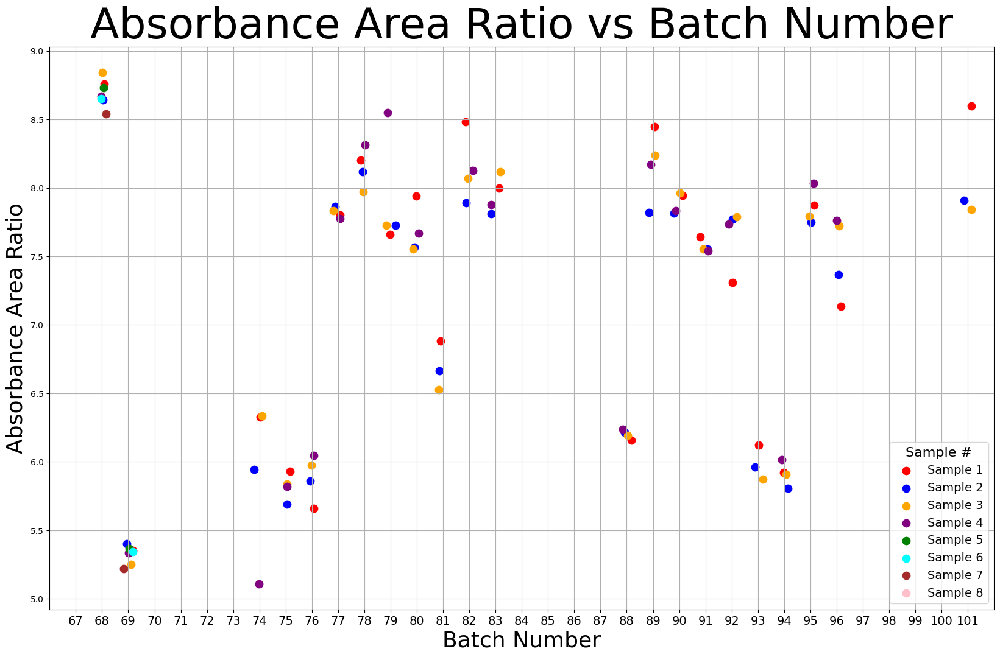

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

# Assuming 'df' is your DataFrame and it has columns 'Batch No.', 'Sample #', and 'Absorbance Area Ratio: Above/Below'
# Example DataFrame creation for demonstration (uncomment and modify according to your data)
# df = pd.DataFrame({
#     'Batch No.': [74, 74, 75, 75, 77, 77, 84, 85, 86, 87, 87, 88],
#     'Sample #': [1, 2, 1, 2, 1, 2, 3, 4, 5, 6, 7, 8],
#     'Absorbance Area Ratio: Above/Below': [0.1, 0.2, 0.3, 0.4, np.nan, 0.6, 0.5, 0.7, 0.8, 0.9, 1.0, 1.1]
# })

# Filter out rows where 'Absorbance Area Ratio: Above/Below' is NaN, None, or zero
df_filtered = df[df['Absorbance Area Ratio: Above/Below'].notnull() & (df['Absorbance Area Ratio: Above/Below'] != 0)]

# Ensure 'Absorbance Area Ratio: Above/Below' is numeric
df_filtered['Absorbance Area Ratio: Above/Below'] = pd.to_numeric(df_filtered['Absorbance Area Ratio: Above/Below'])

# Filter based on 'Batch No.' > 73
df_filtered = df_filtered[df_filtered['Batch No.'] > 66]

# Sort the DataFrame by 'Batch No.' for consistent plotting
df_filtered.sort_values('Batch No.', inplace=True)

# Get unique batch numbers that have data points
batch_numbers = df_filtered['Batch No.'].unique()

# Use the actual batch numbers as x positions
df_filtered['x_positions'] = df_filtered['Batch No.']

# Add jitter to x-axis positions to prevent overlapping points
np.random.seed(0)  # For reproducibility of the jitter
jitter = np.random.uniform(-0.2, 0.2, size=len(df_filtered))
df_filtered['x_positions'] += jitter

# Define colors for each sample number
colors = {
    1: 'red',
    2: 'blue',
    3: 'orange',
    4: 'purple',
    5: 'green',
    6: 'cyan',
    7: 'brown',
    8: 'pink'
}

# Plot
plt.figure(figsize=(20, 12))

# Plot each sample number with its specified color
for sample_num in df_filtered['Sample #'].unique():
    sample_data = df_filtered[df_filtered['Sample #'] == sample_num]
    # Convert sample_num to int when accessing the colors dictionary
    color = colors.get(int(sample_num), 'black')
    plt.scatter(sample_data['x_positions'], sample_data['Absorbance Area Ratio: Above/Below'],
                color=color, s=80, label=f'Sample {int(sample_num)}')

# Set x-ticks to the batch numbers that have data
plt.xticks(batch_numbers, batch_numbers, rotation=0, fontsize=14)

# Label axes and set title
plt.xlabel('Batch Number', fontsize=26)
plt.ylabel('Absorbance Area Ratio', fontsize=26)
plt.title('Absorbance Area Ratio vs Batch Number', fontsize=50)

# Optionally, set x-axis limits for better spacing
plt.xlim(min(batch_numbers) - 1, max(batch_numbers) + 1)

# Add grid for better readability
plt.grid(True)

# Add legend
plt.legend(title='Sample #', fontsize=14, title_fontsize=16)

# Show the plot
plt.show()


<ipython-input-22-513021734ef7>:18: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  colors = plt.cm.get_cmap('tab10', len(batch_numbers))


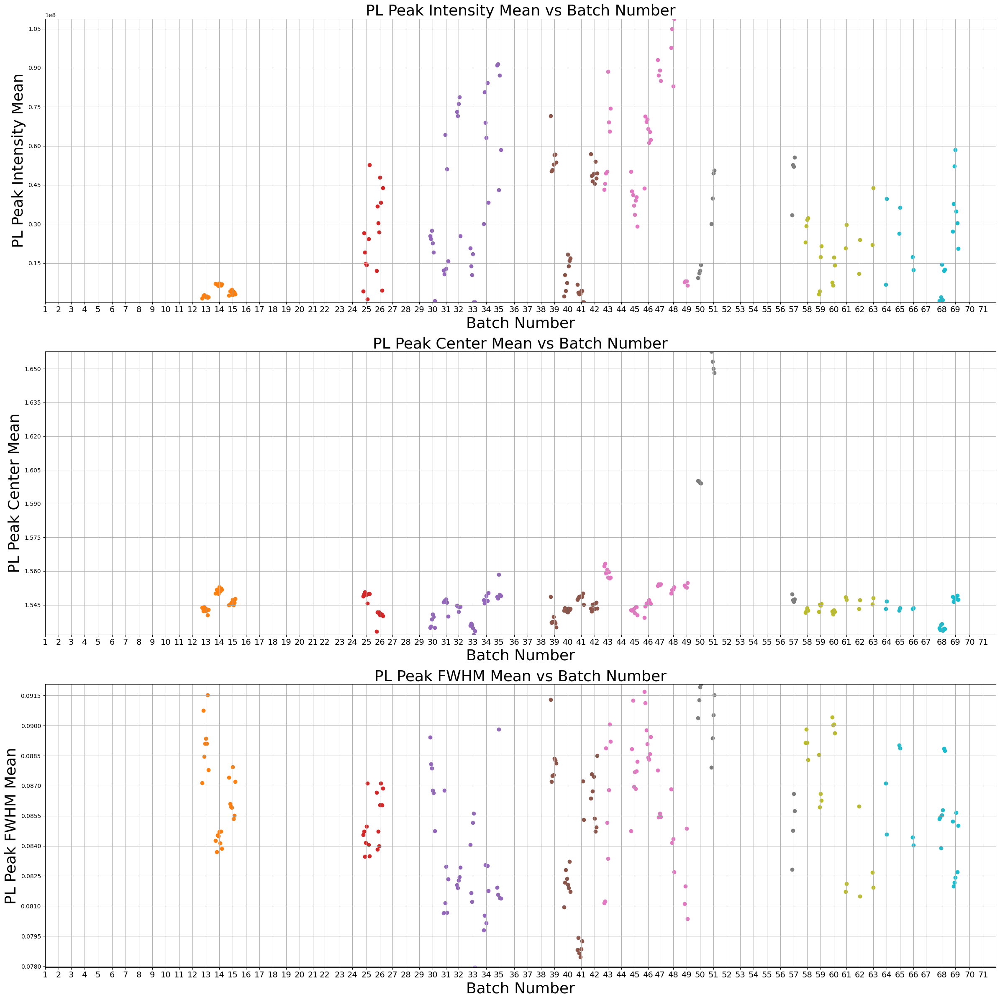

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.ticker import MaxNLocator


# Filter out rows where any of the important columns are empty
df_filtered = df.dropna(subset=['PL Peak Intensity Mean', 'PL Peak Center Mean', 'PL Peak FWHM Mean'])

# Ensure the columns are numeric
columns_to_numeric = ['PL Peak Intensity Mean', 'PL Peak Center Mean', 'PL Peak FWHM Mean']
df_filtered[columns_to_numeric] = df_filtered[columns_to_numeric].apply(pd.to_numeric)

# Get unique batch numbers
batch_numbers = df_filtered['Batch No.'].unique()

# Create a color map
colors = plt.cm.get_cmap('tab10', len(batch_numbers))

# Plot each batch with its specific color
plt.figure(figsize=(24, 24))  # Adjust figure size to fit 3x1 grid
spacing = 15  # Define a spacing factor for even distribution

# Define the columns to plot and their labels
columns_to_plot = ['PL Peak Intensity Mean', 'PL Peak Center Mean', 'PL Peak FWHM Mean']
y_labels = ['PL Peak Intensity Mean', 'PL Peak Center Mean', 'PL Peak FWHM Mean']
titles = ['PL Peak Intensity Mean vs Batch Number', 'PL Peak Center Mean vs Batch Number', 'PL Peak FWHM Mean vs Batch Number']

# Batches to ignore
ignore_batches = [52, 44]

# Calculate y-axis limits based on the data excluding ignored batches
y_limits = {}
for column in columns_to_plot:
    valid_data = df_filtered[~df_filtered['Batch No.'].isin(ignore_batches)][column]
    y_limits[column] = (valid_data.min(), valid_data.max())

for j, column in enumerate(columns_to_plot):
    plt.subplot(3, 1, j+1)  # Create a subplot for each column in a 3x1 grid
    x_ticks = []
    x_labels = []
    for i, batch in enumerate(batch_numbers):
        batch_data = df_filtered[df_filtered['Batch No.'] == batch].sort_values(by='Sample #')
        x_positions = np.arange(len(batch_data)) + i * spacing
        if batch not in ignore_batches and not batch_data.empty:  # Only plot if there's data for this batch and it's not ignored
            plt.scatter(x_positions, batch_data[column], color=colors(i), label=f'Batch {batch}')
        x_ticks.append(x_positions[len(x_positions) // 2])
        x_labels.append(f'{batch}')

    # Set y-axis limits and ticks based on the pre-calculated limits
    y_min, y_max = y_limits[column]

    plt.gca().yaxis.set_major_locator(MaxNLocator(nbins=10, prune='both'))  # Set a maximum of 10 ticks

    plt.ylim(y_min, y_max)

    # Set x-axis labels
    plt.xticks(x_ticks, x_labels, rotation=0, fontsize=14)

    plt.xlabel('Batch Number', fontsize=26)
    plt.ylabel(y_labels[j], fontsize=26)
    plt.title(titles[j], fontsize=26)
    plt.grid(True)

plt.tight_layout()
plt.show()

<ipython-input-13-389a45dd864c>:26: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  colors = plt.cm.get_cmap('tab10', len(batch_numbers))


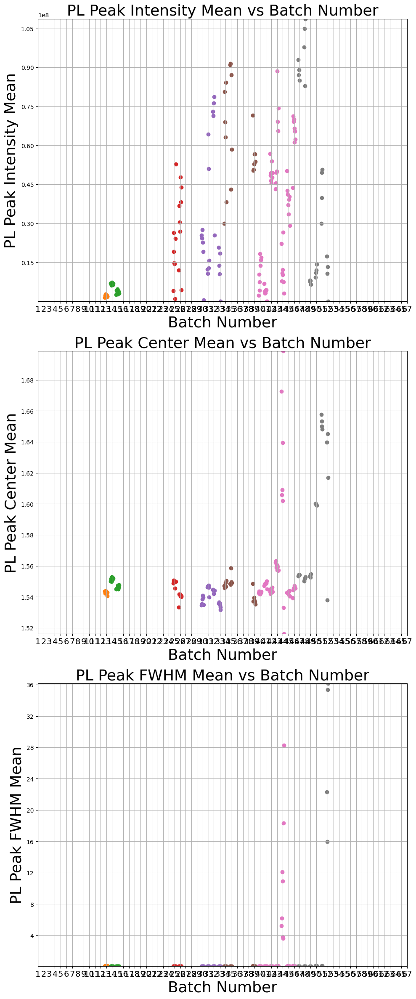

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.ticker import MaxNLocator

# Example DataFrame creation for demonstration
# df = pd.DataFrame({
#     'Batch No.': [1, 1, 2, 2, 3, 3, 4, 4],
#     'Sample #': [1, 2, 1, 2, 1, 2, 1, 2],
#     'PL Peak Intensity Mean': [2196242.331, 2196243.331, 2196244.331, 2196245.331, 2196246.331, 2196247.331, 2196248.331, 2196249.331],
#     'PL Peak Center Mean': [1.5424, 1.5425, 1.5426, 1.5427, 1.5428, 1.5429, 1.5430, 1.5431],
#     'PL Peak FWHM Mean': [0.08093486941, 0.08093486942, 0.08093486943, 0.08093486944, 0.08093486945, 0.08093486946, 0.08093486947, 0.08093486948]
# })

# Filter out rows where any of the important columns are empty
df_filtered = df.dropna(subset=['PL Peak Intensity Mean', 'PL Peak Center Mean', 'PL Peak FWHM Mean'])

# Ensure the columns are numeric
columns_to_numeric = ['PL Peak Intensity Mean', 'PL Peak Center Mean', 'PL Peak FWHM Mean']
df_filtered[columns_to_numeric] = df_filtered[columns_to_numeric].apply(pd.to_numeric)

# Get unique batch numbers
batch_numbers = df_filtered['Batch No.'].unique()

# Create a color map
colors = plt.cm.get_cmap('tab10', len(batch_numbers))

# Plot each batch with its specific color
plt.figure(figsize=(10, 24))  # Adjust figure size to fit 3x1 grid
x_ticks = []
x_labels = []
spacing = 15  # Define a spacing factor for even distribution

# Define the columns to plot and their labels
columns_to_plot = ['PL Peak Intensity Mean', 'PL Peak Center Mean', 'PL Peak FWHM Mean']
y_labels = ['PL Peak Intensity Mean', 'PL Peak Center Mean', 'PL Peak FWHM Mean']
titles = ['PL Peak Intensity Mean vs Batch Number', 'PL Peak Center Mean vs Batch Number', 'PL Peak FWHM Mean vs Batch Number']

for j, column in enumerate(columns_to_plot):
    plt.subplot(3, 1, j+1)  # Create a subplot for each column in a 3x1 grid
    for i, batch in enumerate(batch_numbers):
        batch_data = df_filtered[df_filtered['Batch No.'] == batch].sort_values(by='Sample #')
        x_positions = np.arange(len(batch_data)) + i * spacing
        plt.scatter(x_positions, batch_data[column], color=colors(i), label=f'Batch {batch}')
        if j == 0:  # Only set x_ticks and x_labels once
            x_ticks.append(x_positions[len(x_positions) // 2])
            x_labels.append(f'{batch}')

    # Set y-axis limits and ticks based on the range of the data
    y_max = df_filtered[column].max()
    y_min = df_filtered[column].min()

    plt.gca().yaxis.set_major_locator(MaxNLocator(nbins=10, prune='both'))  # Set a maximum of 10 ticks

    plt.ylim(y_min, y_max)

    # Set x-axis labels
    plt.xticks(x_ticks, x_labels, rotation=0, fontsize=14)

    plt.xlabel('Batch Number', fontsize=26)
    plt.ylabel(y_labels[j], fontsize=26)
    plt.title(titles[j], fontsize=26)
    plt.grid(True)

plt.tight_layout()
plt.show()

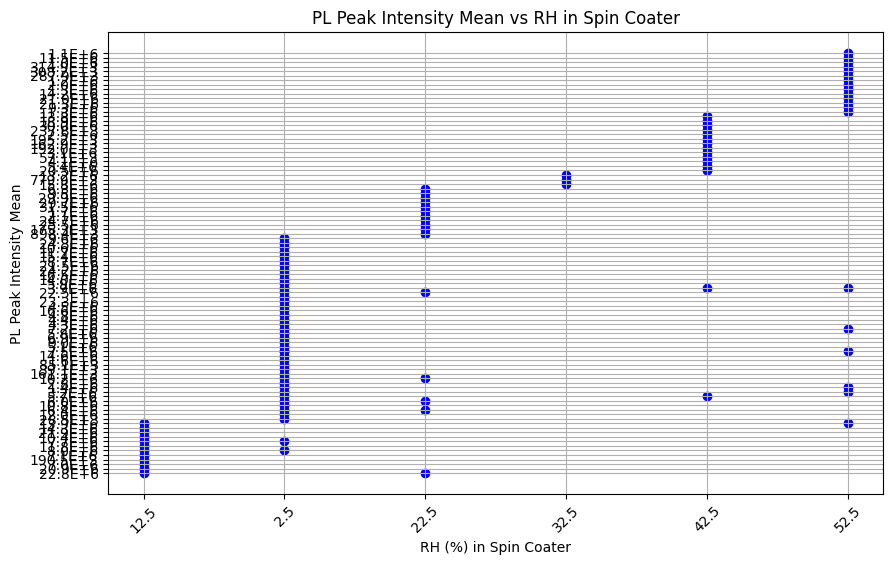

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt

# Sample DataFrame with more data points for demonstration

# Define the batches you want to select
selected_batches = list(range(74, 84)) + list(range(88, 94)) + list(range(94, 97)) + list(range(105, 114))

# Filter the DataFrame for the selected batches
filtered_df = df[df['Batch No.'].isin(selected_batches)]

# Sort the filtered DataFrame by RH
sorted_df = filtered_df.sort_values(by='RH (%) in spin coater')

# Create a scatter plot
plt.figure(figsize=(10, 6))
plt.scatter(sorted_df['RH (%) in spin coater'], sorted_df['PL Peak Intensity Mean'], color='blue')
plt.title('PL Peak Intensity Mean vs RH in Spin Coater')
plt.xlabel('RH (%) in Spin Coater')
plt.ylabel('PL Peak Intensity Mean')
plt.grid(True)
plt.xticks(rotation=45)
plt.show()

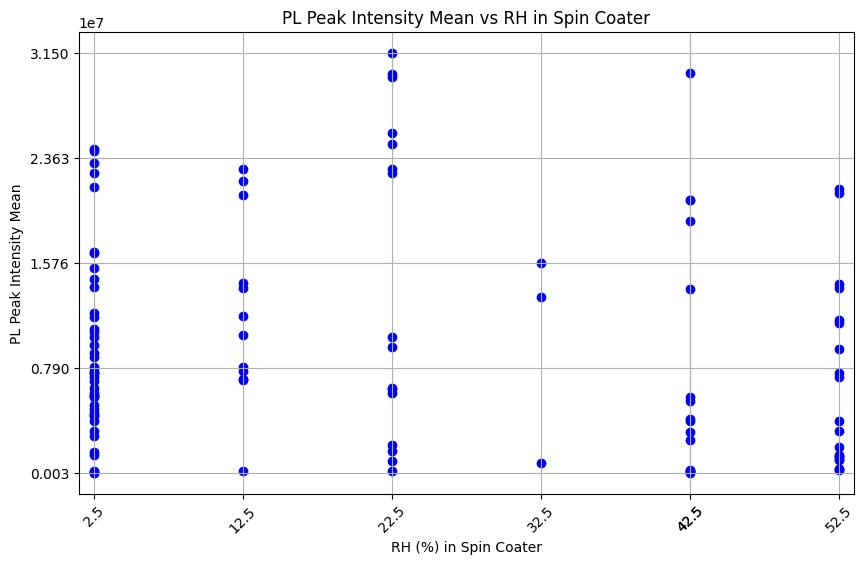

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt



# Ensure that columns are of the correct type
df['RH (%) in spin coater'] = pd.to_numeric(df['RH (%) in spin coater'], errors='coerce')
df['PL Peak Intensity Mean'] = pd.to_numeric(df['PL Peak Intensity Mean'], errors='coerce')  # Ensure numeric type

# Define the batches you want to select
selected_batches = list(range(74, 84)) + list(range(88, 94)) + list(range(94, 97)) + list(range(105, 114))

# Filter the DataFrame for the selected batches
filtered_df = df[df['Batch No.'].isin(selected_batches)]

# Create a scatter plot
plt.figure(figsize=(10, 6))
plt.scatter(filtered_df['RH (%) in spin coater'], filtered_df['PL Peak Intensity Mean'], color='blue')
plt.title('PL Peak Intensity Mean vs RH in Spin Coater')
plt.xlabel('RH (%) in Spin Coater')
plt.ylabel('PL Peak Intensity Mean')
plt.grid(True)

# Set x-axis limits
plt.xlim(filtered_df['RH (%) in spin coater'].min() - 1, filtered_df['RH (%) in spin coater'].max() + 1)

# Optionally adjust tick rotation
plt.xticks(rotation=45)
plt.xticks([2.5, 12.5, 22.5, 32.5, 42.5, 42.5, 52.5])

y_ticks = np.linspace(filtered_df['PL Peak Intensity Mean'].min(), filtered_df['PL Peak Intensity Mean'].max(), num=5)
plt.yticks(y_ticks)


plt.show()

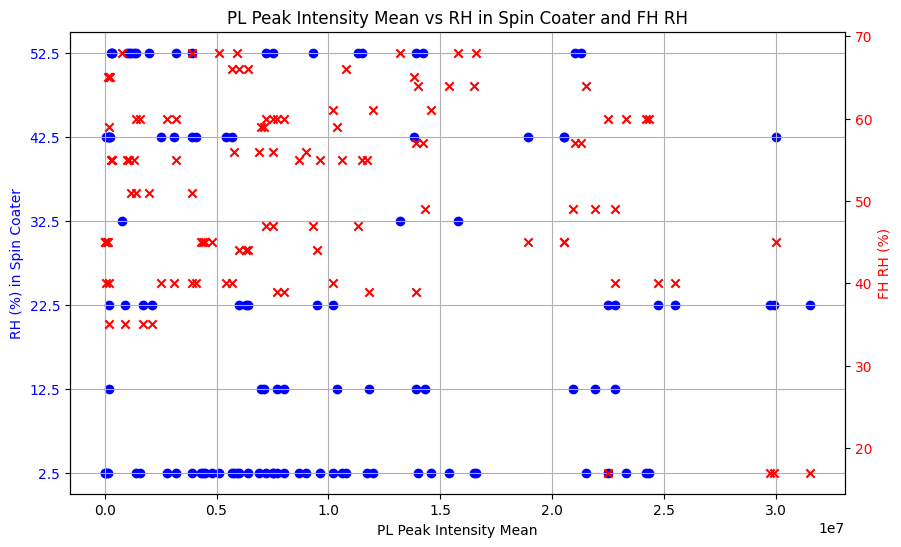

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt

# Sample DataFrame creation for demonstration (adjust according to your actual data)

# Ensure correct data types (if needed)
df['RH (%) in spin coater'] = pd.to_numeric(df['RH (%) in spin coater'], errors='coerce')
df['FH RH (%)'] = pd.to_numeric(df['FH RH (%)'], errors='coerce')
df['PL Peak Intensity Mean'] = pd.to_numeric(df['PL Peak Intensity Mean'], errors='coerce')

# Define the batches you want to select
selected_batches = list(range(74, 84)) + list(range(88, 94)) + list(range(94, 97)) + list(range(105, 114))

# Filter the DataFrame for the selected batches
filtered_df = df[df['Batch No.'].isin(selected_batches)]

# Create a scatter plot with dual y-axes
fig, ax1 = plt.subplots(figsize=(10, 6))

# Plot PL Peak Intensity Mean against RH in Spin Coater on the left y-axis
ax1.set_xlabel('PL Peak Intensity Mean')
ax1.set_ylabel('RH (%) in Spin Coater', color='blue')
ax1.scatter(filtered_df['PL Peak Intensity Mean'], filtered_df['RH (%) in spin coater'], color='blue', label='Spin Coater RH', marker='o')
ax1.tick_params(axis='y', labelcolor='blue')
plt.yticks([2.5, 12.5, 22.5, 32.5, 42.5, 52.5])

# Create a second y-axis to plot FH RH
ax2 = ax1.twinx()
ax2.set_ylabel('FH RH (%)', color='red')
ax2.scatter(filtered_df['PL Peak Intensity Mean'], filtered_df['FH RH (%)'], color='red', label='FH RH', marker='x')
ax2.tick_params(axis='y', labelcolor='red')

# Add title and grid
plt.title('PL Peak Intensity Mean vs RH in Spin Coater and FH RH')
ax1.grid()

# Show the plot
plt.show()

In [ ]:
print(df.columns)


Index(['Batch No.', 'Identifier UUID', 'Sample #', 'Batch Fab Date',
       'Batch Start Time', 'Perovskite composition', 'Additive',
       'Additive Conc. (%mol excess)', 'Soln date', '6', 'Conc. 1 (M)',
       'CsI (mg)', 'FAI (mg)', 'PbI2 (mg)', 'MACl 1 (mg)', 'DMF 1 (ml)',
       'DMSO 1 (ml)', 'Solution 2', 'Conc. 2 (M)', 'CsBr (mg)', 'FABr (mg)',
       'PbBr2 (mg)', 'MaCl 2 (mg)', 'DMF 2 (ml)', 'DMSO 2 (ml)',
       'Solution mixing (y/n)', 'Spincoater #',
       'Solution 1 (ul): Solution 2 (ul) volume ratio', 'Spin speed 1 (rpm) ',
       'Ramp 1 (rpm/s)', 'Time 1 (s)', 'Spin speed 2 (rpm)', 'Ramp 2 (rpm/s)',
       'Time 2 (s)', 'Tip height (mm)', 'Perovskite Volume (µl)',
       'Antisolvent', 'AS Volume (µl)', 'AS Delay (s)', 'AS Disp rate (µl/s)',
       'FH Temp (C )', 'FH RH (%)', 'RH (%) in spin coater', 'Ann temp (C )',
       'Ann time (min)', 'Preheat (hr) ', 'PMMA (mg/ml)', 'Substrate',
       'UVO duration (min)', 'UVO time taken out of instrument (mins)',
       

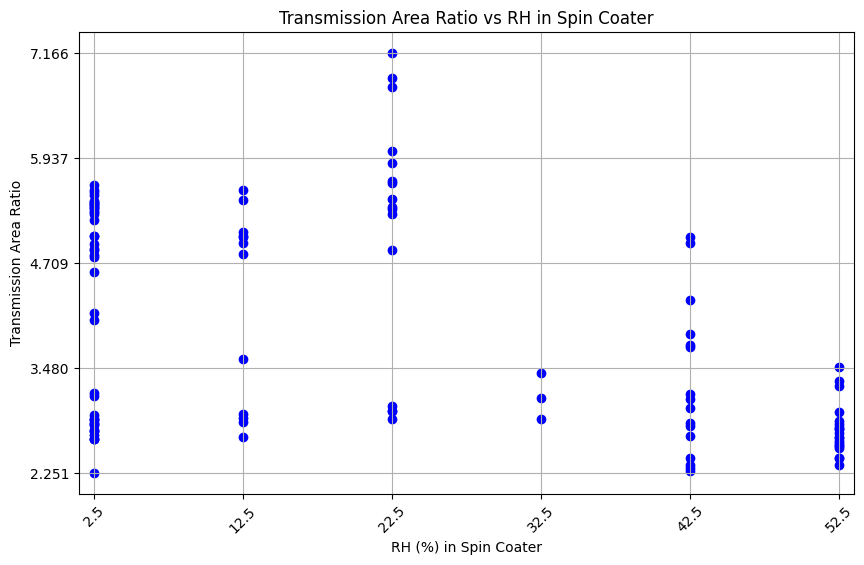

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np

# Ensure that columns are of the correct type
df['RH (%) in spin coater'] = pd.to_numeric(df['RH (%) in spin coater'], errors='coerce')
df['Trans Area Ratio'] = pd.to_numeric(df['Trans Area Ratio'], errors='coerce')  # Ensure numeric type

# Define the batches you want to select
selected_batches = list(range(74, 84)) + list(range(88, 94)) + list(range(94, 97)) + list(range(105, 114))

# Filter the DataFrame for the selected batches
filtered_df = df[df['Batch No.'].isin(selected_batches)]

# Create a scatter plot for Transmission Area Ratio
plt.figure(figsize=(10, 6))
plt.scatter(filtered_df['RH (%) in spin coater'], filtered_df['Trans Area Ratio'], color='blue')
plt.title('Transmission Area Ratio vs RH in Spin Coater')
plt.xlabel('RH (%) in Spin Coater')
plt.ylabel('Transmission Area Ratio')
plt.grid(True)

# Set x-axis limits
plt.xlim(filtered_df['RH (%) in spin coater'].min() - 1, filtered_df['RH (%) in spin coater'].max() + 1)

# Optionally adjust tick rotation
plt.xticks(rotation=45)
plt.xticks([2.5, 12.5, 22.5, 32.5, 42.5, 52.5])

# Set y-axis ticks dynamically
y_ticks = np.linspace(filtered_df['Trans Area Ratio'].min(), filtered_df['Trans Area Ratio'].max(), num=5)
plt.yticks(y_ticks)

plt.show()


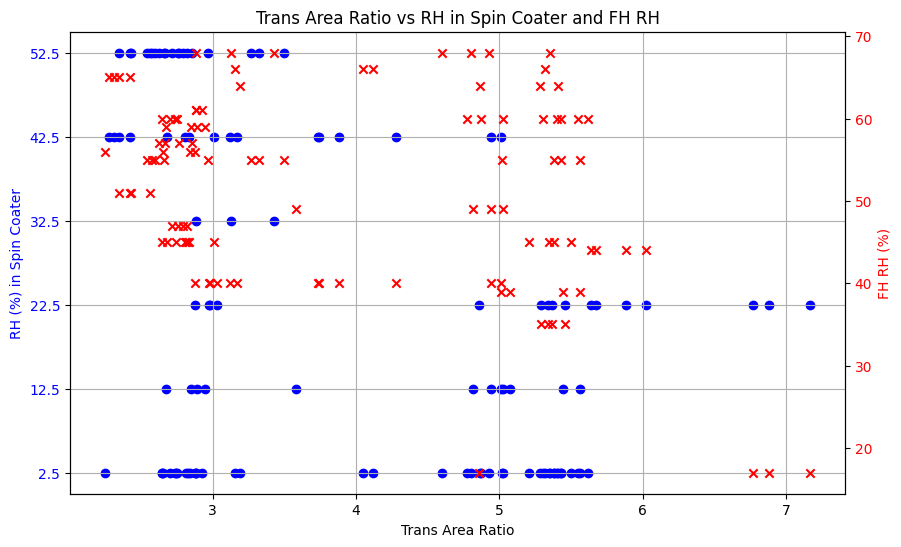

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt

# Ensure correct data types (if needed)
df['RH (%) in spin coater'] = pd.to_numeric(df['RH (%) in spin coater'], errors='coerce')
df['FH RH (%)'] = pd.to_numeric(df['FH RH (%)'], errors='coerce')
df['Trans Area Ratio'] = pd.to_numeric(df['Trans Area Ratio'], errors='coerce')

# Define the batches you want to select
selected_batches = list(range(74, 84)) + list(range(88, 94)) + list(range(94, 97)) + list(range(105, 114))

# Filter the DataFrame for the selected batches
filtered_df = df[df['Batch No.'].isin(selected_batches)]

# Create a scatter plot with dual y-axes
fig, ax1 = plt.subplots(figsize=(10, 6))

# Plot Trans Area Ratio against RH in Spin Coater on the left y-axis
ax1.set_xlabel('Trans Area Ratio')
ax1.set_ylabel('RH (%) in Spin Coater', color='blue')
ax1.scatter(filtered_df['Trans Area Ratio'], filtered_df['RH (%) in spin coater'], color='blue', label='Spin Coater RH', marker='o')
ax1.tick_params(axis='y', labelcolor='blue')
plt.yticks([2.5, 12.5, 22.5, 32.5, 42.5, 52.5])

# Create a second y-axis to plot FH RH
ax2 = ax1.twinx()
ax2.set_ylabel('FH RH (%)', color='red')
ax2.scatter(filtered_df['Trans Area Ratio'], filtered_df['FH RH (%)'], color='red', label='FH RH', marker='x')
ax2.tick_params(axis='y', labelcolor='red')

# Add title and grid
plt.title('Trans Area Ratio vs RH in Spin Coater and FH RH')
ax1.grid()

# Show the plot
plt.show()


Batch 64, Sample 1:
Batch 64, Sample 2:
Batch 65, Sample 1:
Batch 65, Sample 2:
Batch 66, Sample 1:
Batch 66, Sample 2:
Batch 61, Sample 1:
Batch 61, Sample 2:
Batch 62, Sample 1:
Batch 62, Sample 2:
Batch 63, Sample 1:
Batch 63, Sample 2:


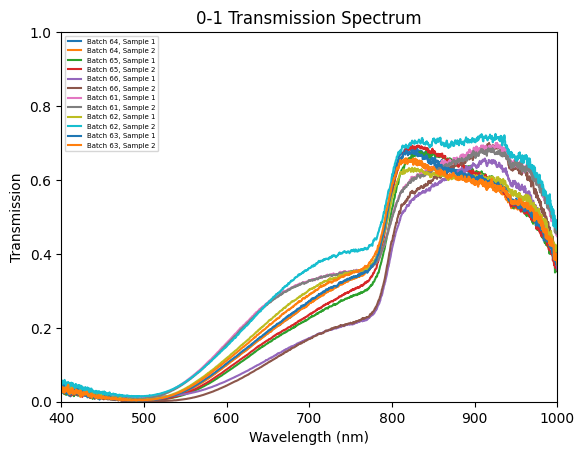

In [ ]:
for b in {61, 62, 63, 64, 65, 66}:
# for b in range(1,57,1):
  batch = df[df['Batch No.'] == b]
  # display(batch)
  num_samples = len(batch)
  for s in range(1, num_samples + 1):
  # for s in {6}:
    sample = batch[batch['Sample #'] == str(s)]
    print(f"Batch {b}, Sample {s}:")
    file_path = get_spec_run_filepath(sample)
    if not file_path:
        continue
    with h5py.File(file_path, 'r') as hf:

        photo = hf['measurement/spec_run/photo'][:]
        wl_dark_int_time = hf['measurement/spec_run/wl_dark_int_time'][()]
        wl_dark_spectrum = hf['measurement/spec_run/wl_dark_spectrum'][:]
        wl_samp_int_times = hf['measurement/spec_run/wl_spectra_int_times'][:]
        wl_samp_spectrum = hf['measurement/spec_run/wl_spectra'][:]
        wl_ref_int_time = hf['measurement/spec_run/wl_ref_int_time'][()]
        wl_ref_spectrum = hf['measurement/spec_run/wl_ref_spectrum'][:]
        wl_wave_axis = hf['measurement/spec_run/wl_wls'][:]
        settings_gr = hf['app/settings']
        sample_id = settings_gr.attrs['sample']


        '''
        WL Analysis
        '''

        # print("File data has been read successfully.")
        sample_spectrum_corr = wl_samp_spectrum/wl_samp_int_times.reshape((8,1)) - wl_dark_spectrum/wl_dark_int_time
        sample_spectrum_corr_mean = np.mean(sample_spectrum_corr, axis=0) #Average individual spectra per sample
        sample_spectrum_final = sample_spectrum_corr_mean / (wl_ref_spectrum/wl_ref_int_time - wl_dark_spectrum/wl_dark_int_time) #Divide by the reference


        # plt.figure()
        # plt.plot(wl_wave_axis, sample_spectrum_final, label=f'Sample Transmission Spectrum, Batch {b}, Sample {s}')
        # plt.title(f'Sample Transmission Spectrum, Batch {b}, Sample {s}')
        # plt.xlim(400,1000)
        # plt.xlabel('Wavelength (nm)')
        # plt.ylabel('Transmission')



        # plt.figure()
        # plt.plot(wl_wave_axis, sample_spectrum_corr_mean, label=f'Sample Samp Spectrum, Batch {b}, Sample {s}')
        # plt.title(f'Sample Samp Spectrum, Batch {b}, Sample {s}')
        # plt.xlim(400,1000)
        # # plt.ylim(0,1)
        # plt.xlabel('Wavelength (nm)')
        # plt.ylabel('Transmission')

        plt.plot(wl_wave_axis, sample_spectrum_final, label=f'Batch {b}, Sample {s}')
        plt.title(f'0-1 Transmission Spectrum')

        plt.xlim(400,1000)
        plt.ylim(0,1)
        plt.xlabel('Wavelength (nm)')
        plt.ylabel('Transmission')
        #make the text of the legened smaller
        #make the legend on the top left and even smaller than x-small
        plt.legend(fontsize=5, loc='upper left')

        # plt.legend(fontsize='x-small')
        # plt.show()
        # plt.legend()

        # plt.figure()
        # for i in range(0,8):
        #     plt.plot(wl_wave_axis, wl_samp_spectrum[i], label=f'Sample Samp Spectrum, Batch {b}, Sample {s}')
        # # plt.plot(wl_wave_axis, wl_samp_spectrum[2], label=f'Sample Samp Spectrum, Batch {b}, Sample {s}')
        # plt.title(f'Sample Samp Spectrum, Batch {b}, Sample {s}')
        # plt.xlim(400,1000)
        # # plt.ylim(0,1)
        # plt.xlabel('Wavelength (nm)')
        # plt.ylabel('Transmission')
plt.show()

Batch 74, Sample 1:
Batch 74, Sample 2:
Batch 74, Sample 3:
Batch 74, Sample 4:
Batch 75, Sample 1:
Batch 75, Sample 2:
Batch 75, Sample 3:
Batch 75, Sample 4:
Batch 76, Sample 1:
Batch 76, Sample 2:
Batch 76, Sample 3:
Batch 76, Sample 4:
Batch 77, Sample 1:
Batch 77, Sample 2:
Batch 77, Sample 3:
Batch 77, Sample 4:
Batch 78, Sample 1:
Batch 78, Sample 2:
Batch 78, Sample 3:
Batch 78, Sample 4:
Batch 79, Sample 1:
Batch 79, Sample 2:
Batch 79, Sample 3:
Batch 79, Sample 4:


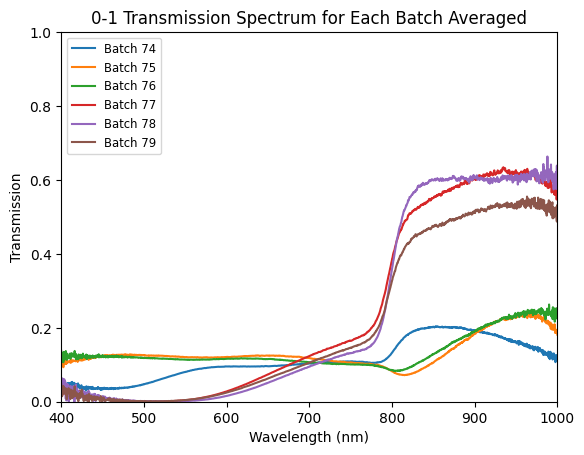

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import h5py

# Dictionary to store spectra for each batch
batch_spectra = {}

# for b in {36, 66, 68, 69}:

for b in range(74,80,1):
    batch = df[df['Batch No.'] == b]
    num_samples = len(batch)
    spectra_list = []

    for s in range(1, num_samples + 1):
        sample = batch[batch['Sample #'] == str(s)]
        print(f"Batch {b}, Sample {s}:")
        file_path = get_spec_run_filepath(sample)
        if not file_path:
            continue
        with h5py.File(file_path, 'r') as hf:
            photo = hf['measurement/spec_run/photo'][:]
            wl_dark_int_time = hf['measurement/spec_run/wl_dark_int_time'][()]
            wl_dark_spectrum = hf['measurement/spec_run/wl_dark_spectrum'][:]
            wl_samp_int_times = hf['measurement/spec_run/wl_spectra_int_times'][:]
            wl_samp_spectrum = hf['measurement/spec_run/wl_spectra'][:]
            wl_ref_int_time = hf['measurement/spec_run/wl_ref_int_time'][()]
            wl_ref_spectrum = hf['measurement/spec_run/wl_ref_spectrum'][:]
            wl_wave_axis = hf['measurement/spec_run/wl_wls'][:]
            settings_gr = hf['app/settings']
            sample_id = settings_gr.attrs['sample']

            # Correct the sample spectrum
            sample_spectrum_corr = wl_samp_spectrum / wl_samp_int_times.reshape((8, 1)) - wl_dark_spectrum / wl_dark_int_time
            sample_spectrum_corr_mean = np.mean(sample_spectrum_corr, axis=0)  # Average individual spectra per sample
            sample_spectrum_final = sample_spectrum_corr_mean / (wl_ref_spectrum / wl_ref_int_time - wl_dark_spectrum / wl_dark_int_time)  # Divide by the reference

            # Store the corrected spectrum
            spectra_list.append(sample_spectrum_final)

    # Compute the average spectrum for the batch
    if spectra_list:
        batch_spectra[b] = np.mean(spectra_list, axis=0)

# Plot the average spectra for each batch
plt.figure()
for b, avg_spectrum in batch_spectra.items():
    plt.plot(wl_wave_axis, avg_spectrum, label=f'Batch {b}')

plt.title('0-1 Transmission Spectrum for Each Batch Averaged')
plt.xlim(400, 1000)
plt.ylim(0, 1)
plt.xlabel('Wavelength (nm)')
plt.ylabel('Transmission')
plt.legend(fontsize="small", loc='upper left')
plt.show()

Batch 69, Sample 1:
Batch 69, Sample 2:
Batch 69, Sample 3:
Batch 69, Sample 4:
Batch 69, Sample 5:
Batch 69, Sample 6:
Batch 69, Sample 7:


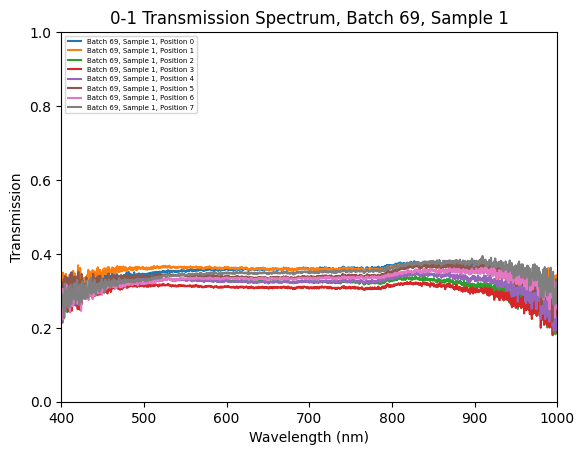

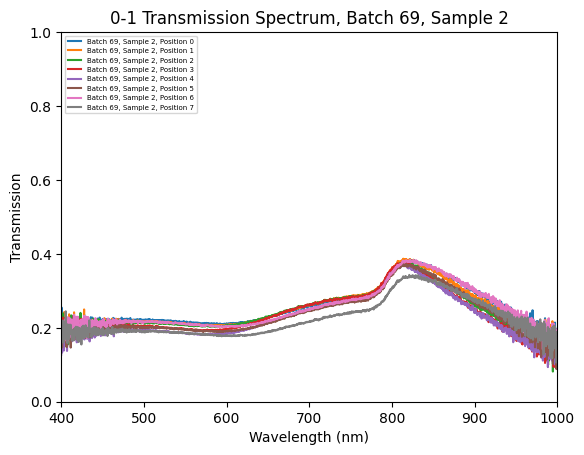

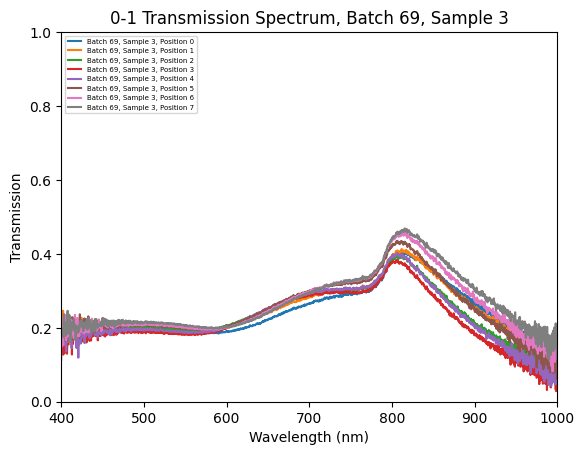

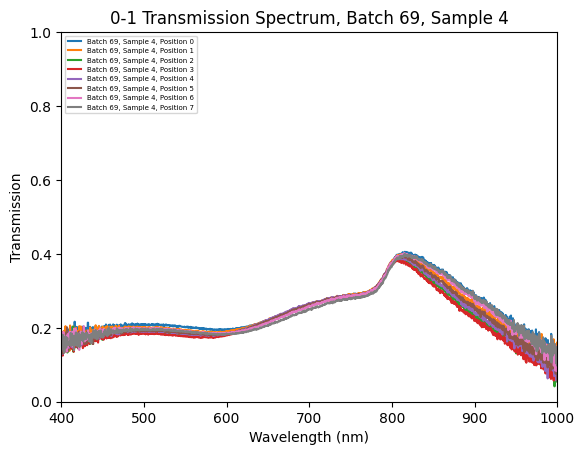

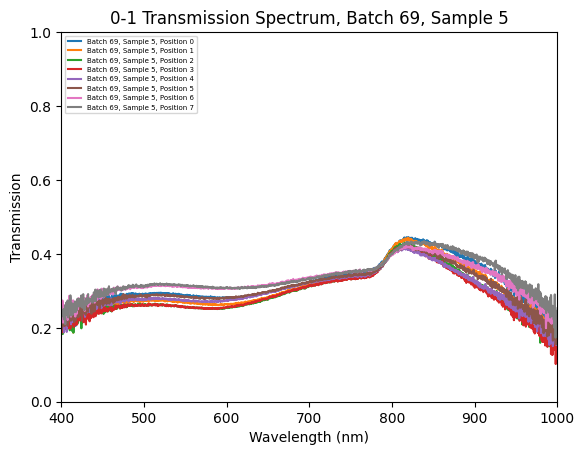

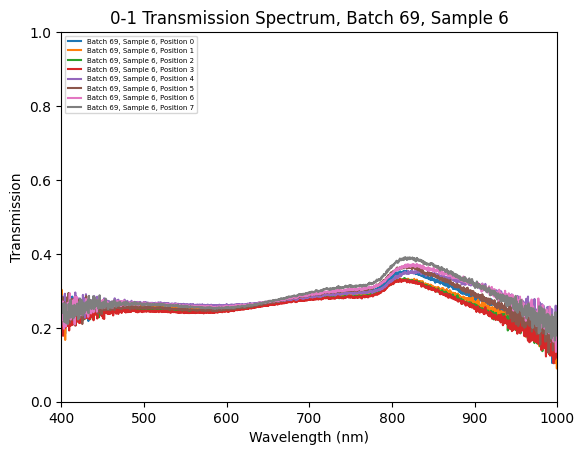

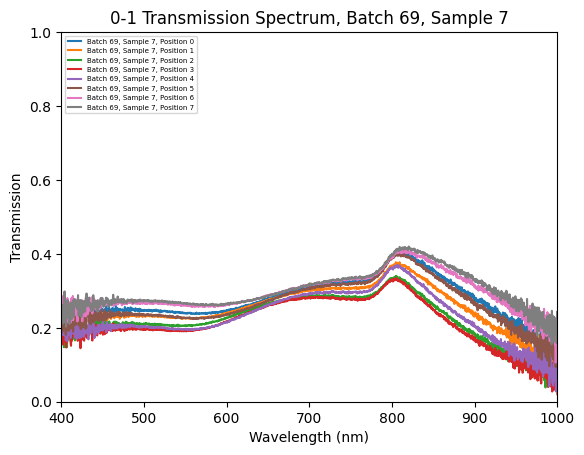

In [ ]:
for b in {69}:
# for b in range(68,70,1):
  batch = df[df['Batch No.'] == b]
  # display(batch)
  num_samples = len(batch)
  for s in range(1, num_samples + 1):
  # for s in {6}:
    sample = batch[batch['Sample #'] == str(s)]
    print(f"Batch {b}, Sample {s}:")
    file_path = get_spec_run_filepath(sample)
    if not file_path:
        continue
    with h5py.File(file_path, 'r') as hf:

        photo = hf['measurement/spec_run/photo'][:]
        wl_dark_int_time = hf['measurement/spec_run/wl_dark_int_time'][()]
        wl_dark_spectrum = hf['measurement/spec_run/wl_dark_spectrum'][:]
        wl_samp_int_times = hf['measurement/spec_run/wl_spectra_int_times'][:]
        wl_samp_spectrum = hf['measurement/spec_run/wl_spectra'][:]
        wl_ref_int_time = hf['measurement/spec_run/wl_ref_int_time'][()]
        wl_ref_spectrum = hf['measurement/spec_run/wl_ref_spectrum'][:]
        wl_wave_axis = hf['measurement/spec_run/wl_wls'][:]
        settings_gr = hf['app/settings']
        sample_id = settings_gr.attrs['sample']


        '''
        WL Analysis
        '''

        # print("File data has been read successfully.")
        sample_spectrum_corr = wl_samp_spectrum/wl_samp_int_times.reshape((8,1)) - wl_dark_spectrum/wl_dark_int_time
        # sample_spectrum_corr_mean = np.mean(sample_spectrum_corr, axis=0) #Average individual spectra per sample
        # sample_spectrum_final = sample_spectrum_corr_mean / (wl_ref_spectrum/wl_ref_int_time - wl_dark_spectrum/wl_dark_int_time) #Divide by the reference
        plt.figure()
        for i in range(sample_spectrum_corr.shape[0]):
          sample_spectrum_final_corr = sample_spectrum_corr[i] / (wl_ref_spectrum/wl_ref_int_time - wl_dark_spectrum/wl_dark_int_time) #Divide by the reference
          plt.plot(wl_wave_axis, sample_spectrum_final_corr, label=f'Batch {b}, Sample {s}, Position {i}')
        plt.title(f'0-1 Transmission Spectrum, Batch {b}, Sample {s}')
        plt.xlim(400,1000)


        plt.ylim(0,1)
        # plt.ylim(10**-3, 10**0)


        plt.xlabel('Wavelength (nm)')
        plt.ylabel('Transmission')

        # plt.yscale('log')

        #make the text of the legened smaller
        #make the legend on the top left and even smaller than x-small
        plt.legend(fontsize=5, loc='upper left')

        # plt.legend(fontsize='x-small')
        # plt.show()
        # plt.legend()

        # plt.figure()
        # for i in range(0,8):
        #     plt.plot(wl_wave_axis, wl_samp_spectrum[i], label=f'Sample Samp Spectrum, Batch {b}, Sample {s}')
        # # plt.plot(wl_wave_axis, wl_samp_spectrum[2], label=f'Sample Samp Spectrum, Batch {b}, Sample {s}')
        # plt.title(f'Sample Samp Spectrum, Batch {b}, Sample {s}')
        # plt.xlim(400,1000)
        # # plt.ylim(0,1)
        # plt.xlabel('Wavelength (nm)')
        # plt.ylabel('Transmission')

<Figure size 1000x1000 with 0 Axes>

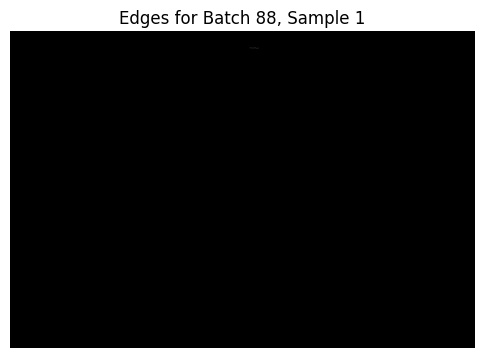

Inner square region not found for Batch 88, Sample 1.


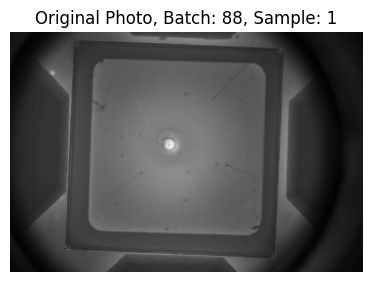

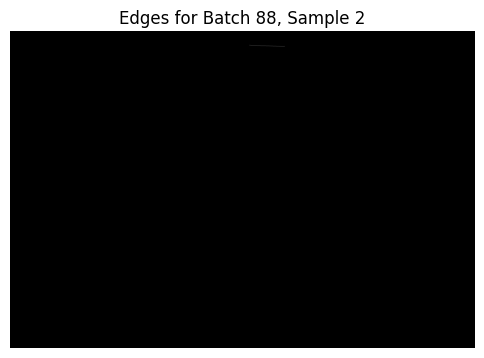

Inner square region not found for Batch 88, Sample 2.


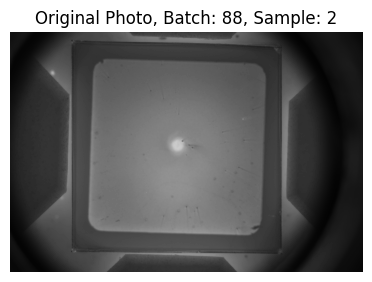

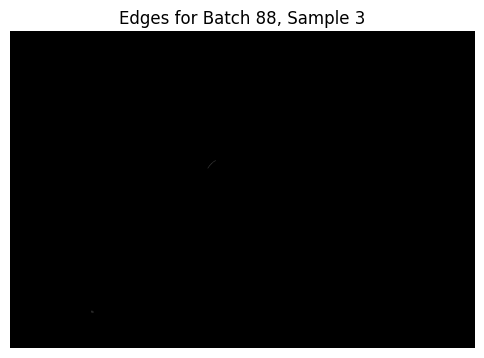

Inner square region not found for Batch 88, Sample 3.


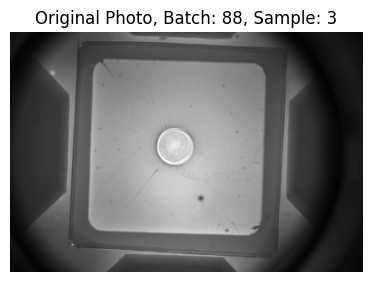

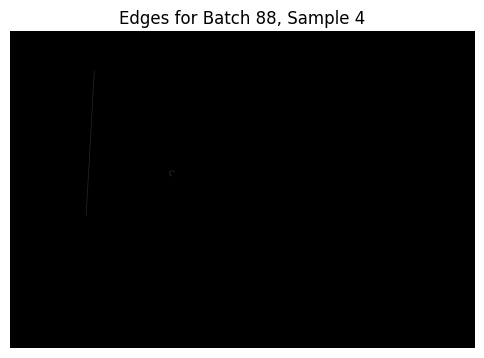

Inner square region not found for Batch 88, Sample 4.


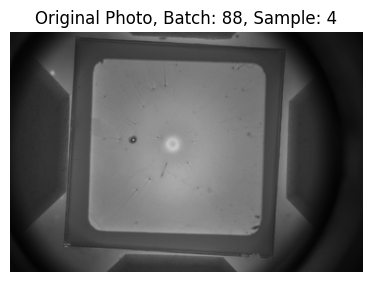

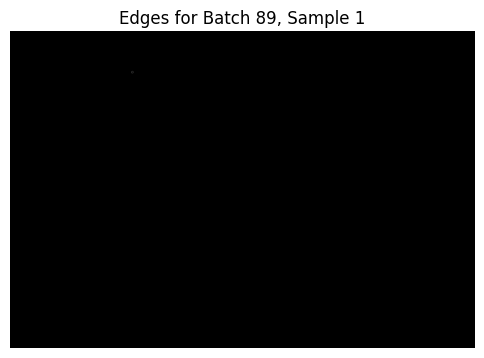

Inner square region not found for Batch 89, Sample 1.


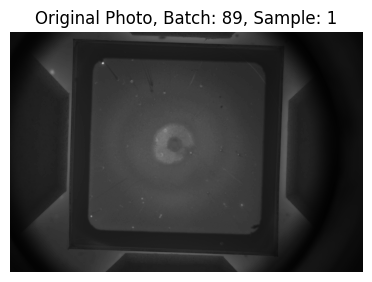

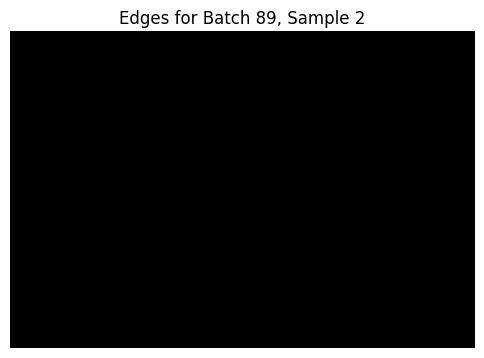

Inner square region not found for Batch 89, Sample 2.


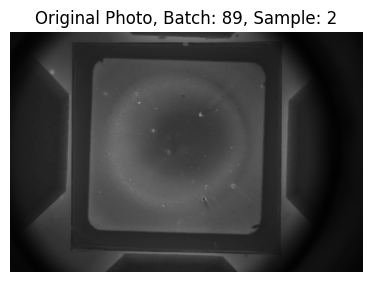

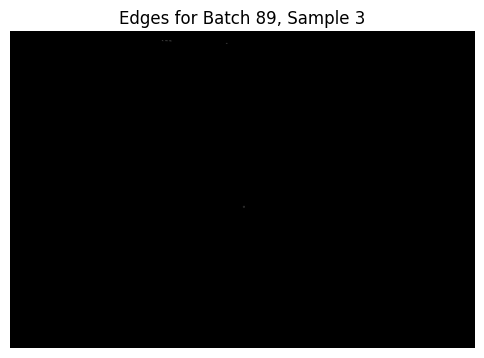

Inner square region not found for Batch 89, Sample 3.


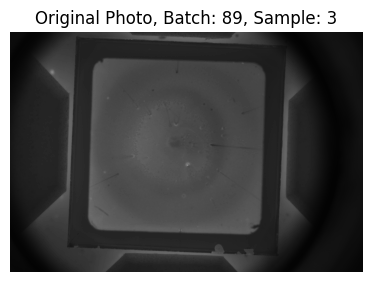

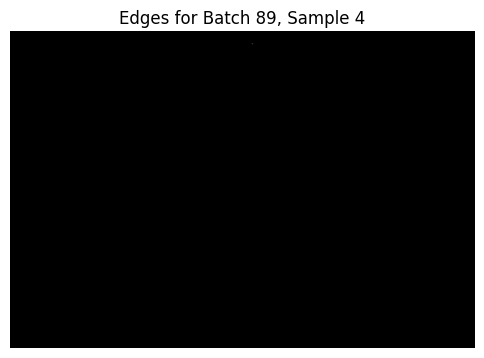

Inner square region not found for Batch 89, Sample 4.


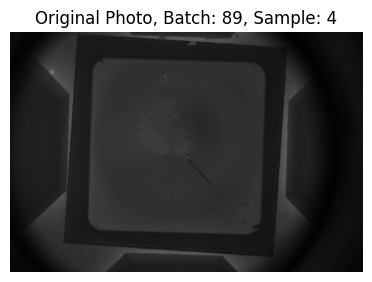

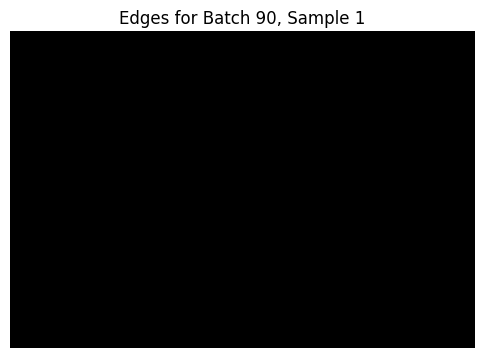

Inner square region not found for Batch 90, Sample 1.


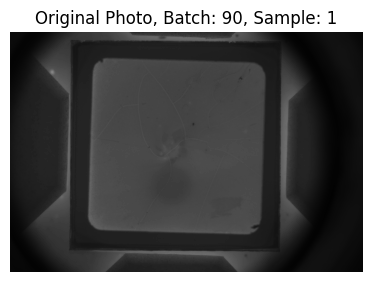

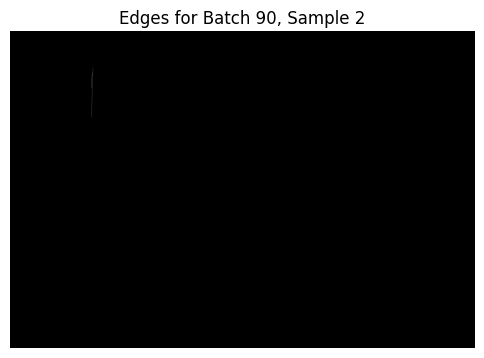

Inner square region not found for Batch 90, Sample 2.


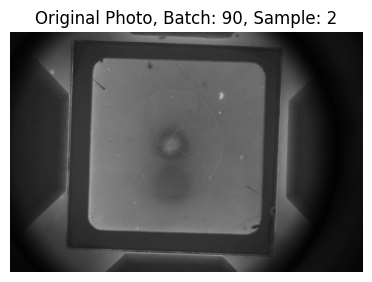

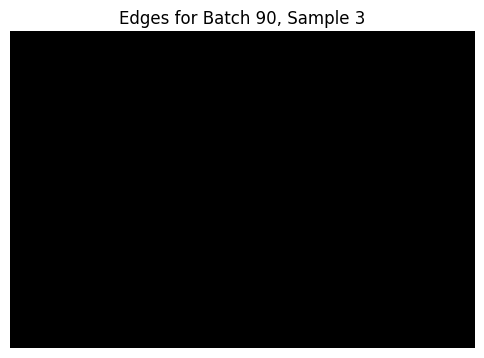

Inner square region not found for Batch 90, Sample 3.


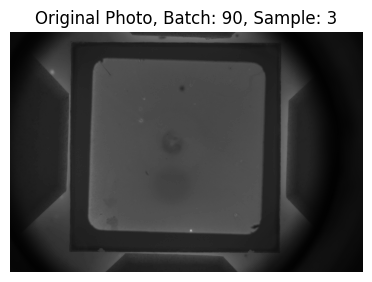

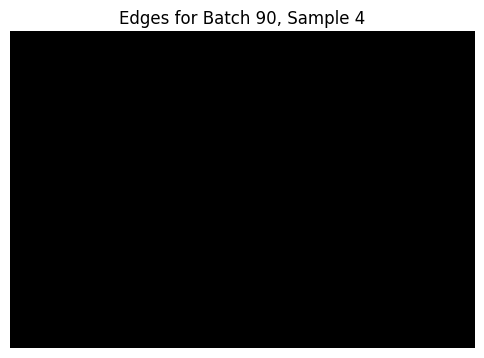

Inner square region not found for Batch 90, Sample 4.


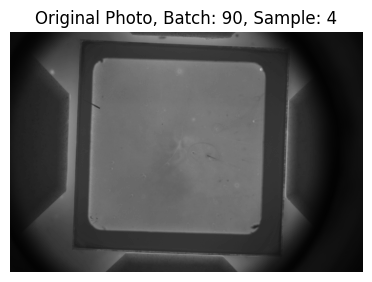

In [ ]:
import cv2
import h5py
import numpy as np
import matplotlib.pyplot as plt

label_size = 30
sigma = 15  # Adjust sigma for different levels of smoothing
plt.figure(figsize=(10, 10))

# Define a colormap
cmap = plt.get_cmap('tab20b')  # You can choose any colormap you prefer
color_index = 0

# Helper function to display an image with a title
def display_image(img, title=""):
    plt.figure(figsize=(6, 6))
    plt.imshow(img, cmap='gray')
    plt.title(title)
    plt.axis('off')
    plt.show()

for b in {88, 89, 90}:
    # Filter your DataFrame for the batch
    batch = df[df['Batch No.'] == b]
    num_samples = len(batch)

    for s in range(1, num_samples + 1):
        sample = batch[batch['Sample #'] == str(s)]
        file_path = get_spec_run_filepath(sample)

        if not file_path:
            continue

        with h5py.File(file_path, 'r') as hf:
            photo = hf['measurement/spec_run/photo'][:]
            photo_exposure = hf['measurement/spec_run/adj_photo_exposure'][()]
            settings_gr = hf['app/settings']
            sample_id = settings_gr.attrs['sample']

        # Convert the image to grayscale if necessary
        if photo.ndim == 3:
            gray_photo = cv2.cvtColor(photo, cv2.COLOR_BGR2GRAY)
        else:
            gray_photo = photo

        # Normalize the intensity of the image
        normalized_photo = cv2.normalize(gray_photo, None, 0, 255, cv2.NORM_MINMAX)

        # Apply Gaussian blur to reduce noise
        blurred_photo = cv2.GaussianBlur(normalized_photo, (5, 5), 0)

        # Use edge detection to identify contours
        edges = cv2.Canny(blurred_photo, 50, 150)
        display_image(edges, f"Edges for Batch {b}, Sample {s}")

        # Find contours with hierarchy to isolate inner square
        contours, hierarchy = cv2.findContours(edges, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

        # Identify the square contour by shape and size
        square_contour = None
        for i, contour in enumerate(contours):
            epsilon = 0.02 * cv2.arcLength(contour, True)
            approx = cv2.approxPolyDP(contour, epsilon, True)
            area = cv2.contourArea(contour)

            # Check if contour has 4 corners and falls within the area range
            if len(approx) == 4 and 10000 < area < 50000:  # Adjust area range as needed
                square_contour = approx
                break

        # Display the original photo and contours for debugging
        plt.figure(figsize=(10, 5))
        plt.subplot(1, 2, 1)
        plt.imshow(photo, cmap='gray')
        plt.title(f'Original Photo, Batch: {b}, Sample: {s}')
        plt.axis('off')

        if square_contour is not None:
            # Draw the detected contour on the image for debugging
            debug_photo = np.copy(photo)
            cv2.drawContours(debug_photo, [square_contour], -1, (255, 0, 0), 2)
            display_image(debug_photo, f"Detected Square Contour for Batch {b}, Sample {s}")

            # Apply a perspective transformation to isolate the square
            pts = square_contour.reshape(4, 2)
            rect = np.zeros((4, 2), dtype="float32")

            # Sort points: top-left, top-right, bottom-right, bottom-left
            s = pts.sum(axis=1)
            rect[0] = pts[np.argmin(s)]
            rect[2] = pts[np.argmax(s)]

            diff = np.diff(pts, axis=1)
            rect[1] = pts[np.argmin(diff)]
            rect[3] = pts[np.argmax(diff)]

            # Define the dimensions of the warped image
            (tl, tr, br, bl) = rect
            width = int(max(np.linalg.norm(br - bl), np.linalg.norm(tr - tl)))
            height = int(max(np.linalg.norm(tr - br), np.linalg.norm(tl - bl)))

            # Destination points for perspective transform
            dst = np.array([[0, 0], [width - 1, 0], [width - 1, height - 1], [0, height - 1]], dtype="float32")
            M = cv2.getPerspectiveTransform(rect, dst)
            warped_square = cv2.warpPerspective(normalized_photo, M, (width, height))

            # Display the isolated and warped square
            plt.subplot(1, 2, 2)
            plt.imshow(warped_square, cmap='gray')
            plt.title('Isolated Inner Square')
            plt.axis('off')

            # Calculate heterogeneity score within the warped square, adjusted by photo exposure
            exposure_adjusted_square = warped_square / photo_exposure
            intensities = exposure_adjusted_square[exposure_adjusted_square > 0]
            mean_intensity = np.mean(intensities)
            std_dev_intensity = np.std(intensities)
            heterogeneity_score = std_dev_intensity / mean_intensity if mean_intensity != 0 else 0

            plt.show()

            # Display the heterogeneity score
            print(f"Heterogeneity Score for Batch {b}, Sample {s}: {heterogeneity_score:.4f}")
        else:
            print(f"Inner square region not found for Batch {b}, Sample {s}.")

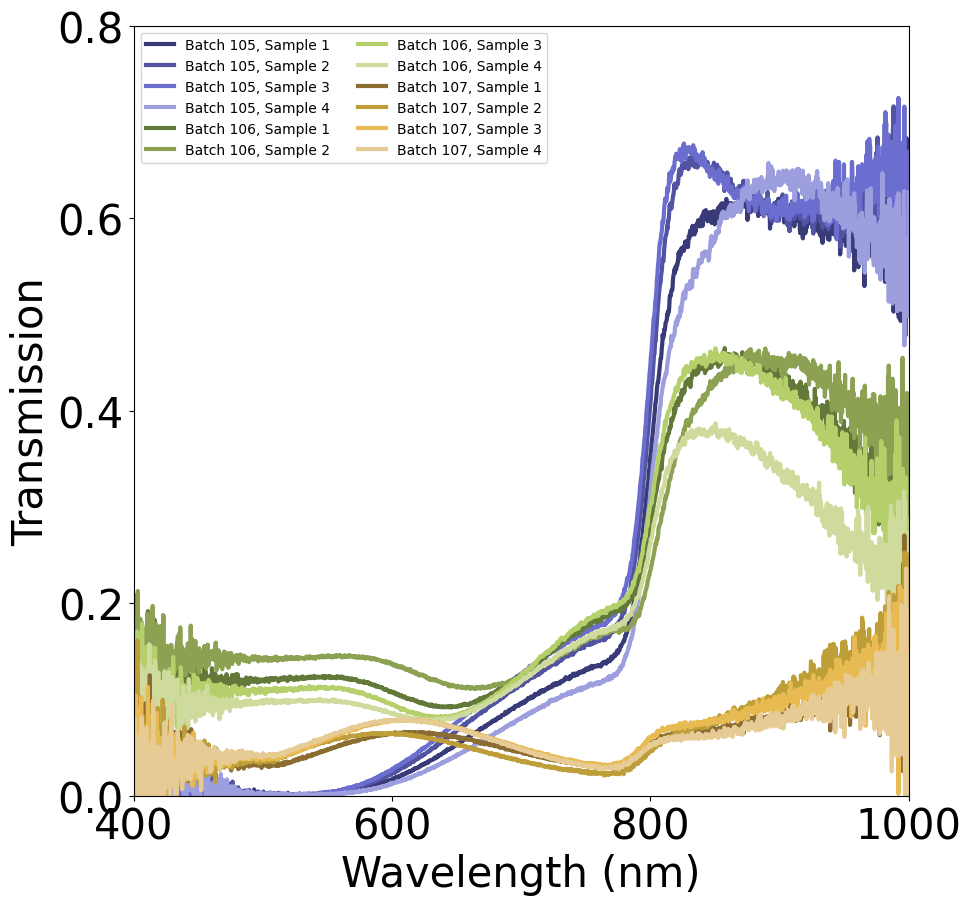

In [ ]:
import matplotlib.pyplot as plt
import numpy as np
from scipy.ndimage import gaussian_filter
import h5py
import pandas as pd

# Assuming df is your DataFrame and get_spec_run_filepath is your function

label_size = 30
sigma = 15  # Adjust sigma for different levels of smoothing

plt.figure(figsize=(10, 10))

# Combine two colormaps to create a larger set of distinct colors
cmap1 = plt.get_cmap('tab20b')
cmap2 = plt.get_cmap('tab20c')

# Create a list of colors from the combined colormaps
colors = [cmap1(i) for i in range(cmap1.N)] + [cmap2(i) for i in range(cmap2.N)]

color_index = 0

for b in range(105, 108):
    batch = df[df['Batch No.'] == b]
    num_samples = len(batch)
    for s in range(1, num_samples + 1):
        sample = batch[batch['Sample #'] == str(s)]
        file_path = get_spec_run_filepath(sample)
        if not file_path:
            continue
        with h5py.File(file_path, 'r') as hf:
            photo = hf['measurement/spec_run/photo'][:]
            wl_dark_int_time = hf['measurement/spec_run/wl_dark_int_time'][()]
            wl_dark_spectrum = hf['measurement/spec_run/wl_dark_spectrum'][:]
            wl_samp_int_times = hf['measurement/spec_run/wl_spectra_int_times'][:]
            wl_samp_spectrum = hf['measurement/spec_run/wl_spectra'][:]
            wl_ref_int_time = hf['measurement/spec_run/wl_ref_int_time'][()]
            wl_ref_spectrum = hf['measurement/spec_run/wl_ref_spectrum'][:]
            wl_wave_axis = hf['measurement/spec_run/wl_wls'][:]
            settings_gr = hf['app/settings']
            sample_id = settings_gr.attrs['sample']


            sample_spectrum_corr = wl_samp_spectrum / wl_samp_int_times.reshape((8, 1)) - wl_dark_spectrum / wl_dark_int_time
            sample_spectrum_corr_mean = np.mean(sample_spectrum_corr, axis=0)  # Average individual spectra per sample
            sample_spectrum_final = sample_spectrum_corr_mean / (wl_ref_spectrum / wl_ref_int_time - wl_dark_spectrum / wl_dark_int_time)  # Divide by the reference

            # Apply Gaussian smoothing
            smoothed_spectrum = gaussian_filter(sample_spectrum_final, sigma=sigma)

            # Plot the smoothed curve with a unique color from the combined colormaps
            plt.plot(wl_wave_axis, smoothed_spectrum, linewidth=3, label=f'Batch {b}, Sample {s}', color=colors[color_index])
            color_index = (color_index + 1) % len(colors)  # Cycle through colors

plt.xlim(400, 1000)
plt.xticks([400, 600, 800, 1000])
plt.ylim(0, 0.8)
plt.yticks([0, 0.2, 0.4, 0.6, 0.8])
plt.xlabel('Wavelength (nm)', fontsize=label_size)
plt.ylabel('Transmission', fontsize=label_size)
plt.legend(loc='upper left', ncol=2)
plt.tick_params(axis='both', which='major', labelsize=label_size)

plt.show()

<ipython-input-10-9cdd09dd1512>:56: RuntimeWarning: invalid value encountered in log10
  absorption = -np.log10(smoothed_spectrum)


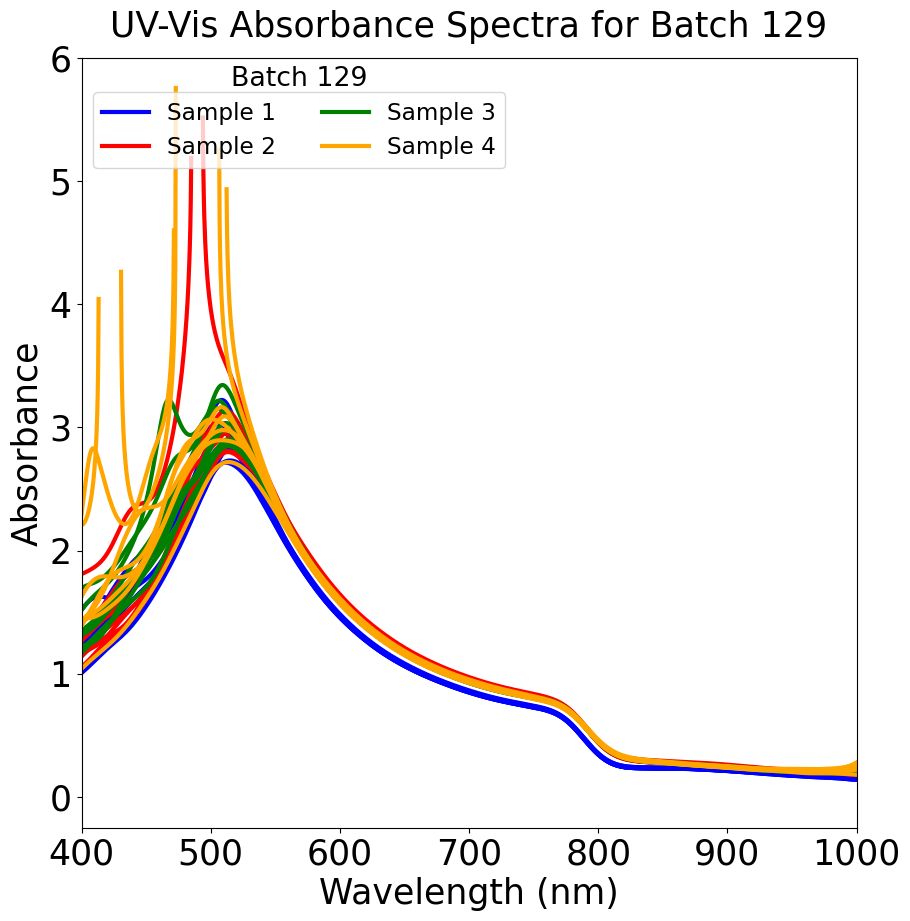

In [ ]:
import matplotlib.pyplot as plt
import numpy as np
from scipy.ndimage import gaussian_filter
import h5py
import pandas as pd

# Assuming df is your DataFrame and get_spec_run_filepath is your function

label_size = 25
sigma = 30  # Adjust sigma for different levels of smoothing

# Define a set of 4 distinct colors
colors = ['blue', 'red', 'green', 'orange']

# batches = [74, 80, 88, 92, 94, 95, 106, 107]  # Example batch numbers
batches = [129]

for b in batches:
    # Create a new figure for each batch
    plt.figure(figsize=(10, 10))
    batch = df[df['Batch No.'] == b]
    unique_samples = sorted(batch['Sample #'].unique(), key=lambda x: int(x))
    color_index = 0

    for s in unique_samples:
        sample = batch[batch['Sample #'] == s]
        file_path = get_spec_run_filepath(sample)
        # print(sample)
        if not file_path:
            continue
        # print(file_path + " FILE")

        with h5py.File(file_path, 'r') as hf:
            photo = hf['measurement/spec_run/photo'][:]
            wl_dark_int_time = hf['measurement/spec_run/wl_dark_int_time'][()]
            wl_dark_spectrum = hf['measurement/spec_run/wl_dark_spectrum'][:]
            wl_samp_int_times = hf['measurement/spec_run/wl_spectra_int_times'][:]
            wl_samp_spectrum = hf['measurement/spec_run/wl_spectra'][:]
            wl_ref_int_time = hf['measurement/spec_run/wl_ref_int_time'][()]
            wl_ref_spectrum = hf['measurement/spec_run/wl_ref_spectrum'][:]
            wl_wave_axis = hf['measurement/spec_run/wl_wls'][:]
            settings_gr = hf['app/settings']
            sample_id = settings_gr.attrs['sample']

            # Correct the sample spectra by subtracting dark and normalizing by integration times
            sample_spectrum_corr = (wl_samp_spectrum / wl_samp_int_times[:, None]) - (wl_dark_spectrum / wl_dark_int_time)
            # Divide by the reference spectrum (corrected for dark)
            sample_spectrum_corr /= (wl_ref_spectrum / wl_ref_int_time - wl_dark_spectrum / wl_dark_int_time)

            # Plot the 8 individual line scans for this sample in the same color
            # Add a legend entry only once per sample
            legend_label = f'Sample {s}'
            # for i, scan in enumerate(sample_spectrum_corr):
            for i, scan in enumerate(sample_spectrum_corr):
                smoothed_spectrum = gaussian_filter(scan, sigma=sigma)
                absorption = -np.log10(smoothed_spectrum)
                # smoothed_spectrum = scan

                # Only add the label to the first line scan of the sample
                # if i == 0:
                #     plt.plot(wl_wave_axis, smoothed_spectrum, linewidth=3, label=legend_label, color=colors[color_index])
                # else:
                #     plt.plot(wl_wave_axis, smoothed_spectrum, linewidth=3, color=colors[color_index])
                if i == 0:
                    plt.plot(wl_wave_axis, absorption, linewidth=3, label=legend_label, color=colors[color_index])
                else:
                    plt.plot(wl_wave_axis, absorption, linewidth=3, color=colors[color_index])

        color_index = (color_index + 1) % len(colors)  # Move to the next color for the next sample

    # # Set axes limits, ticks, labels, and legend for this batch figure
    # plt.xlim(400, 1000)
    # plt.xticks([400, 500, 600, 700, 800, 900, 1000])
    # plt.ylim(0, 0.9)
    # plt.yticks([0, 0.2, 0.4, 0.6, 0.8])
    # plt.xlabel('Wavelength (nm)', fontsize=label_size)
    # plt.ylabel('Transmission', fontsize=label_size)
    # legend = plt.legend(loc='upper left', ncol=2)
    # plt.tick_params(axis='both', which='major', labelsize=label_size)



    # # Show or save the figure for this batch
    # plt.title(f'UV-Vis Transmission Spectra for Batch {b}', fontsize=label_size)

    # if legend:
    #   # Get the legend's bounding box in figure coordinates
    #   bbox = legend.get_window_extent().transformed(plt.gca().transData.inverted())

    #   # Calculate text position based on the bounding box y1
    #   text_x = (bbox.x0 + bbox.x1) / 2  # Center horizontally
    #   text_y = bbox.y1 - 0.08  # Slightly above the legend

    #   plt.text(text_x, text_y, f'Batch {b}',
    #           ha='center', va='bottom', transform=plt.gca().transData, fontsize=label_size/2)
    # plt.show()
    # Set axes limits, ticks, labels, and legend for this batch figure
    plt.xlim(400, 1000)
    plt.xticks([400, 500, 600, 700, 800, 900, 1000])
    # plt.ylim(0, 0.9)
    # plt.yticks([0, 0.2, 0.4, 0.6, 0.8])
    plt.ylim(-0.25, 6)
    plt.yticks([0, 1, 2, 3, 4, 5, 6])

    plt.xlabel('Wavelength (nm)', fontsize=label_size)
    # plt.ylabel('Transmission', fontsize=label_size)
    plt.ylabel('Absorbance', fontsize=label_size)

    # Moving the legend slightly down from the upper left corner
    legend = plt.legend(loc='upper left', ncol=2, bbox_to_anchor=(0, .97),
                        handlelength=2, fontsize=label_size/1.5)
    plt.tick_params(axis='both', which='major', labelsize=label_size)

    # Show or save the figure for this batch
    # plt.title(f'UV-Vis Transmission Spectra for Batch {b}', fontsize=label_size)

    plt.title(f'UV-Vis Absorbance Spectra for Batch {b}', fontsize=label_size, pad=15)  # Adjust pad as needed

    # Place text above the legend using normalized coordinates
    if legend:
        # Get the legend's bounding box in figure coordinates
        bbox = legend.get_window_extent().transformed(plt.gca().transData.inverted())

        # Calculate text position based on the bounding box y1
        text_x = (bbox.x0 + bbox.x1) / 2  # Center horizontally
        text_y = bbox.y1 + 0.0025  # Slightly above the legend

        plt.text(text_x, text_y, f'Batch {b}',
                ha='center', va='bottom', transform=plt.gca().transData, fontsize=label_size/1.3)

    plt.show()




<ipython-input-6-531d77f15797>:110: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  legend = plt.legend(loc='upper left', ncol=2, bbox_to_anchor=(0, .97),


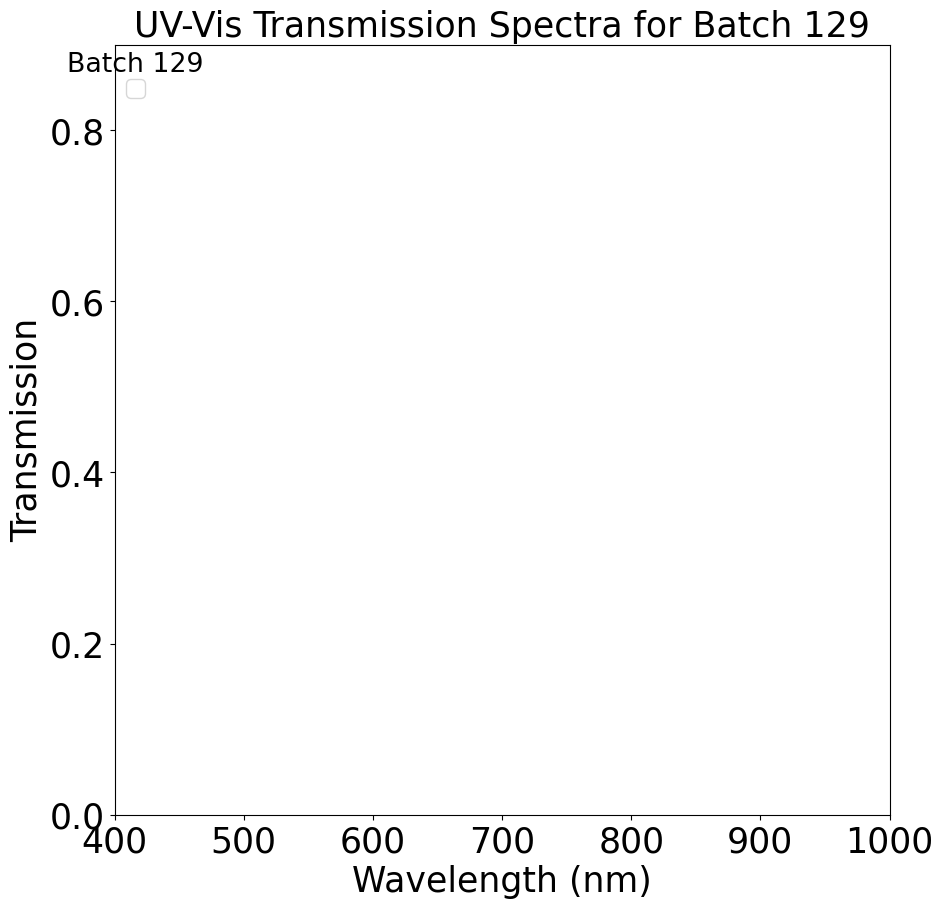

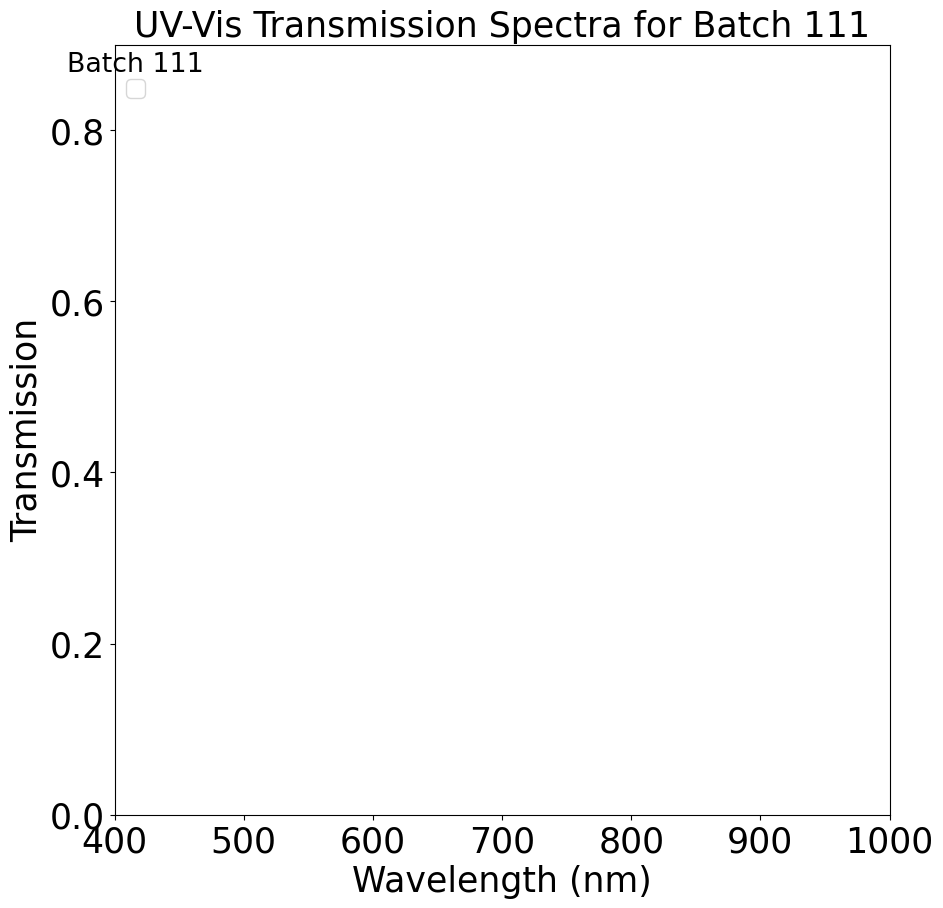

In [ ]:
import matplotlib.pyplot as plt
import numpy as np
from scipy.ndimage import gaussian_filter
import h5py
import pandas as pd

# Assuming df is your DataFrame and get_spec_run_filepath is your function

label_size = 25
sigma = 30  # Adjust sigma for different levels of smoothing

# Define a set of 4 distinct colors
colors = ['blue', 'red', 'green', 'orange']

batches = [129, 111]  # Example batch numbers
# batches = [134, 137]

for b in batches:
    # Create a new figure for each batch
    plt.figure(figsize=(10, 10))
    batch = df[df['Batch No.'] == b]
    unique_samples = sorted(batch['Sample #'].unique(), key=lambda x: int(x))
    color_index = 0

    for s in unique_samples:
        sample = batch[batch['Sample #'] == s]
        file_path = get_spec_run_filepath(sample)
        # print(sample)
        if not file_path:
            continue
        # print(file_path + " FILE")

        with h5py.File(file_path, 'r') as hf:
            photo = hf['measurement/spec_run/photo'][:]
            wl_dark_int_time = hf['measurement/spec_run/wl_dark_int_time'][()]
            wl_dark_spectrum = hf['measurement/spec_run/wl_dark_spectrum'][:]
            wl_samp_int_times = hf['measurement/spec_run/wl_spectra_int_times'][:]
            wl_samp_spectrum = hf['measurement/spec_run/wl_spectra'][:]
            wl_ref_int_time = hf['measurement/spec_run/wl_ref_int_time'][()]
            wl_ref_spectrum = hf['measurement/spec_run/wl_ref_spectrum'][:]
            wl_wave_axis = hf['measurement/spec_run/wl_wls'][:]
            settings_gr = hf['app/settings']
            sample_id = settings_gr.attrs['sample']

            # Correct the sample spectra by subtracting dark and normalizing by integration times
            sample_spectrum_corr = (wl_samp_spectrum / wl_samp_int_times[:, None]) - (wl_dark_spectrum / wl_dark_int_time)
            # Divide by the reference spectrum (corrected for dark)
            sample_spectrum_corr /= (wl_ref_spectrum / wl_ref_int_time - wl_dark_spectrum / wl_dark_int_time)

            # Plot the 8 individual line scans for this sample in the same color
            # Add a legend entry only once per sample
            legend_label = f'Sample {s}'
            # for i, scan in enumerate(sample_spectrum_corr):
            for i, scan in enumerate(sample_spectrum_corr):
                smoothed_spectrum = gaussian_filter(scan, sigma=sigma)
                # absorption = -np.log10(smoothed_spectrum)
                # smoothed_spectrum = scan

                # Only add the label to the first line scan of the sample
                if i == 0:
                    plt.plot(wl_wave_axis, smoothed_spectrum, linewidth=3, label=legend_label, color=colors[color_index])
                else:
                    plt.plot(wl_wave_axis, smoothed_spectrum, linewidth=3, color=colors[color_index])
                # if i == 0:
                #     plt.plot(wl_wave_axis, absorption, linewidth=3, label=legend_label, color=colors[color_index])
                # else:
                #     plt.plot(wl_wave_axis, absorption, linewidth=3, color=colors[color_index])

        color_index = (color_index + 1) % len(colors)  # Move to the next color for the next sample

    # # Set axes limits, ticks, labels, and legend for this batch figure
    # plt.xlim(400, 1000)
    # plt.xticks([400, 500, 600, 700, 800, 900, 1000])
    # plt.ylim(0, 0.9)
    # plt.yticks([0, 0.2, 0.4, 0.6, 0.8])
    # plt.xlabel('Wavelength (nm)', fontsize=label_size)
    # plt.ylabel('Transmission', fontsize=label_size)
    # legend = plt.legend(loc='upper left', ncol=2)
    # plt.tick_params(axis='both', which='major', labelsize=label_size)



    # # Show or save the figure for this batch
    # plt.title(f'UV-Vis Transmission Spectra for Batch {b}', fontsize=label_size)

    # if legend:
    #   # Get the legend's bounding box in figure coordinates
    #   bbox = legend.get_window_extent().transformed(plt.gca().transData.inverted())

    #   # Calculate text position based on the bounding box y1
    #   text_x = (bbox.x0 + bbox.x1) / 2  # Center horizontally
    #   text_y = bbox.y1 - 0.08  # Slightly above the legend

    #   plt.text(text_x, text_y, f'Batch {b}',
    #           ha='center', va='bottom', transform=plt.gca().transData, fontsize=label_size/2)
    # plt.show()
    # Set axes limits, ticks, labels, and legend for this batch figure
    plt.xlim(400, 1000)
    plt.xticks([400, 500, 600, 700, 800, 900, 1000])
    plt.ylim(0, 0.9)
    plt.yticks([0, 0.2, 0.4, 0.6, 0.8])
    # plt.ylim(-0.25, 6)
    # plt.yticks([0, 1, 2, 3, 4, 5, 6])

    plt.xlabel('Wavelength (nm)', fontsize=label_size)
    plt.ylabel('Transmission', fontsize=label_size)
    # plt.ylabel('Absorbance', fontsize=label_size)

    # Moving the legend slightly down from the upper left corner
    legend = plt.legend(loc='upper left', ncol=2, bbox_to_anchor=(0, .97),
                        handlelength=2, fontsize=label_size/1.5)
    plt.tick_params(axis='both', which='major', labelsize=label_size)

    # Show or save the figure for this batch
    plt.title(f'UV-Vis Transmission Spectra for Batch {b}', fontsize=label_size)

    # plt.title(f'UV-Vis Absorbance Spectra for Batch {b}', fontsize=label_size, pad=15)  # Adjust pad as needed

    # Place text above the legend using normalized coordinates
    if legend:
        # Get the legend's bounding box in figure coordinates
        bbox = legend.get_window_extent().transformed(plt.gca().transData.inverted())

        # Calculate text position based on the bounding box y1
        text_x = (bbox.x0 + bbox.x1) / 2  # Center horizontally
        text_y = bbox.y1 + 0.0025  # Slightly above the legend

        plt.text(text_x, text_y, f'Batch {b}',
                ha='center', va='bottom', transform=plt.gca().transData, fontsize=label_size/1.3)

    plt.show()


Batch 95, Sample 1: DONE
Batch 95, Sample 2: DONE
Batch 95, Sample 3: DONE
Batch 95, Sample 4: DONE


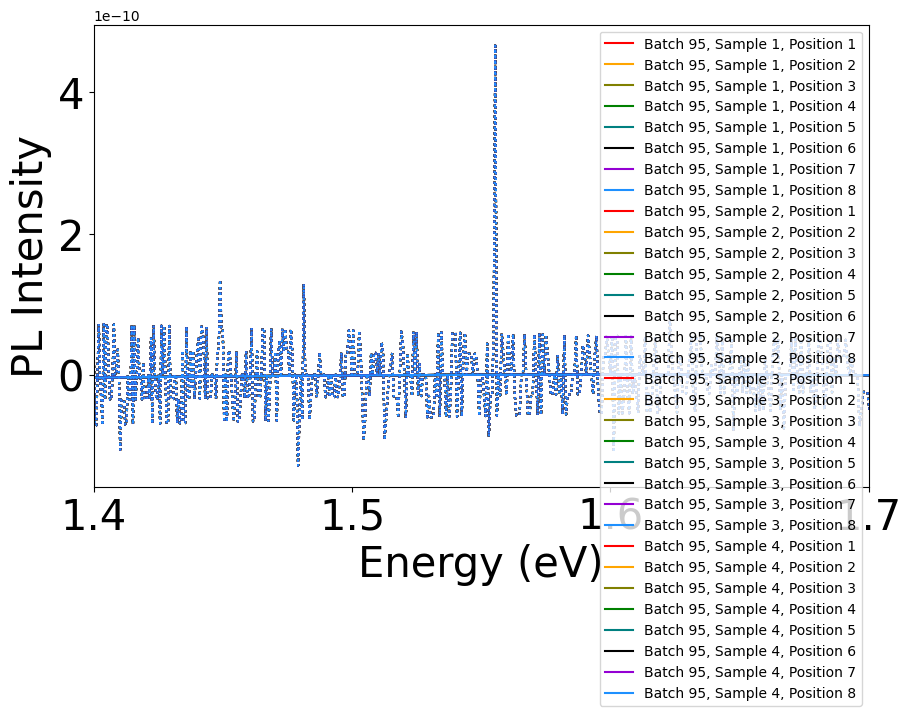

In [ ]:
from lmfit.models import LinearModel, PseudoVoigtModel, GaussianModel

label_size  = 30
# Loop through batches
for b in range(95, 96, 1):
    batch = df[df['Batch No.'] == b]
    num_samples = len(batch)
    plt.figure(figsize=(10, 6))
    # Loop through samples
    for s in range(1, num_samples + 1):
        sample = batch[batch['Sample #'] == str(s)]
        file_path = get_spec_run_filepath(sample)
        if not file_path:
            continue

        with h5py.File(file_path, 'r') as hf:
            photo = hf['measurement/spec_run/photo'][:]
            dark_int_time = hf['measurement/spec_run/pl_dark_int_time'][()]
            dark_spectrum = hf['measurement/spec_run/pl_dark_spectrum'][:]
            spec_int_times = hf['measurement/spec_run/pl_spectra_int_times'][:]
            spectra = hf['measurement/spec_run/pl_spectra'][:]
            ref_int_time = hf['measurement/spec_run/pl_ref_int_time'][()]
            ref_spectrum = hf['measurement/spec_run/pl_ref_spectrum'][:]
            wls = hf['measurement/spec_run/pl_wls'][:]
            settings_gr = hf['app/settings']
            sample_id = settings_gr.attrs['sample']

            '''
            PL Analysis
            '''
            p1_intensity_array = []
            p1_center_array = []
            p1_fwhm_array = []

            # Set up a figure with the correct size before plotting


            for i in range(spectra.shape[0]):
                time_normalized = np.divide(spectra[i], spec_int_times[i]) - np.divide(dark_spectrum, dark_int_time)

                lowQ_idx = find_nearest(wls, 650)
                highQ_idx = find_nearest(wls, 950)

                x = wls[lowQ_idx:highQ_idx]
                y = time_normalized[lowQ_idx:highQ_idx]

                energies = wavelength_to_energy(x)
                transformed_signal = apply_jacobian(y, x)

                bkg = LinearModel()
                pars = bkg.guess(transformed_signal, x=energies)

                peak1 = PseudoVoigtModel(prefix='p1_')
                pars.update(peak1.make_params(center=1.55, sigma=.1, amplitude=max(spectra[i]) / 5))
                pars['p1_center'].min = 1.4
                pars['p1_center'].max = 1.7

                mod = bkg + peak1
                out = mod.fit(transformed_signal, pars, x=energies)

                # Get colors for plotting
                def get_color(i, colors):
                    return colors[i % len(colors)]

                colors = ['red', 'orange', 'olive', 'green', 'teal', 'black', 'darkviolet', 'dodgerblue']
                c = get_color(i, colors)

                # Plot the data
                plt.plot(energies, transformed_signal, ':', color=c)
                plt.plot(energies, out.best_fit, '-', color=c, label=f'Batch {b}, Sample {s}, Position {str(i+1)}')


        print(f"Batch {b}, Sample {s}: DONE")

              # Finalize the plot
    plt.xlim(1.4, 1.7)
    plt.xlabel('Energy (eV)', fontsize=label_size)
    plt.ylabel('PL Intensity', fontsize=label_size)
    plt.legend(loc='upper right')
    plt.tick_params(axis='both', which='major', labelsize=label_size)
      # plt.show()  # Display the plot


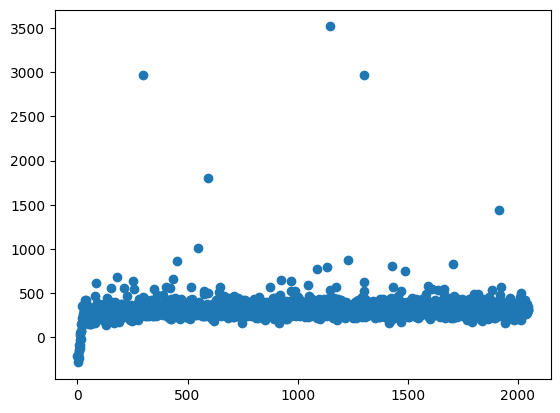

In [ ]:
plt.scatter(range(len(spectra[0,:])),spectra[0,:])

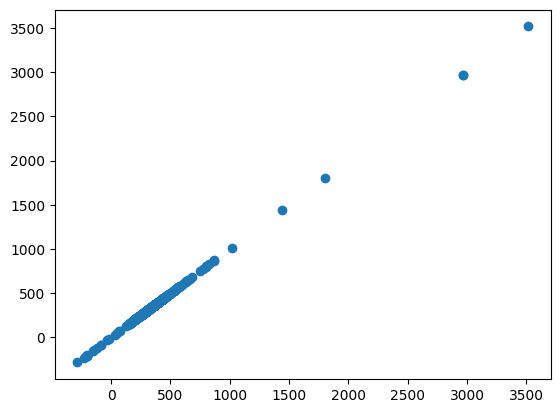

In [ ]:
plt.scatter(spectra[3,:], dark_spectrum)



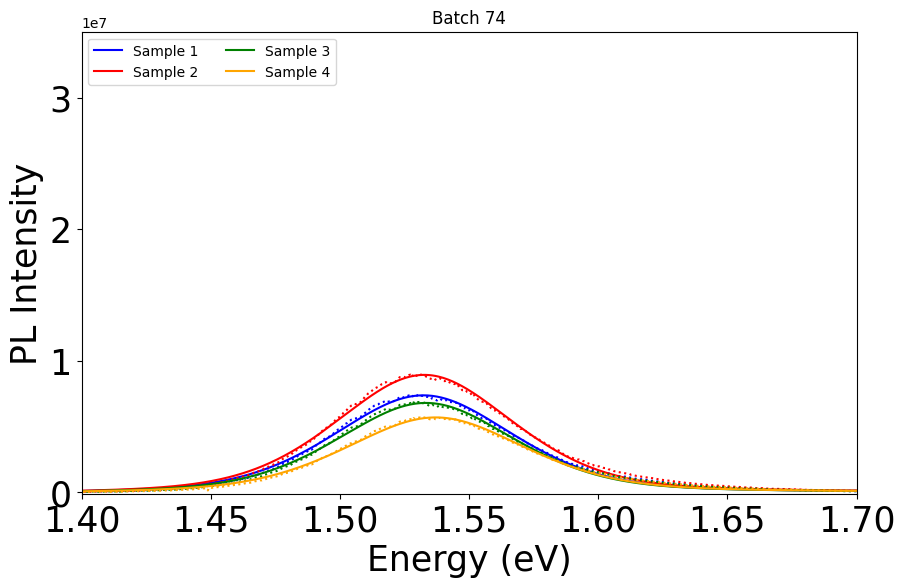

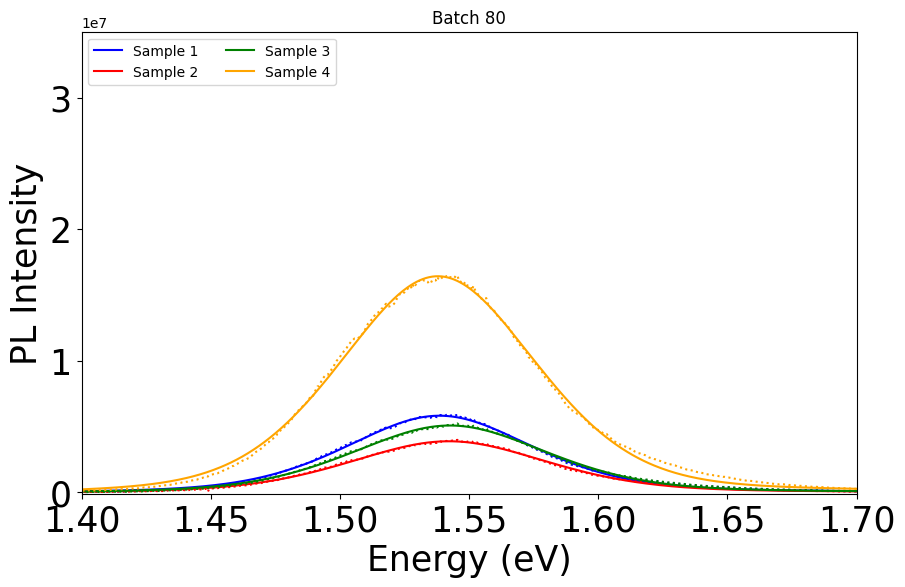

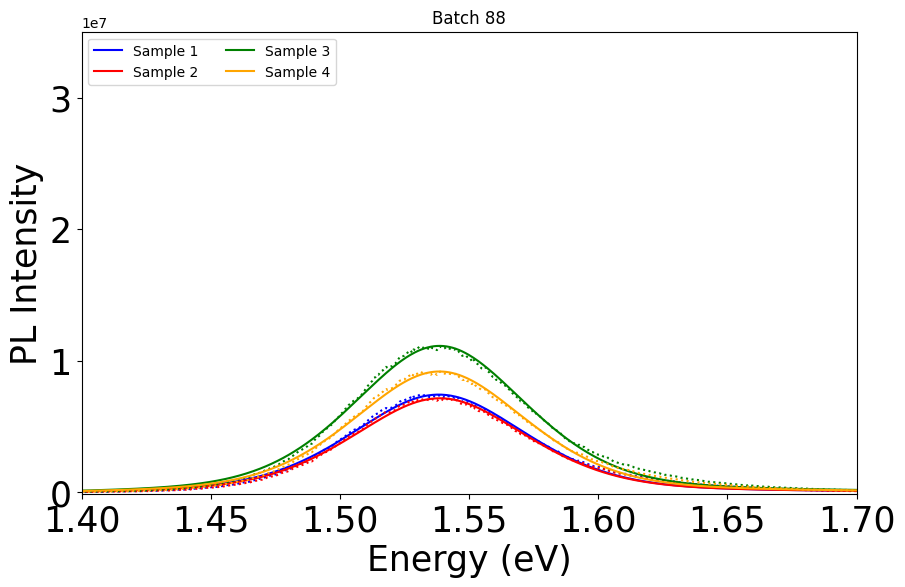

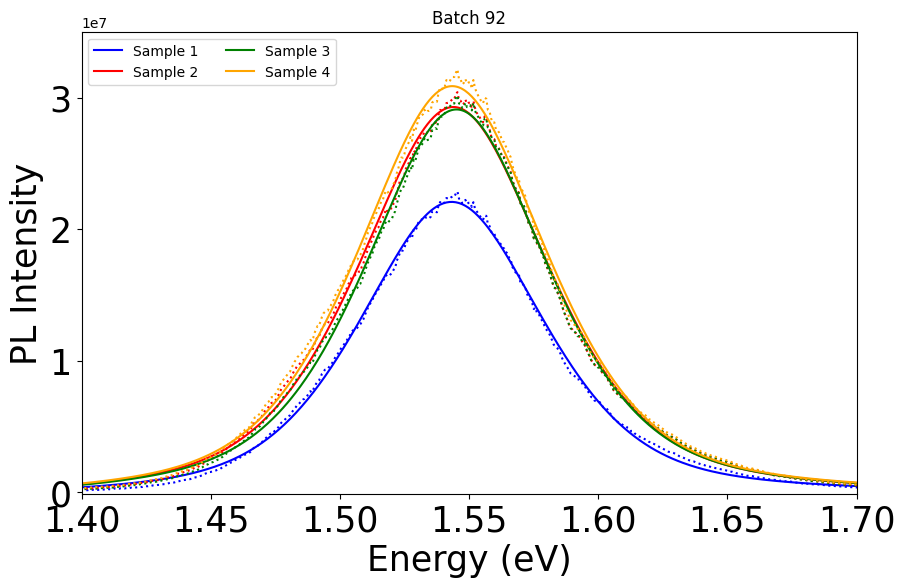

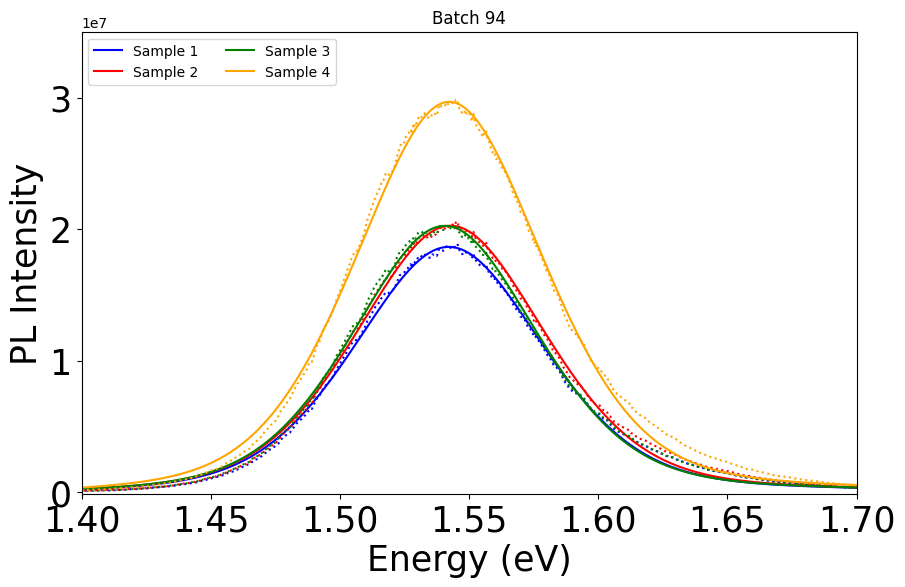

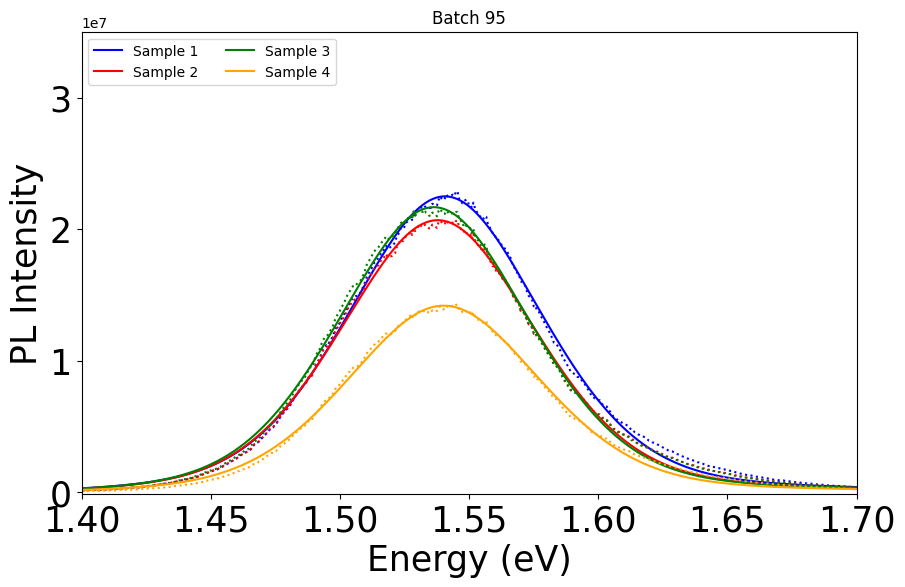

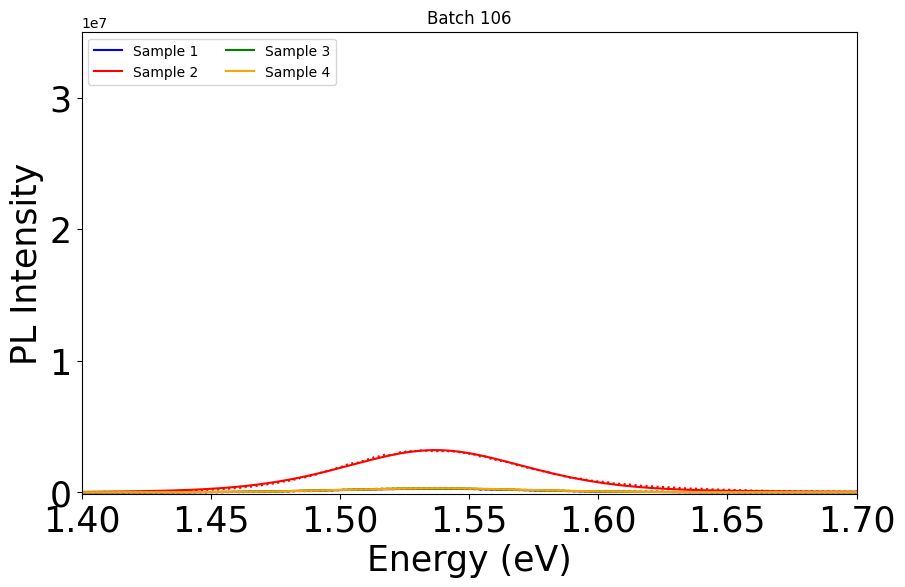

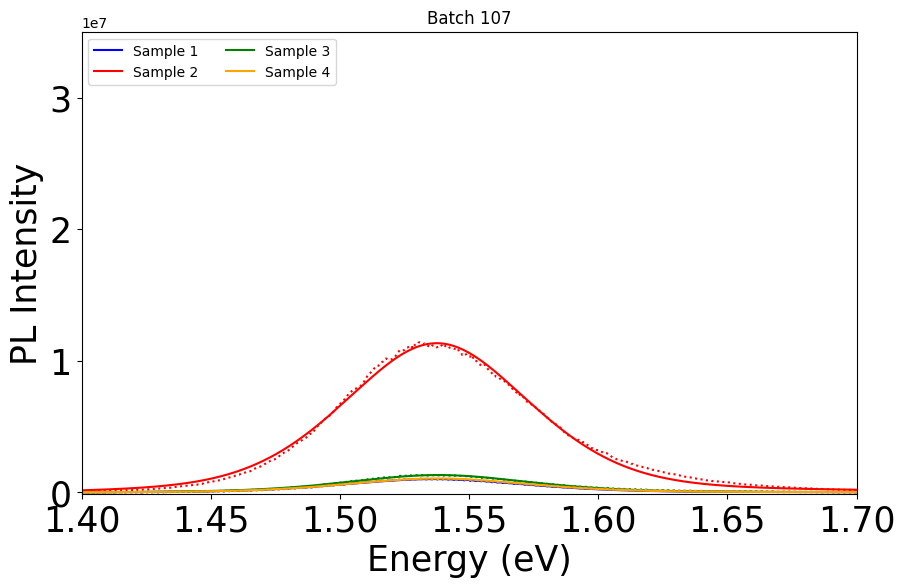

In [ ]:
from lmfit.models import LinearModel, PseudoVoigtModel
import matplotlib.pyplot as plt
import numpy as np
import h5py

# Set label size for plots
label_size = 25
colors = ['blue', 'red', 'green', 'orange']

batches = [74, 80, 88, 92, 94, 95, 106, 107]  # Example batch numbers
# colors = ['red', 'orange', 'olive', 'green', 'teal', 'black', 'darkviolet', 'dodgerblue']

# Loop over each batch
for b in batches:
    batch = df[df['Batch No.'] == b]
    num_samples = len(batch)

    # Create a figure for the current batch
    plt.figure(figsize=(10, 6))

    # Loop over each sample in the batch
    for s in range(1, num_samples + 1):
        sample = batch[batch['Sample #'] == str(s)]
        file_path = get_spec_run_filepath(sample)
        if not file_path:
            continue

        with h5py.File(file_path, 'r') as hf:
            dark_int_time = hf['measurement/spec_run/pl_dark_int_time'][()]
            dark_spectrum = hf['measurement/spec_run/pl_dark_spectrum'][:]
            spec_int_times = hf['measurement/spec_run/pl_spectra_int_times'][:]
            spectra = hf['measurement/spec_run/pl_spectra'][:]
            wls = hf['measurement/spec_run/pl_wls'][:]

            # Initialize an array to hold the averaged spectrum
            combined_spectra = np.zeros_like(spectra[0])

            # Loop through all positions (1 to 8 or less) and accumulate the spectra
            for i in range(spectra.shape[0]):
                time_normalized = np.divide(spectra[i], spec_int_times[i]) - np.divide(dark_spectrum, dark_int_time)
                combined_spectra += time_normalized

            # Average the combined spectra across all positions
            combined_spectra /= spectra.shape[0]

            # Define wavelength range for analysis
            lowQ_idx = find_nearest(wls, 650)
            highQ_idx = find_nearest(wls, 950)

            x = wls[lowQ_idx:highQ_idx]
            y = combined_spectra[lowQ_idx:highQ_idx]

            # Convert wavelength to energy and apply Jacobian transformation
            energies = wavelength_to_energy(x)
            transformed_signal = apply_jacobian(y, x)

            # Fit background and peaks
            bkg = LinearModel()
            pars = bkg.guess(transformed_signal, x=energies)

            peak1 = PseudoVoigtModel(prefix='p1_')
            pars.update(peak1.make_params(center=1.55, sigma=.1, amplitude=max(combined_spectra) / 5))
            pars['p1_center'].min = 1.4
            pars['p1_center'].max = 1.7

            mod = bkg + peak1
            out = mod.fit(transformed_signal, pars, x=energies)

            # Plot the transformed signal and the fitted model
            color = colors[(s-1) % len(colors)]  # Use modulo to loop through colors
            plt.plot(energies, transformed_signal, ':', color=color)
            plt.plot(energies, out.best_fit, '-', color=color, label=f'Sample {s}')

    # Set plot limits, labels, and title for the batch
    plt.xlim(1.4, 1.7)
    plt.ylim(-100000, 3.5*10**7)

    plt.xlabel('Energy (eV)', fontsize=label_size)
    plt.ylabel('PL Intensity (counts/sec)', fontsize=label_size)
    plt.legend(loc='upper left', ncol=2)
    plt.tick_params(axis='both', which='major', labelsize=label_size)

    # Show the plot for the current batch
    plt.title(f'Batch {b}')
    plt.show()


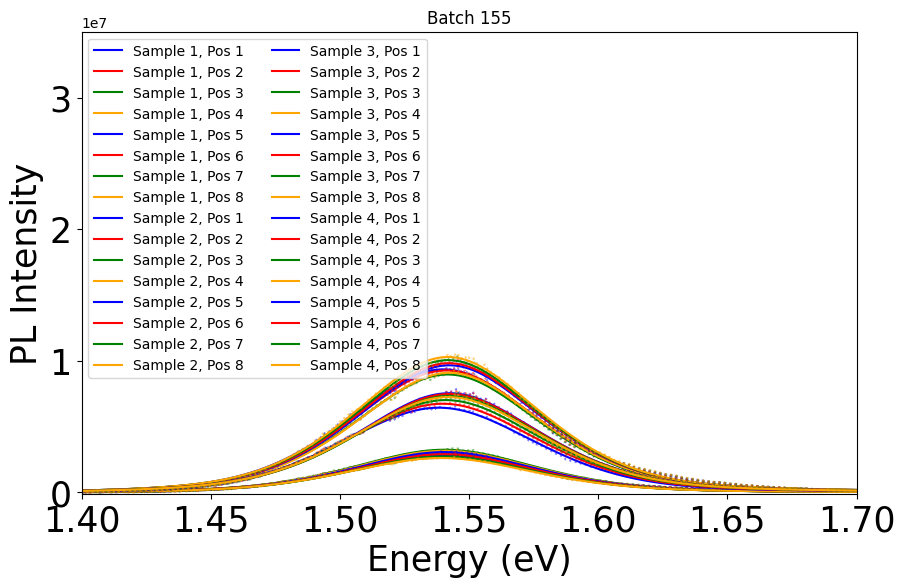

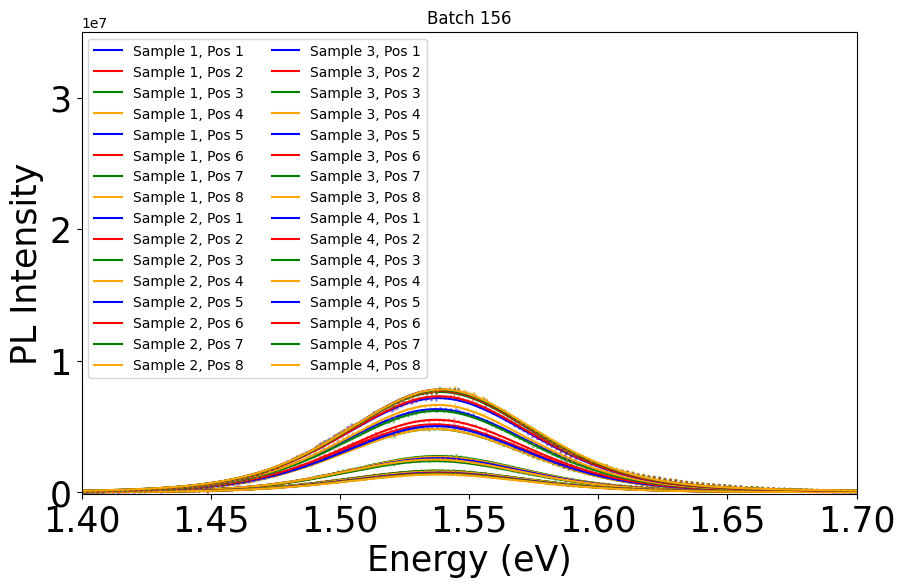

In [ ]:
from lmfit.models import LinearModel, PseudoVoigtModel
import matplotlib.pyplot as plt
import numpy as np
import h5py

# Set label size for plots
label_size = 25
colors = ['blue', 'red', 'green', 'orange']

batches = [155, 156]  # Example batch numbers

# Loop over each batch
for b in batches:
    batch = df[df['Batch No.'] == b]
    num_samples = len(batch)

    # Create a figure for the current batch
    plt.figure(figsize=(10, 6))

    # Loop over each sample in the batch
    for s in range(1, num_samples + 1):
        sample = batch[batch['Sample #'] == str(s)]
        file_path = get_spec_run_filepath(sample)
        if not file_path:
            continue

        with h5py.File(file_path, 'r') as hf:
            dark_int_time = hf['measurement/spec_run/pl_dark_int_time'][()]
            dark_spectrum = hf['measurement/spec_run/pl_dark_spectrum'][:]
            spec_int_times = hf['measurement/spec_run/pl_spectra_int_times'][:]
            spectra = hf['measurement/spec_run/pl_spectra'][:]
            wls = hf['measurement/spec_run/pl_wls'][:]

            # Loop through all positions to plot each spectrum
            for i in range(spectra.shape[0]):  # spectra.shape[0] should be 8 for 8 positions if consistent
                time_normalized = np.divide(spectra[i], spec_int_times[i]) - np.divide(dark_spectrum, dark_int_time)

                # Define wavelength range for analysis
                lowQ_idx = find_nearest(wls, 650)
                highQ_idx = find_nearest(wls, 950)

                x = wls[lowQ_idx:highQ_idx]
                y = time_normalized[lowQ_idx:highQ_idx]

                # Convert wavelength to energy and apply Jacobian transformation
                energies = wavelength_to_energy(x)
                transformed_signal = apply_jacobian(y, x)

                # Fit background and peaks
                bkg = LinearModel()
                pars = bkg.guess(transformed_signal, x=energies)

                peak1 = PseudoVoigtModel(prefix='p1_')
                pars.update(peak1.make_params(center=1.55, sigma=.1, amplitude=max(transformed_signal) / 5))
                pars['p1_center'].min = 1.4
                pars['p1_center'].max = 1.7

                mod = bkg + peak1
                out = mod.fit(transformed_signal, pars, x=energies)

                # Plot the transformed signal and fitted model for each position
                color = colors[i % len(colors)]  # Use modulo to loop through colors for each spectrum
                plt.plot(energies, transformed_signal, ':', color=color, alpha=0.5)  # Plot for each spectrum
                plt.plot(energies, out.best_fit, '-', color=color, label=f'Sample {s}, Pos {i+1}')

    # Set plot limits, labels, and title for the batch
    plt.xlim(1.4, 1.7)
    plt.ylim(-100000, 3.5 * 10**7)

    plt.xlabel('Energy (eV)', fontsize=label_size)
    plt.ylabel('PL Intensity', fontsize=label_size)
    plt.legend(loc='upper left', ncol=2)
    plt.tick_params(axis='both', which='major', labelsize=label_size)

    # Show the plot for the current batch
    plt.title(f'Batch {b}')
    plt.show()

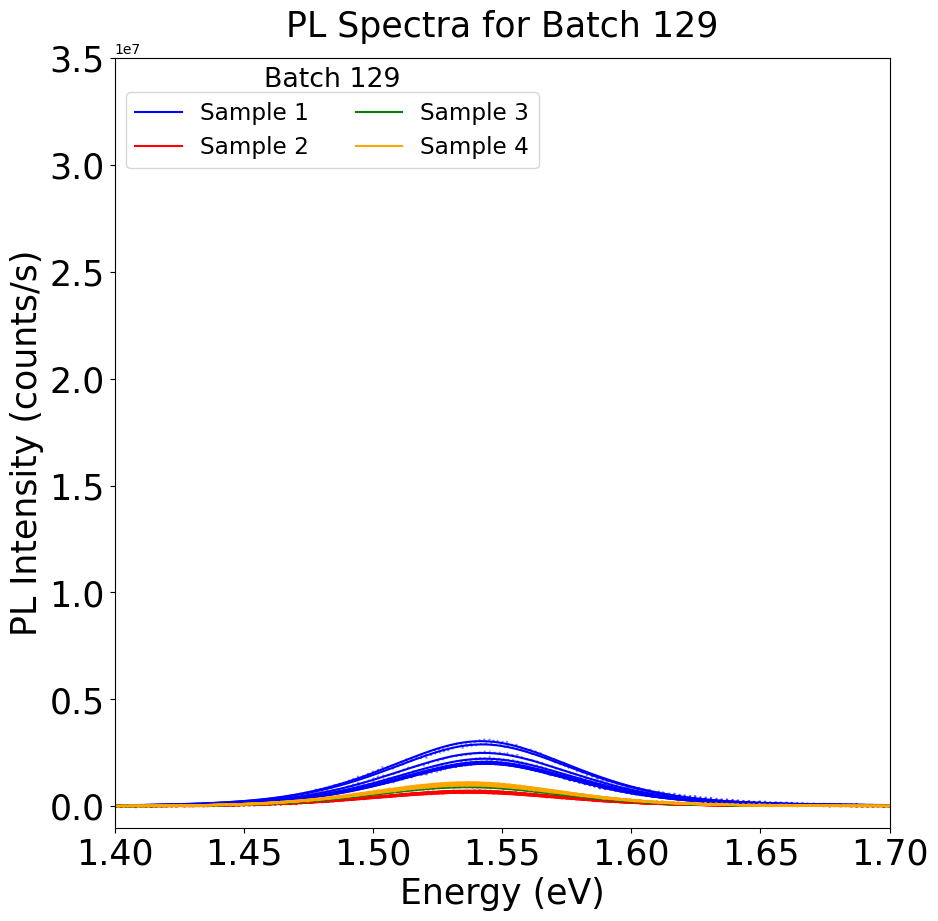

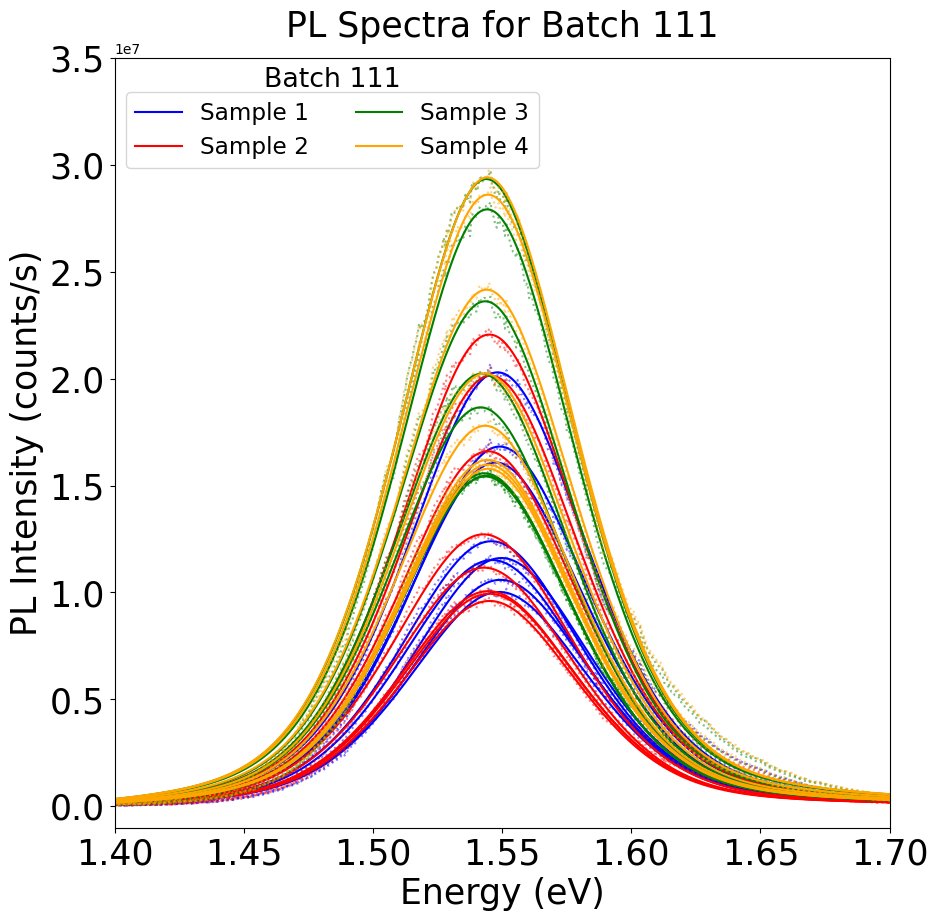

In [ ]:
from lmfit.models import LinearModel, PseudoVoigtModel
import matplotlib.pyplot as plt
import numpy as np
import h5py

# Set label size for plots
label_size = 25
colors = ['blue', 'red', 'green', 'orange']

# batches = [74, 80, 88, 92, 94, 95, 106, 107]  # Example batch numbers
batches = [129, 111]  # Example batch numbers
# Loop over each batch
for b in batches:
    # Create a new figure for each batch
    plt.figure(figsize=(10, 10))
    batch = df[df['Batch No.'] == b]
    unique_samples = sorted(batch['Sample #'].unique(), key=lambda x: int(x))
    color_index = 0

    for s in unique_samples:
        sample = batch[batch['Sample #'] == s]
        file_path = get_spec_run_filepath(sample)
        if not file_path:
            continue

        with h5py.File(file_path, 'r') as hf:
            dark_int_time = hf['measurement/spec_run/pl_dark_int_time'][()]
            dark_spectrum = hf['measurement/spec_run/pl_dark_spectrum'][:]
            spec_int_times = hf['measurement/spec_run/pl_spectra_int_times'][:]
            spectra = hf['measurement/spec_run/pl_spectra'][:]
            wls = hf['measurement/spec_run/pl_wls'][:]

            # Loop through all positions (should be 8) and accumulate the spectra
            for i in range(spectra.shape[0]):
                time_normalized = np.divide(spectra[i], spec_int_times[i]) - np.divide(dark_spectrum, dark_int_time)

                # Define wavelength range for analysis
                lowQ_idx = find_nearest(wls, 650)
                highQ_idx = find_nearest(wls, 950)

                x = wls[lowQ_idx:highQ_idx]
                y = time_normalized[lowQ_idx:highQ_idx]

                # Convert wavelength to energy and apply Jacobian transformation
                energies = wavelength_to_energy(x)
                transformed_signal = apply_jacobian(y, x)

                # Fit background and peaks
                bkg = LinearModel()
                pars = bkg.guess(transformed_signal, x=energies)
                peak1 = PseudoVoigtModel(prefix='p1_')
                pars.update(peak1.make_params(center=1.55, sigma=.1, amplitude=max(transformed_signal) / 5))
                pars['p1_center'].min = 1.4
                pars['p1_center'].max = 1.7
                mod = bkg + peak1
                out = mod.fit(transformed_signal, pars, x=energies)

                # Plot each sample's spectra
                color = colors[color_index % len(colors)]  # Use modulo to loop through colors

                # Only add the label to the first line scan of the sample
                if i == 0:
                    plt.plot(energies, transformed_signal, ':', color=color, alpha =0.5)  # First spectrum labeled
                    plt.plot(energies, out.best_fit, '-', color=color, label=f'Sample {s}')  # Fit curve
                else:
                    plt.plot(energies, transformed_signal, ':', color=color, alpha=0.5)  # Subsequent scans
                    plt.plot(energies, out.best_fit, '-', color=color)  # Fit curve


        color_index += 1  # Move to the next color for the next sample

    # Set axes limits, ticks, labels, and legend for this batch figure
    plt.xlim(1.4, 1.7)
    plt.ylim(-1000000, 3.5 * 10**7)
    plt.xlabel('Energy (eV)', fontsize=label_size)
    plt.ylabel('PL Intensity (counts/s)', fontsize=label_size)

    # Moving the legend slightly down from the upper left corner
    legend = plt.legend(loc='upper left', ncol=2, bbox_to_anchor=(0, 0.97),
                        handlelength=2, fontsize=label_size / 1.5)
    plt.tick_params(axis='both', which='major', labelsize=label_size)

    # Title and batch information
    plt.title(f'PL Spectra for Batch {b}', fontsize=label_size, pad=15)  # Adjust pad as needed

    # Place text above the legend using normalized coordinates
    if legend:
        # Get the legend's bounding box in figure coordinates
        bbox = legend.get_window_extent().transformed(plt.gca().transData.inverted())

        # Calculate text position based on the bounding box y1
        text_x = (bbox.x0 + bbox.x1) / 2  # Center horizontally
        text_y = bbox.y1 + 0.0025  # Slightly above the legend

        plt.text(text_x, text_y, f'Batch {b}',
                ha='center', va='bottom', transform=plt.gca().transData, fontsize=label_size / 1.3)

    plt.show()

In [ ]:
data_dir_XRD = "/content/drive/Shareddrives/SpinBot/PEROVSKITE reproducibility project/Data/XRD"

# define a function that grabs the XRD batch path
def get_xrd_batch_path(sample_row, sample_index):
    batch_num = list(sample_row['Batch No.'])[0]

    # Search for the batch directory
    batch_path = glob.glob(data_dir_XRD + f"/*/*Batch {batch_num}*")
    # print(batch_path)
    if not batch_path:
        return None

    # Search for JSON files within the batch directory
    json_files = sorted(glob.glob(os.path.join(batch_path[0], "Output_Data", "*.json")))

    # Select the JSON file based on the sample index
    if sample_index < len(json_files):
        return json_files[sample_index]
    else:
        return None




<Figure size 1000x1000 with 0 Axes>

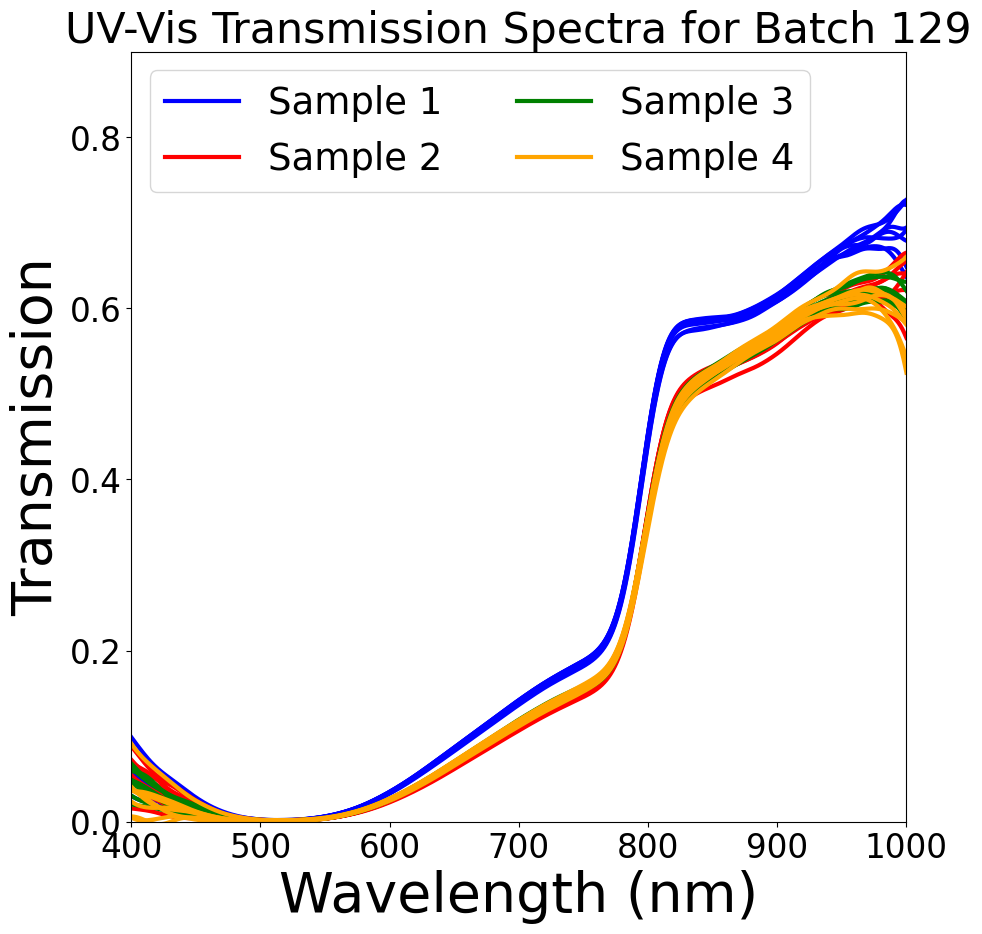

<Figure size 1000x1000 with 0 Axes>

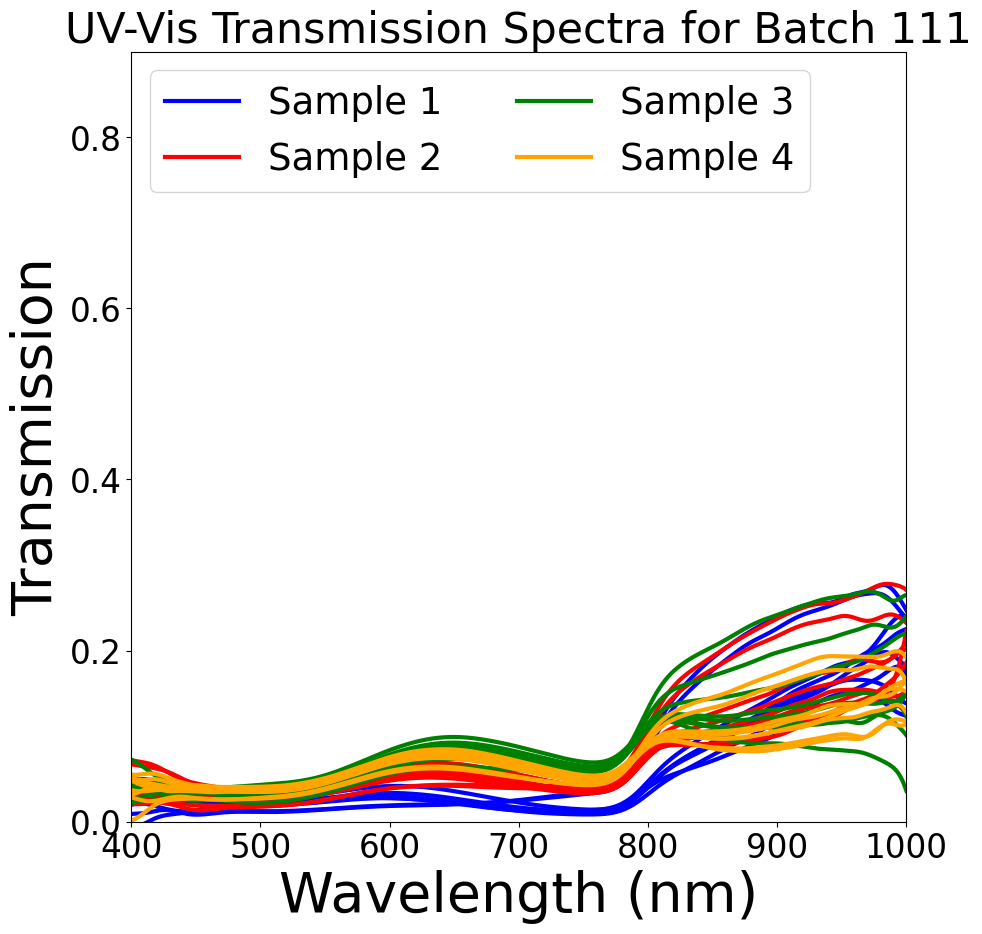

In [ ]:
import matplotlib.pyplot as plt
import numpy as np
from scipy.ndimage import gaussian_filter
import h5py
import pandas as pd

# Assuming df is your DataFrame and get_spec_run_filepath is your function

label_size = 40
sigma = 30  # Adjust sigma for different levels of smoothing

# Define a set of 4 distinct colors
colors = ['blue', 'red', 'green', 'orange']

batches = [129, 111]  # Example batch numbers
# batches = [134, 137]

for b in batches:
    # Create a new figure for each batch
    plt.figure(figsize=(10, 10))
    batch = df[df['Batch No.'] == b]
    unique_samples = sorted(batch['Sample #'].unique(), key=lambda x: int(x))
    color_index = 0
    plt.figure(figsize=(10, 10))
    for s in unique_samples:
        sample = batch[batch['Sample #'] == s]
        file_path = get_spec_run_filepath(sample)
        # print(sample)
        if not file_path:
            continue
        # print(file_path + " FILE")


        with h5py.File(file_path, 'r') as hf:
            photo = hf['measurement/spec_run/photo'][:]
            wl_dark_int_time = hf['measurement/spec_run/wl_dark_int_time'][()]
            wl_dark_spectrum = hf['measurement/spec_run/wl_dark_spectrum'][:]
            wl_samp_int_times = hf['measurement/spec_run/wl_spectra_int_times'][:]
            wl_samp_spectrum = hf['measurement/spec_run/wl_spectra'][:]
            wl_ref_int_time = hf['measurement/spec_run/wl_ref_int_time'][()]
            wl_ref_spectrum = hf['measurement/spec_run/wl_ref_spectrum'][:]
            wl_wave_axis = hf['measurement/spec_run/wl_wls'][:]
            settings_gr = hf['app/settings']
            sample_id = settings_gr.attrs['sample']

            # Correct the sample spectra by subtracting dark and normalizing by integration times
            sample_spectrum_corr = (wl_samp_spectrum / wl_samp_int_times[:, None]) - (wl_dark_spectrum / wl_dark_int_time)
            # Divide by the reference spectrum (corrected for dark)
            sample_spectrum_corr /= (wl_ref_spectrum / wl_ref_int_time - wl_dark_spectrum / wl_dark_int_time)

            # Plot the 8 individual line scans for this sample in the same color
            # Add a legend entry only once per sample
            legend_label = f'Sample {s}'
            # for i, scan in enumerate(sample_spectrum_corr):
            for i, scan in enumerate(sample_spectrum_corr):
                smoothed_spectrum = gaussian_filter(scan, sigma=sigma)
                # absorption = -np.log10(smoothed_spectrum)
                # smoothed_spectrum = scan

                # Only add the label to the first line scan of the sample
                if i == 0:
                    plt.plot(wl_wave_axis, smoothed_spectrum, linewidth=3, label=legend_label, color=colors[color_index])
                else:
                    plt.plot(wl_wave_axis, smoothed_spectrum, linewidth=3, color=colors[color_index])
                # if i == 0:
                #     plt.plot(wl_wave_axis, absorption, linewidth=3, label=legend_label, color=colors[color_index])
                # else:
                #     plt.plot(wl_wave_axis, absorption, linewidth=3, color=colors[color_index])

        color_index = (color_index + 1) % len(colors)  # Move to the next color for the next sample

    # # Set axes limits, ticks, labels, and legend for this batch figure
    # plt.xlim(400, 1000)
    # plt.xticks([400, 500, 600, 700, 800, 900, 1000])
    # plt.ylim(0, 0.9)
    # plt.yticks([0, 0.2, 0.4, 0.6, 0.8])
    # plt.xlabel('Wavelength (nm)', fontsize=label_size)
    # plt.ylabel('Transmission', fontsize=label_size)
    # legend = plt.legend(loc='upper left', ncol=2)
    # plt.tick_params(axis='both', which='major', labelsize=label_size)



    # # Show or save the figure for this batch
    # plt.title(f'UV-Vis Transmission Spectra for Batch {b}', fontsize=label_size)

    # if legend:
    #   # Get the legend's bounding box in figure coordinates
    #   bbox = legend.get_window_extent().transformed(plt.gca().transData.inverted())

    #   # Calculate text position based on the bounding box y1
    #   text_x = (bbox.x0 + bbox.x1) / 2  # Center horizontally
    #   text_y = bbox.y1 - 0.08  # Slightly above the legend

    #   plt.text(text_x, text_y, f'Batch {b}',
    #           ha='center', va='bottom', transform=plt.gca().transData, fontsize=label_size/2)
    # plt.show()
    # Set axes limits, ticks, labels, and legend for this batch figure
    plt.xlim(400, 1000)
    plt.xticks([400, 500, 600, 700, 800, 900, 1000])
    plt.ylim(0, 0.9)
    plt.yticks([0, 0.2, 0.4, 0.6, 0.8])
    # plt.ylim(-0.25, 6)
    # plt.yticks([0, 1, 2, 3, 4, 5, 6])

    plt.xlabel('Wavelength (nm)', fontsize=label_size)
    plt.ylabel('Transmission', fontsize=label_size)
    # plt.ylabel('Absorbance', fontsize=label_size)

    # Moving the legend slightly down from the upper left corner
    legend = plt.legend(loc='upper left', ncol=2, bbox_to_anchor=(0, 1),
                        handlelength=2, fontsize=label_size/1.5)
    plt.tick_params(axis='both', which='major', labelsize=label_size/1.7)

    # Show or save the figure for this batch
    plt.title(f'UV-Vis Transmission Spectra for Batch {b}', fontsize=label_size/1.3)

    # plt.title(f'UV-Vis Absorbance Spectra for Batch {b}', fontsize=label_size, pad=15)  # Adjust pad as needed

    # Place text above the legend using normalized coordinates
    # if legend:
    #     # Get the legend's bounding box in figure coordinates
    #     bbox = legend.get_window_extent().transformed(plt.gca().transData.inverted())

    #     # Calculate text position based on the bounding box y1
    #     text_x = (bbox.x0 + bbox.x1) / 2  # Center horizontally
    #     text_y = bbox.y1 + 0.0025 # Slightly above the legend

    #     plt.text(text_x, text_y, f'Batch {b}',
    #             ha='center', va='bottom', transform=plt.gca().transData, fontsize=label_size/1.5)
    plt.show()


<Figure size 1000x1000 with 0 Axes>

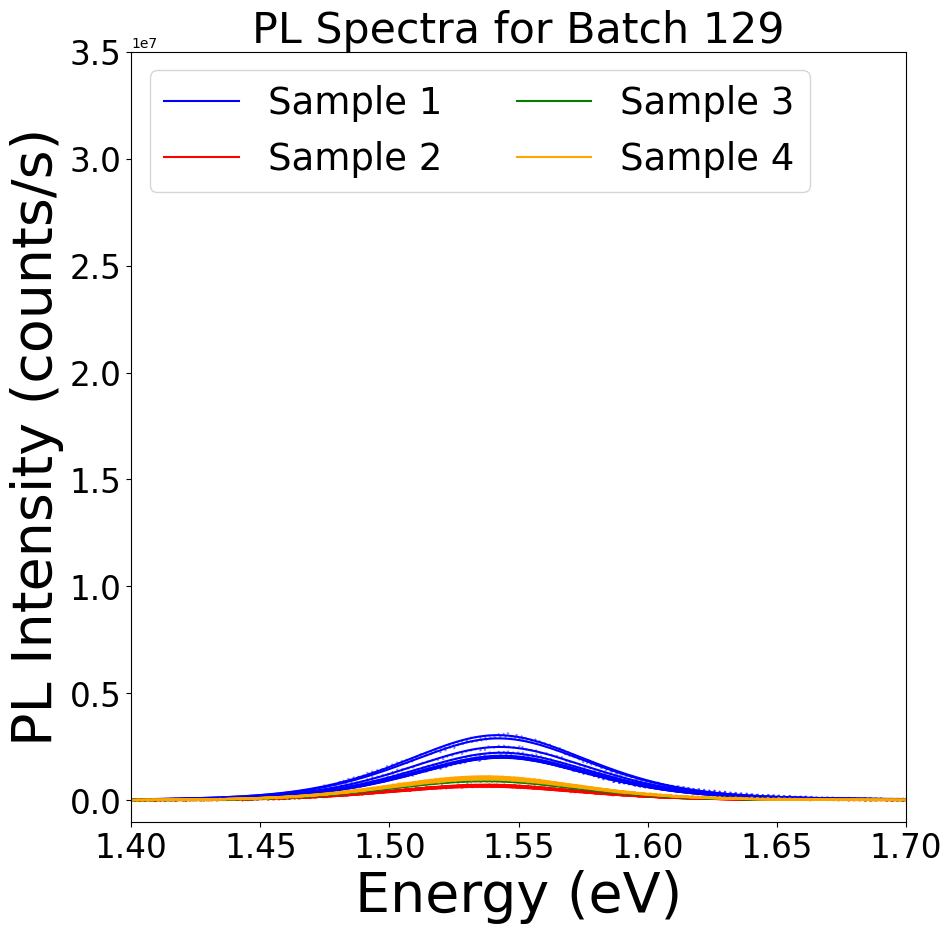

<Figure size 1000x1000 with 0 Axes>

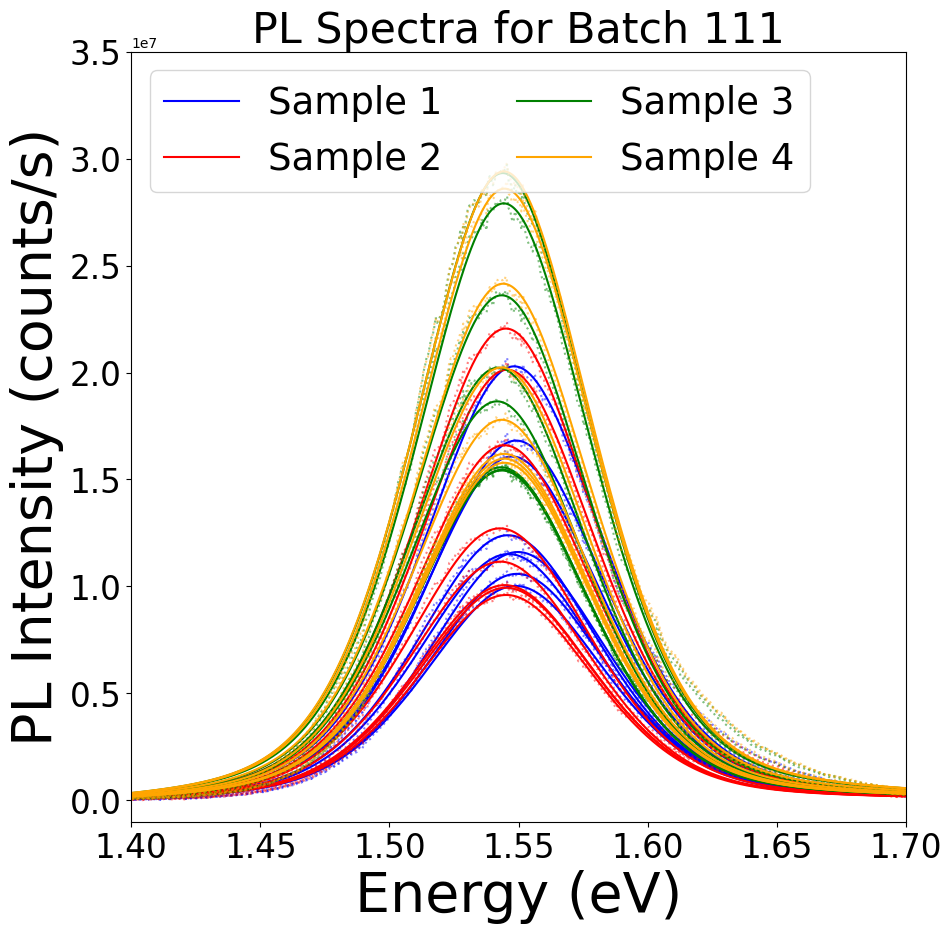

In [ ]:
from lmfit.models import LinearModel, PseudoVoigtModel
import matplotlib.pyplot as plt
import numpy as np
import h5py

# Set label size for plots
label_size = 40
colors = ['blue', 'red', 'green', 'orange']

# batches = [74, 80, 88, 92, 94, 95, 106, 107]  # Example batch numbers
batches = [129, 111]  # Example batch numbers
# Loop over each batch
for b in batches:
    # Create a new figure for each batch
    plt.figure(figsize=(10, 10))
    batch = df[df['Batch No.'] == b]
    unique_samples = sorted(batch['Sample #'].unique(), key=lambda x: int(x))
    color_index = 0
    plt.figure(figsize=(10, 10))

    for s in unique_samples:
        sample = batch[batch['Sample #'] == s]
        file_path = get_spec_run_filepath(sample)
        if not file_path:
            continue

        with h5py.File(file_path, 'r') as hf:
            dark_int_time = hf['measurement/spec_run/pl_dark_int_time'][()]
            dark_spectrum = hf['measurement/spec_run/pl_dark_spectrum'][:]
            spec_int_times = hf['measurement/spec_run/pl_spectra_int_times'][:]
            spectra = hf['measurement/spec_run/pl_spectra'][:]
            wls = hf['measurement/spec_run/pl_wls'][:]

            # Loop through all positions (should be 8) and accumulate the spectra
            for i in range(spectra.shape[0]):
                time_normalized = np.divide(spectra[i], spec_int_times[i]) - np.divide(dark_spectrum, dark_int_time)

                # Define wavelength range for analysis
                lowQ_idx = find_nearest(wls, 650)
                highQ_idx = find_nearest(wls, 950)

                x = wls[lowQ_idx:highQ_idx]
                y = time_normalized[lowQ_idx:highQ_idx]

                # Convert wavelength to energy and apply Jacobian transformation
                energies = wavelength_to_energy(x)
                transformed_signal = apply_jacobian(y, x)

                # Fit background and peaks
                bkg = LinearModel()
                pars = bkg.guess(transformed_signal, x=energies)
                peak1 = PseudoVoigtModel(prefix='p1_')
                pars.update(peak1.make_params(center=1.55, sigma=.1, amplitude=max(transformed_signal) / 5))
                pars['p1_center'].min = 1.4
                pars['p1_center'].max = 1.7
                mod = bkg + peak1
                out = mod.fit(transformed_signal, pars, x=energies)

                # Plot each sample's spectra
                color = colors[color_index % len(colors)]  # Use modulo to loop through colors

                # Only add the label to the first line scan of the sample
                if i == 0:
                    plt.plot(energies, transformed_signal, ':', color=color, alpha =0.5)  # First spectrum labeled
                    plt.plot(energies, out.best_fit, '-', color=color, label=f'Sample {s}')  # Fit curve
                else:
                    plt.plot(energies, transformed_signal, ':', color=color, alpha=0.5)  # Subsequent scans
                    plt.plot(energies, out.best_fit, '-', color=color)  # Fit curve


        color_index += 1  # Move to the next color for the next sample

    # Set axes limits, ticks, labels, and legend for this batch figure
    plt.xlim(1.4, 1.7)
    plt.ylim(-1000000, 3.5 * 10**7)
    plt.xlabel('Energy (eV)', fontsize=label_size)
    plt.ylabel('PL Intensity (counts/s)', fontsize=label_size)

    # Moving the legend slightly down from the upper left corner
    legend = plt.legend(loc='upper left', ncol=2, bbox_to_anchor=(0, 1),
                        handlelength=2, fontsize=label_size/1.5)
    plt.tick_params(axis='both', which='major', labelsize=label_size/1.7)

    # Title and batch information
    plt.title(f'PL Spectra for Batch {b}', fontsize=label_size/1.3)  # Adjust pad as needed

    # # Place text above the legend using normalized coordinates
    # if legend:
    #     # Get the legend's bounding box in figure coordinates
    #     bbox = legend.get_window_extent().transformed(plt.gca().transData.inverted())

    #     # Calculate text position based on the bounding box y1
    #     text_x = (bbox.x0 + bbox.x1) / 2  # Center horizontally
    #     text_y = bbox.y1 + 0.0025  # Slightly above the legend

    #     plt.text(text_x, text_y, f'Batch {b}',
    #             ha='center', va='bottom', transform=plt.gca().transData, fontsize=label_size / 1.3)

    plt.show()

Batch 135, Sample 3:
Estimated bandgap (from Tauc plot) = 1.517 eV


<Figure size 1000x1000 with 0 Axes>

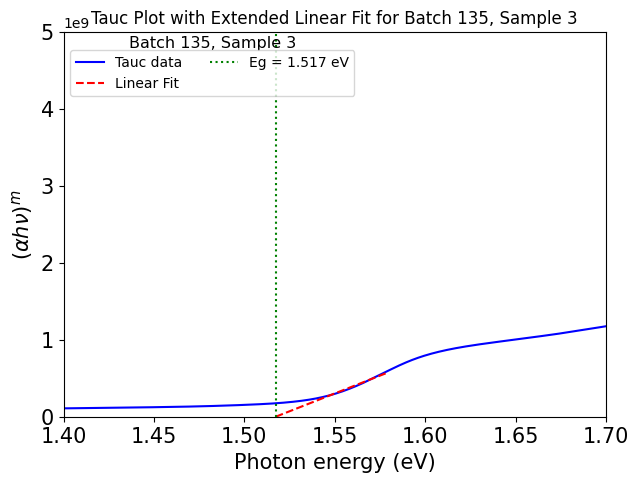

Batch 74, Sample 3:
Estimated bandgap (from Tauc plot) = 1.493 eV


<Figure size 1000x1000 with 0 Axes>

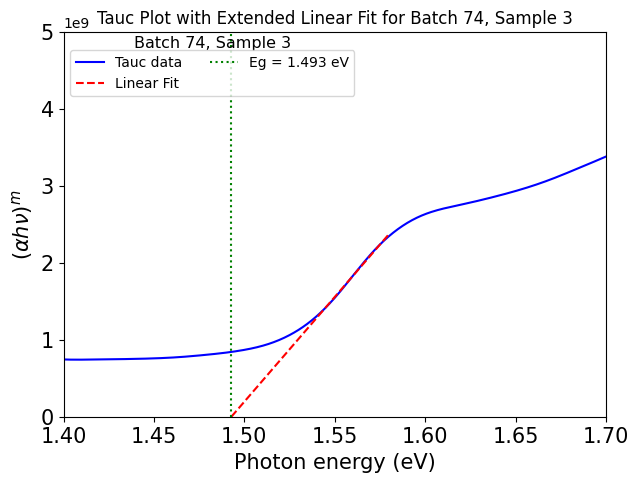

Batch 106, Sample 3:
Estimated bandgap (from Tauc plot) = 1.506 eV


<Figure size 1000x1000 with 0 Axes>

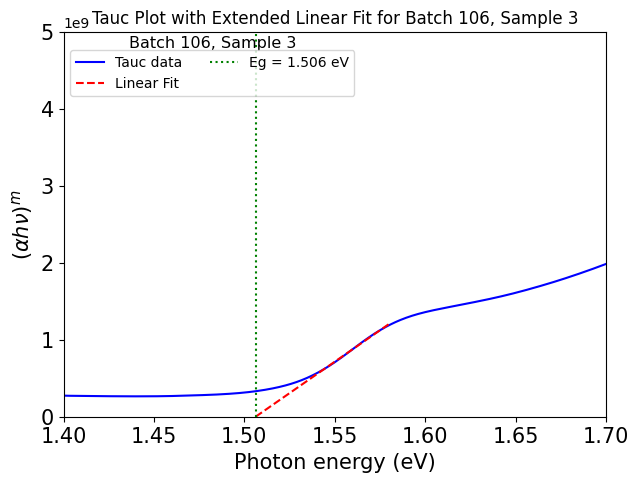

Batch 80, Sample 3:
Estimated bandgap (from Tauc plot) = 1.521 eV


<Figure size 1000x1000 with 0 Axes>

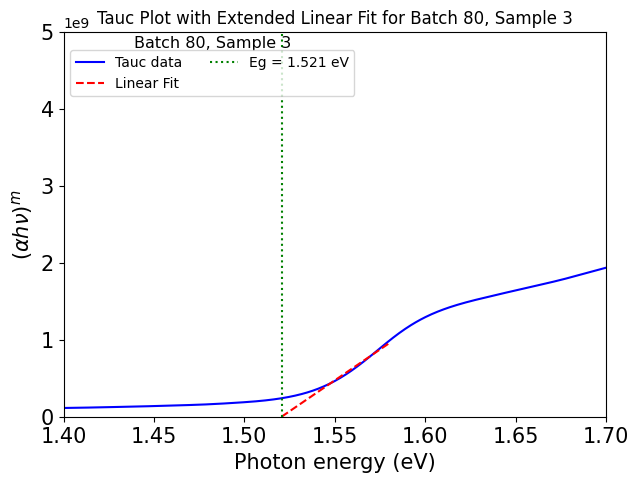

Batch 119, Sample 3:
Estimated bandgap (from Tauc plot) = 1.488 eV


<Figure size 1000x1000 with 0 Axes>

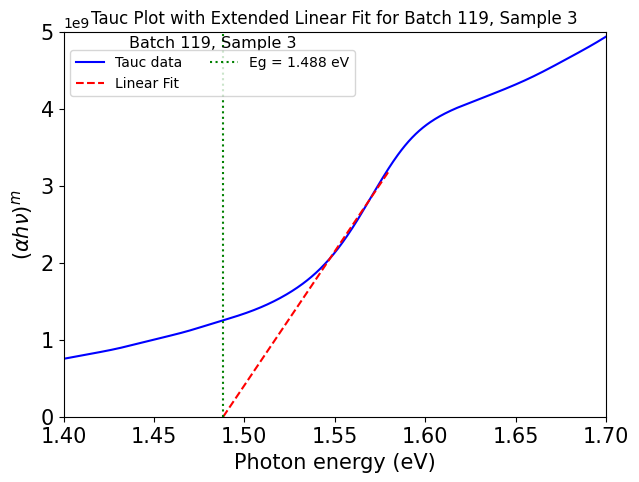

Batch 88, Sample 3:
Estimated bandgap (from Tauc plot) = 1.499 eV


<Figure size 1000x1000 with 0 Axes>

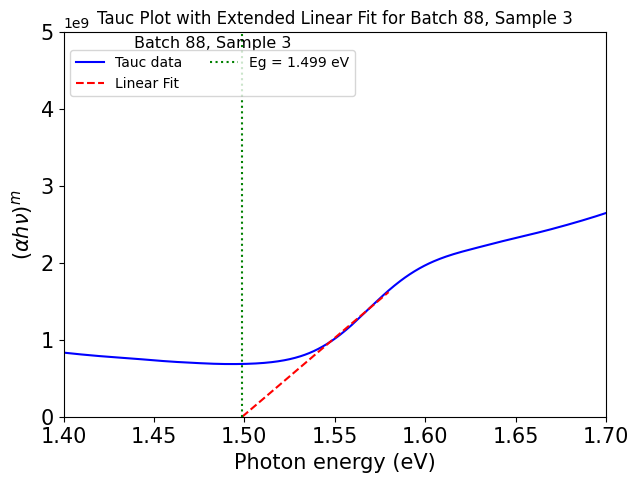

Batch 92, Sample 3:
Estimated bandgap (from Tauc plot) = 1.525 eV


<Figure size 1000x1000 with 0 Axes>

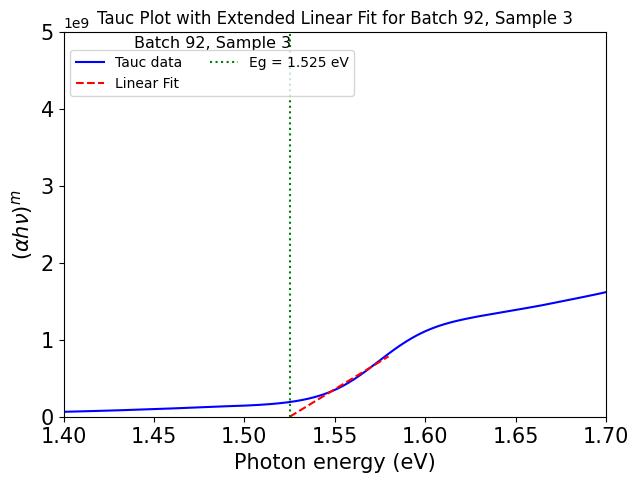

Batch 94, Sample 3:
Estimated bandgap (from Tauc plot) = 1.437 eV


<Figure size 1000x1000 with 0 Axes>

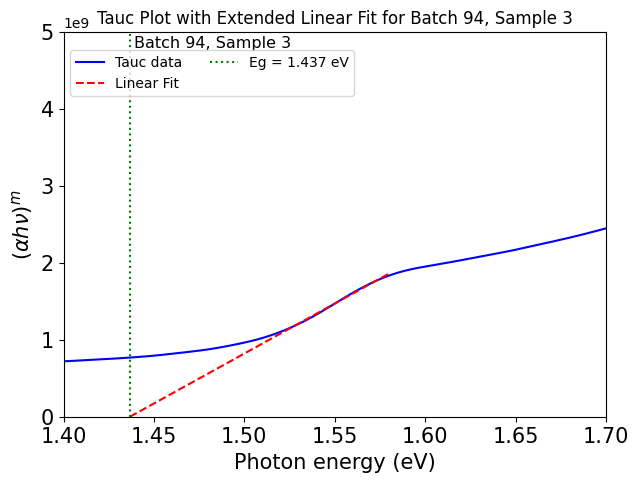

In [ ]:
sigma = 15  # Adjust sigma for different levels of smoothing

# Batch Number
# b = 74
label_size = 15

for b in {74, 80, 88, 92, 94, 106, 119, 135}:
  batch = df[df['Batch No.'] == b]
  plt.figure(figsize=(10, 10))


  # Sample Number
  s = 3

  sample = batch[batch['Sample #'] == str(s)]

  print(f"Batch {b}, Sample {s}:")

  file_path = get_spec_run_filepath(sample)


  with h5py.File(file_path, 'r') as hf:

    photo = hf['measurement/spec_run/photo'][:]
    wl_dark_int_time = hf['measurement/spec_run/wl_dark_int_time'][()]
    wl_dark_spectrum = hf['measurement/spec_run/wl_dark_spectrum'][:]
    wl_samp_int_times = hf['measurement/spec_run/wl_spectra_int_times'][:]
    wl_samp_spectrum = hf['measurement/spec_run/wl_spectra'][:]
    wl_ref_int_time = hf['measurement/spec_run/wl_ref_int_time'][()]
    wl_ref_spectrum = hf['measurement/spec_run/wl_ref_spectrum'][:]
    wl_wave_axis = hf['measurement/spec_run/wl_wls'][:]
    settings_gr = hf['app/settings']
    sample_id = settings_gr.attrs['sample']


  # print("File data has been read successfully.")
  sample_spectrum_corr = wl_samp_spectrum/wl_samp_int_times.reshape((8,1)) - wl_dark_spectrum/wl_dark_int_time
  sample_spectrum_corr_mean = np.mean(sample_spectrum_corr, axis=0) #Average individual spectra per sample
  sample_spectrum_final = sample_spectrum_corr_mean / (wl_ref_spectrum/wl_ref_int_time - wl_dark_spectrum/wl_dark_int_time) #Divide by the reference

  # Transmission calculation
  sample_spectrum_corr = (wl_samp_spectrum / wl_samp_int_times.reshape((8,1))) - (wl_dark_spectrum / wl_dark_int_time)
  sample_spectrum_corr_mean = np.mean(sample_spectrum_corr, axis=0)
  denominator = (wl_ref_spectrum / wl_ref_int_time) - (wl_dark_spectrum / wl_dark_int_time)
  sample_spectrum_final = sample_spectrum_corr_mean / denominator

  # Smooth the final transmission spectrum
  smoothed_spectrum = gaussian_filter(sample_spectrum_final, sigma=sigma)

  # ------------------------------------------------------------------------
  # 2) Convert Transmission T(λ) to Absorption Coefficient α(λ).
  #    Make sure you have the sample thickness d in *cm*.
  #    (Use the actual thickness of your sample below.)
  # ------------------------------------------------------------------------
  d_cm = 0.00007  # Example: 0.01 cm = 100 µm sample thickness, CHANGE THIS
  T_lambda = smoothed_spectrum

  # Avoid log of zero or negative
  # you might want to clip T to a small positive number:
  T_clipped = np.clip(T_lambda, 1e-10, 1)

  alpha_lambda = -1.0 / d_cm * np.log(T_clipped)

  # ------------------------------------------------------------------------
  # 3) Convert wavelength λ (nm) to photon energy hν (eV).
  # ------------------------------------------------------------------------
  # hv in eV, using 1240 eV·nm ≈ (planck's constant * c) for convenience
  hv = 1240.0 / wl_wave_axis  # in eV

  # ------------------------------------------------------------------------
  # 4) Choose Tauc exponent n:
  #    For a direct band gap, n=2; for indirect, n=1/2 (0.5).
  # ------------------------------------------------------------------------
  n = 2.0  # Example: direct gap

  y_tauc = (alpha_lambda * hv)**n

  # ------------------------------------------------------------------------
  # 5) Plot Tauc: (α hν)^n vs. hν
  # ------------------------------------------------------------------------
  # plt.figure(figsize=(8,6))
  # plt.plot(hv, y_tauc, label=f'Batch {b}, Sample {s}')

  # plt.xlabel(r'$h\nu$ (eV)', fontsize=14)
  # plt.ylabel(r'$(\alpha h\nu)^n$ (arb. units)', fontsize=14)
  # plt.title('Tauc Plot', fontsize=16)
  # # plt.ylim(0,1.5*10**9)
  # # plt.xlim(1.4,1.7)
  # plt.legend()

  # plt.show()


  # Suppose these are your Tauc-plot arrays:
  #   energy_eV: shape (N,) in ascending order
  #   tauc_y: shape (N,)

  # 1. Pick linear region by eyeballing the Tauc plot
  Emin = 1.54  # eV (example lower bound)
  Emax = 1.58  # eV (example upper bound)

  # 2. Mask or slice the data
  mask = (hv >= Emin) & (hv <= Emax)
  E_linear = hv[mask]
  y_linear = y_tauc[mask]

  # 3. Perform a linear fit: y = a*x + b
  # np.polyfit returns [a, b] for a 1st-degree polynomial
  a, b_ = np.polyfit(E_linear, y_linear, 1)

  # 4. Extrapolate to find the x-intercept => Tauc bandgap
  # 0 = a * Eg + b => Eg = -b / a
  Eg = -b_ / a
  print("Estimated bandgap (from Tauc plot) = {:.3f} eV".format(Eg))

  # Step 1: Make a fine array of energies from the lower bound to Eg
  # We’ll handle the possibility that Eg might be outside the linear region:
  line_x_min = min(E_linear.min(), Eg)  # so we definitely cover Eg in our domain
  line_x_max = max(E_linear.max(), Eg)

  # If Eg < E_linear.min(), we’ll go from Eg to E_linear.max().
  # If Eg > E_linear.max(), we’ll go from E_linear.min() to Eg.

  num_points = 100  # how many points in the line
  fit_x = np.linspace(line_x_min, line_x_max, num_points)

  # Step 2: Evaluate the linear fit: y = a*x + b
  fit_y = a * fit_x + b_

  # # Step 3: Plot
  # plt.figure(figsize=(7,5))
  # plt.plot(hv, y_tauc, 'b', label='Tauc data')    # raw Tauc data
  # plt.plot(fit_x, fit_y, 'r--', label='Linear Fit')      # linear fit line

  # # Draw a vertical line at Eg
  # plt.axvline(Eg, color='g', linestyle=':', label=f'Eg = {Eg:.3f} eV')



  # plt.xlim([hv.min(), hv.max()])
  # plt.ylim([0, 1.1 * y_tauc.max()])  # or adjust as needed
  # # plt.ylim(0,3*10**10)
  # plt.xlabel('Photon energy (eV)')
  # plt.ylabel(r'$(\alpha h\nu)^m$')
  # plt.title('Tauc Plot with Extended Linear Fit')
  # plt.legend()
  # plt.show()


  plt.figure(figsize=(7,5))
  plt.plot(hv, y_tauc, 'b', label='Tauc data')    # raw Tauc data
  plt.plot(fit_x, fit_y, 'r--', label='Linear Fit')      # linear fit line

  # Draw a vertical line at Eg
  plt.axvline(Eg, color='g', linestyle=':', label=f'Eg = {Eg:.3f} eV')
  plt.xlim([1.4, 1.7])
  plt.ylim(0,5*10**9)
  plt.xlabel('Photon energy (eV)', fontsize=label_size)
  plt.ylabel(r'$(\alpha h\nu)^m$', fontsize=label_size)


  plt.title(f'Tauc Plot with Extended Linear Fit for Batch {b}, Sample {s}')
  # plt.legend()
  legend = plt.legend(loc='upper left', ncol=2, bbox_to_anchor=(0, 0.97),
                        handlelength=2, fontsize=label_size / 1.5)
  plt.tick_params(axis='both', which='major', labelsize=label_size)


  # Place text above the legend using normalized coordinates
  if legend:
      # Get the legend's bounding box in figure coordinates
      bbox = legend.get_window_extent().transformed(plt.gca().transData.inverted())

      # Calculate text position based on the bounding box y1
      text_x = (bbox.x0 + bbox.x1) / 2  # Center horizontally
      text_y = bbox.y1 + 0.0025  # Slightly above the legend

      plt.text(text_x, text_y, f'Batch {b}, Sample {s}',
              ha='center', va='bottom', transform=plt.gca().transData, fontsize=label_size / 1.3)
  plt.show()

  # plt.title('Tauc Plot with Extended Linear Fit')

  # # Place legend in the bottom right
  # legend = plt.legend(loc='lower right', ncol=2, bbox_to_anchor=(1, 0),
  #                     handlelength=2, fontsize=label_size / 1.5)
  # plt.tick_params(axis='both', which='major', labelsize=label_size)

  # # Position text above the legend based on its bounding box
  # if legend:
  #     # Get the legend's bounding box in data coordinates
  #     bbox = legend.get_window_extent().transformed(plt.gca().transData.inverted())

  #     # Compute the horizontal center of the legend and a y position slightly above it
  #     text_x = (bbox.x0 + bbox.x1) / 2
  #     text_y = bbox.y1 + 0.0025  # adjust the offset as needed

  #     plt.text(text_x, text_y, f'Batch {b}, Sample {s}',
  #             ha='center', va='bottom', transform=plt.gca().transData,
  #             fontsize=label_size / 1.3)

  # plt.show()


In [ ]:
6

# for b in {34}:
for b in range(10,53,1):
    batch = df[df['Batch No.'] == b]
    num_samples = len(batch)
    for s in range(1, num_samples + 1):
        sample = batch[batch['Sample #'] == str(s)]
        file_path = get_xrd_batch_path(sample, s - 1)  # s - 1 to match index (0-based)
        if not file_path:
            continue
        # print(f"Batch {b}, Sample {s}: {file_path}")

        with open(file_path, 'r') as file:
          data = json.load(file)
          alpha_peak_intensity = data.get("Alpha Peak", {}).get("Intensity", None)
          alpha_peak_center = data.get("Alpha Peak", {}).get("Center", None)
          alpha_peak_fwhm = data.get("Alpha Peak", {}).get("FWHM", None)
          # phase_score_intensity = data.get("Phase Score Intensity", None)
          # if phase_score_intensity < .2:
          phase_score_intensity = data.get("Phase Score Amplitude", None)


          row_index = df[(df['Batch No.'] == b) & (df['Sample #'] == str(s))].index[0]

          # Get the column index for the 'Mean Transmittance' column

          col_index_alpha_peak_intensity = df.columns.get_loc('XRD Alpha Peak Intensity')
          col_index_alpha_peak_center = df.columns.get_loc('XRD Alpha Peak Center')
          col_index_alpha_peak_fwhm = df.columns.get_loc('XRD Alpha Peak FWHM')
          col_index_phase_score_intensity = df.columns.get_loc('XRD Phase Score Intensity')

          cell = worksheet.cell(row_index + 2, col_index_alpha_peak_intensity + 1)  # Add 1 to row and column indices for Google Sheets
          cell.value = alpha_peak_intensity
          worksheet.update_cell(row_index + 2, col_index_alpha_peak_intensity + 1, alpha_peak_intensity)

          cell = worksheet.cell(row_index + 2, col_index_alpha_peak_center + 1)  # Add 1 to row and column indices for Google Sheets
          cell.value = alpha_peak_center
          worksheet.update_cell(row_index + 2, col_index_alpha_peak_center + 1, alpha_peak_center)


          cell = worksheet.cell(row_index + 2, col_index_alpha_peak_fwhm + 1)  # Add 1 to row and column indices for Google Sheets
          cell.value = alpha_peak_fwhm
          worksheet.update_cell(row_index + 2, col_index_alpha_peak_fwhm + 1, alpha_peak_fwhm)

          cell = worksheet.cell(row_index + 2, col_index_phase_score_intensity + 1)  # Add 1 to row and column indices for Google Sheets
          cell.value = phase_score_intensity
          worksheet.update_cell(row_index + 2, col_index_phase_score_intensity + 1, phase_score_intensity)

          print(f"Batch {b}, Sample {s}: Done")





Batch 30, Sample 1: Done
Batch 30, Sample 2: Done
Batch 30, Sample 3: Done
Batch 30, Sample 4: Done
Batch 30, Sample 5: Done
Batch 30, Sample 6: Done
Batch 31, Sample 1: Done
Batch 31, Sample 2: Done
Batch 31, Sample 3: Done
Batch 31, Sample 4: Done
Batch 31, Sample 5: Done
Batch 31, Sample 6: Done
Batch 32, Sample 1: Done
Batch 32, Sample 2: Done
Batch 32, Sample 3: Done
Batch 32, Sample 4: Done
Batch 32, Sample 5: Done
Batch 33, Sample 1: Done
Batch 33, Sample 2: Done
Batch 33, Sample 3: Done
Batch 33, Sample 4: Done
Batch 33, Sample 5: Done
Batch 33, Sample 6: Done
Batch 34, Sample 1: Done
Batch 34, Sample 2: Done
Batch 34, Sample 3: Done
Batch 34, Sample 4: Done
Batch 34, Sample 5: Done
Batch 34, Sample 6: Done
Batch 35, Sample 1: Done
Batch 35, Sample 2: Done
Batch 35, Sample 3: Done
Batch 35, Sample 4: Done
Batch 35, Sample 5: Done
Batch 39, Sample 1: Done
Batch 39, Sample 2: Done
Batch 39, Sample 3: Done
Batch 39, Sample 4: Done
Batch 39, Sample 5: Done
Batch 39, Sample 6: Done


Do you want to limit the time range? (yes/no)
no


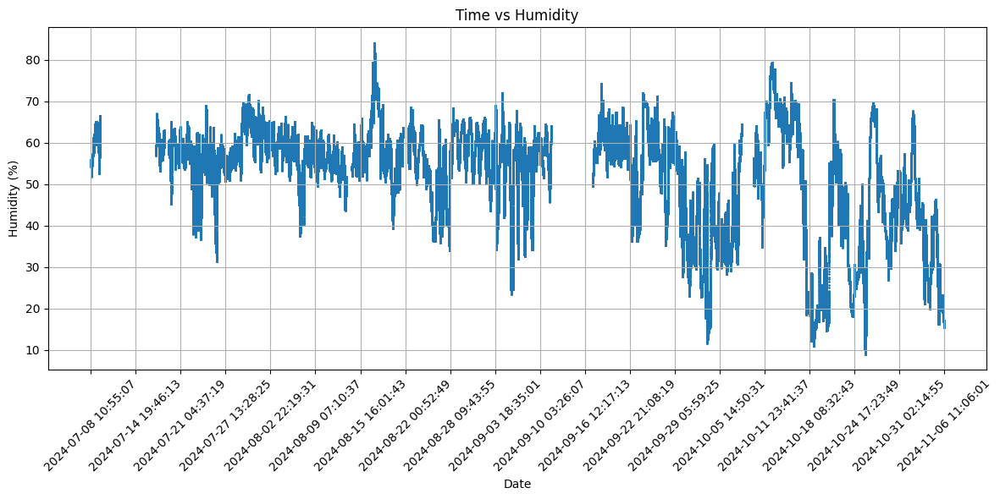

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import os

# Function to load and concatenate data from multiple files in a folder
def load_and_concatenate_files(folder_path):
    """
    Load and concatenate data from all CSV files in a folder.

    Parameters:
    folder_path (str): Path to the folder containing the CSV files.

    Returns:
    pd.DataFrame: A combined DataFrame containing the data from all files.
    """
    dataframes = []
    for file_name in os.listdir(folder_path):
        if file_name.endswith('.txt'):
            file_path = os.path.join(folder_path, file_name)
            df_humidity = pd.read_csv(file_path)
            df_humidity.columns = ['date', 'temperature', 'humidity']
            dataframes.append(df_humidity)
    combined_df = pd.concat(dataframes)
    return combined_df

# Use tkinter to open a dialog and select a folder
# root = tk.Tk()
# root.withdraw()
# folder_path = askdirectory(parent=root, title="Select input data folder")
# root.destroy()
# folder_path = "G:/Shared drives/SpinBot/PEROVSKITE reproducibility project/Data/humidity data"
folder_path = "/content/drive/Shareddrives/SpinBot/PEROVSKITE reproducibility project/Data/humidity data"
# Load and concatenate data
df_humidity = load_and_concatenate_files(folder_path)

# Convert 'date' column to datetime format for better plotting
df_humidity['date'] = pd.to_datetime(df_humidity['date'])

# Ask user if they want to limit the time range
print("Do you want to limit the time range? (yes/no)")
limit_range = input().strip().lower()

if limit_range == 'yes':
    start_date = input("Enter the start date (YYYY-MM-DD): ").strip()
    end_date = input("Enter the end date (YYYY-MM-DD): ").strip()
    start_time = pd.to_datetime(start_date)
    end_time = pd.to_datetime(end_date) + pd.Timedelta(days=1) - pd.Timedelta(seconds=1)
    df_humidity = df_humidity[(df_humidity['date'] >= start_time) & (df_humidity['date'] <= end_time)]

# Plot the time vs humidity without connecting lines between points
plt.figure(figsize=(12, 6))
plt.scatter(df_humidity['date'], df_humidity['humidity'], marker='o', s=1)

plt.xlabel('Date')
plt.ylabel('Humidity (%)')
plt.title('Time vs Humidity')
plt.grid(True)
x_ticks = pd.date_range(start=df_humidity['date'].min(), end=df_humidity['date'].max(), periods=20)
plt.xticks(ticks=x_ticks, labels=[x.strftime('%Y-%m-%d %H:%M:%S') for x in x_ticks], rotation=45)

plt.tight_layout()

# Show the plot
plt.show()


In [ ]:
# Assuming 'df' is your DataFrame and it has columns 'Batch No.', 'Sample #' and 'Batch Fab Date' and 'Batch Start Time'
# Example DataFrame creation for demonstration
# df = pd.DataFrame({
#     'Batch No.': [1, 1, 2, 2, 3, 3, 4, 4],
#     'Sample #': [1, 2, 1, 2, 1, 2, 1, 2],
#     'Batch Fab Date': [2024-10-29, 2024-10-29, 2024-10-29, 2024-10-29, 2024-10-30, 2024-10-30, 2024-10-30, 2024-10-30]
#     'Batch Start Time': [1:30 PM, 1:30 PM, 3:00 PM, 3:00 PM, 1:30 PM, 1:30 PM, 3:00 PM, 3:00 PM ]
# })

Do you want to limit the time range? (yes/no)
no
Enter the minimum batch number to plot: 1
Enter the maximum batch number to plot: 101


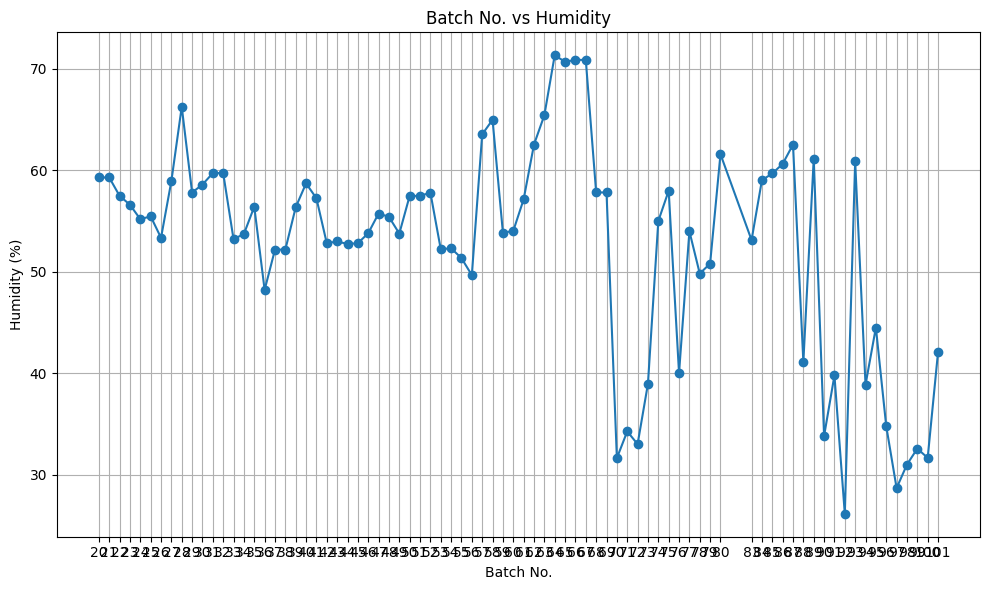

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import os

# Function to load and concatenate data from multiple files in a folder
def load_and_concatenate_files(folder_path):
    """
    Load and concatenate data from all CSV files in a folder.

    Parameters:
    folder_path (str): Path to the folder containing the CSV files.

    Returns:
    pd.DataFrame: A combined DataFrame containing the data from all files.
    """
    dataframes = []
    for file_name in os.listdir(folder_path):
        if file_name.endswith('.txt'):
            file_path = os.path.join(folder_path, file_name)
            df_humidity = pd.read_csv(file_path)
            df_humidity.columns = ['date', 'temperature', 'humidity']
            dataframes.append(df_humidity)
    combined_df = pd.concat(dataframes)
    return combined_df

# Load humidity data
folder_path = "/content/drive/Shareddrives/SpinBot/PEROVSKITE reproducibility project/Data/humidity data"
df_humidity = load_and_concatenate_files(folder_path)

# Convert 'date' column to datetime format for better plotting
df_humidity['date'] = pd.to_datetime(df_humidity['date'])
df_humidity = df_humidity.sort_values('date')  # Ensure the data is sorted by date

# Optionally limit the time range
print("Do you want to limit the time range? (yes/no)")
limit_range = input().strip().lower()

if limit_range == 'yes':
    start_date = input("Enter the start date (YYYY-MM-DD): ").strip()
    end_date = input("Enter the end date (YYYY-MM-DD): ").strip()
    start_time = pd.to_datetime(start_date)
    end_time = pd.to_datetime(end_date) + pd.Timedelta(days=1) - pd.Timedelta(seconds=1)
    df_humidity = df_humidity[(df_humidity['date'] >= start_time) & (df_humidity['date'] <= end_time)]

# Load your batch DataFrame 'df' (You need to replace this with your actual DataFrame)
# Updated 'Batch Start Time' as per your request
# df = pd.DataFrame({
#     'Batch No.': [1, 1, 2, 2, 3, 3, 4, 4],
#     'Sample #': [1, 2, 1, 2, 1, 2, 1, 2],
#     'Batch Fab Date': ['2024-10-29', '2024-10-29', '2024-10-29', '2024-10-29',
#                        '2024-10-30', '2024-10-30', '2024-10-30', '2024-10-30'],
#     'Batch Start Time': ['1:30:00 PM', '1:30:00 PM', '3:30:00 PM', '3:30:00 PM',
#                          '1:30:00 PM', '1:30:00 PM', '3:30:00 PM', '3:30:00 PM']
# })

# Copy the initial DataFrame to a new variable
df_batches = df.copy()

# Replace empty 'Batch Start Time' with '1:00:00 PM'
df_batches['Batch Start Time'] = df_batches['Batch Start Time'].replace('', '1:00:00 PM')
df_batches['Batch Start Time'] = df_batches['Batch Start Time'].fillna('1:00:00 PM')

# Combine 'Batch Fab Date' and 'Batch Start Time' into a single datetime column
df_batches['Batch Fab Date'] = pd.to_datetime(df_batches['Batch Fab Date'])

# Define the datetime format explicitly, including seconds
datetime_format = '%Y-%m-%d %I:%M:%S %p'

df_batches['batch_datetime_str'] = df_batches['Batch Fab Date'].dt.strftime('%Y-%m-%d') + ' ' + df_batches['Batch Start Time']

# Parse the combined string into datetime
df_batches['batch_datetime'] = pd.to_datetime(df_batches['batch_datetime_str'], format=datetime_format, errors='coerce')
df_batches = df_batches.sort_values('batch_datetime')  # Ensure the data is sorted by date

# Drop rows where 'batch_datetime' is NaT due to parsing errors
df_batches = df_batches.dropna(subset=['batch_datetime'])

# Similarly, ensure df_humidity['date'] has no NaT and is sorted
df_humidity = df_humidity.dropna(subset=['date']).sort_values('date')

# Merge the batch data with the humidity data based on the closest datetime within 1 hour tolerance
merged_df = pd.merge_asof(
    df_batches,
    df_humidity,
    left_on='batch_datetime',
    right_on='date',
    direction='nearest',
    tolerance=pd.Timedelta('1h')  # Use 'h' instead of 'H'
)

# Ask the user to select minimum and maximum batch numbers to plot
min_batch = int(input("Enter the minimum batch number to plot: "))
max_batch = int(input("Enter the maximum batch number to plot: "))

# Filter the merged DataFrame based on the selected batch numbers
filtered_df = merged_df[(merged_df['Batch No.'] >= min_batch) & (merged_df['Batch No.'] <= max_batch)]

# Drop any rows where 'humidity' is NaN (i.e., no matching humidity data within 1 hour)
filtered_df = filtered_df.dropna(subset=['humidity'])

# Group by 'Batch No.' and compute the mean humidity for each batch
humidity_per_batch = filtered_df.groupby('Batch No.')['humidity'].mean().reset_index()

# Plot Batch No. vs Humidity
plt.figure(figsize=(10, 6))
plt.plot(humidity_per_batch['Batch No.'], humidity_per_batch['humidity'], marker='o', linestyle='-')
plt.xlabel('Batch No.')
plt.ylabel('Humidity (%)')
plt.title('Batch No. vs Humidity')
plt.grid(True)
# plt.xticks(humidity_per_batch['Batch No.'])
plt.xticks(humidity_per_batch['Batch No.'], humidity_per_batch['Batch No.'].astype(str))

plt.tight_layout()
plt.show()